<a href="https://colab.research.google.com/github/pagrkonecta/Konecta_Test/blob/main/FinalProjectClassification_ABALONE_JAVIER.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<p><img alt="udeA logo" height="160px" src="https://github.com/freddyduitama/images/blob/master/logo.png?raw=true" align="left" hspace="10px" vspace="0px" style="width:107px;height:152px;"></p>
<h1><center>Modelos Predictivos</center></font></h1>
<font  size="4"> 
<p><center>Universidad de Antioquia <br> Facultad de Ingeniería</b></font></center></p>
<center><font size="4">Proyecto Final</font></center>
</font>

##Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns


import statsmodels.api as sm
import scipy.stats as stats

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

# Problem Description

<p><font color='0B5345'><center>Anticipating the age of abalone from physical estimations</center></font></p>

<font color='red'> <center>The project aims to develop a model that can predict the number of rings of an *abalone* based solely on their physical measurements (dimensions and weights). This would allow researchers to estimate the age of the abalone without having to cut into its shell and count the rings, also, based on that, the opportunity to create another model to predict these physical measurements (dimensions and weights) or type of sex (Infant vs Non-Infant).</center></font>

# Introduction



Los haliótidos (Haliotidae) son una familia de moluscos gasterópodos con un único género. los abulones son esencialmente caracoles marinos. este conjunto de datos describe varias características físicas de los haliótidos estas caracteristicas son emparejadas con la cantidad de anillos que se encuentran en el caparazón.

<font color='red'>Algunas de las especies de estos moluscos presentan un gran valor comercial debido a su gran tamaño y volumen; siendo productos de consumo humano además de que sus conchas son en algunos casos simples objetos de colección. Su carne es un plato muy apreciado en Asia Oriental, lo que ha llevado a problemas de conservación.</font>

<font color='green'>Contar los anillos requiere mucho tiempo ademas de ser una tarea difícil, esto proporciona un motivo para construir un algoritmo de aprendizaje automático (utilizando modelos de regresión y/o clasificación) capaz de predecir el número de anillos a partir de otras características físicas (dimensiones fÍsicas o pesos).



<font color='red'> Ademas de lo anterior que estos modelos sirvan para determinar la estructura de tallas y edades de las poblaciones de abulón en el futuro.
es decir, que se pueda orientar la investigación al análisis de la dinámica de la población con un modelo estructurado por edades, combinado con otros modelos. La información básica necesaria para ello es conocer la composición de la biomasa (el número de organismos por tamaños y edades que la componen). Esta información es necesaria para reconstruir la historia de la población. Los cambios en el tiempo de esa estructura reflejarían: los efectos del reemplazamiento, el crecimiento y la mortalidad; la variación del vigor de las clases anuales; y los cambios del promedio de edad reflejarían el incremento o disminución de la especie por la pesca entre otros factores. La estructura de tallas y edades es específica de cada población, refleja la relación de la especie con el ambiente y los efectos de la extracción por pesca.</font>

## Abalone Species

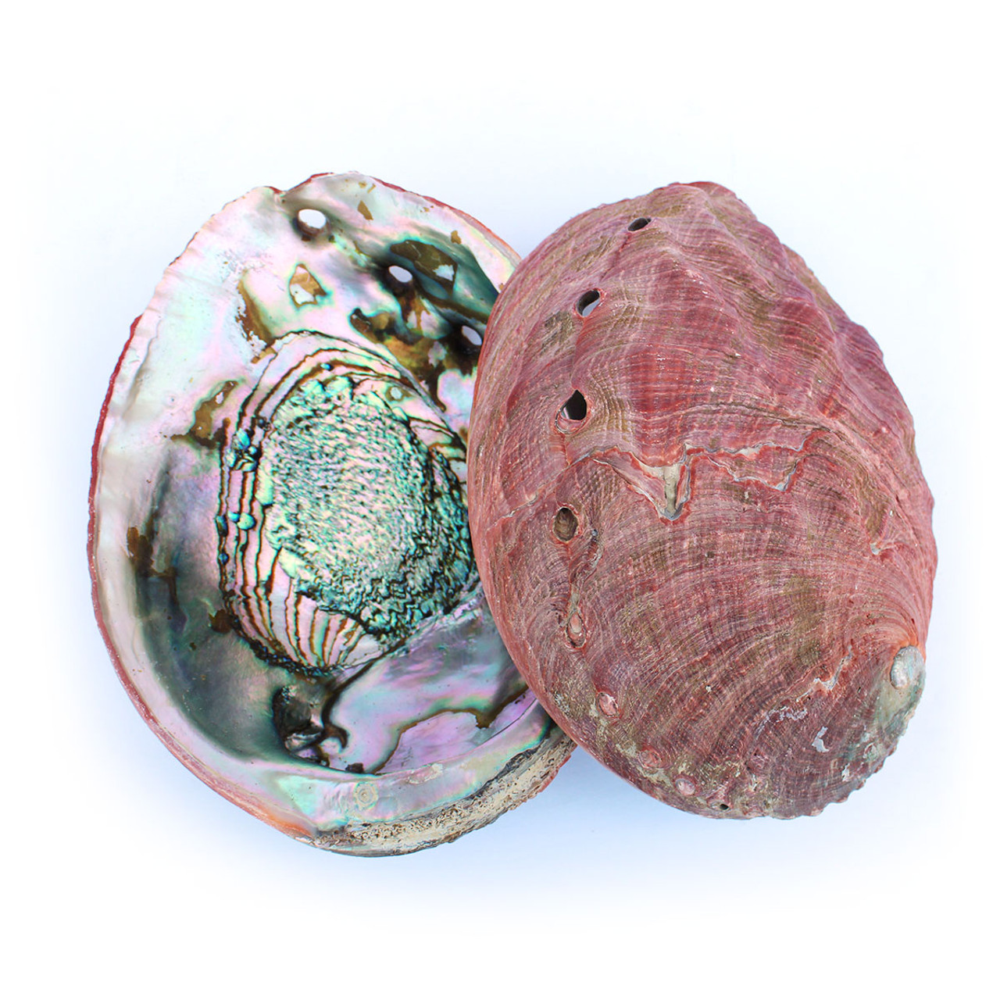

In [ ]:
from IPython.display import Image
Image(filename='/content/drive/MyDrive/Predictive Models/Final Project Regression Classification ABALONE/Images/Abalone_shell_2.jpg', width=500, height=500)

### Machine Learning methods (Classification):



- Logistic Regression
- Support Vector Machines (SVM)
- k-Nearest Neighbors (kNN)
- Decision Tree (DT)
- Gaussian Naive Bayes
- Ensemble Methods (Random Forest, AdaBoost, Gradient Boost, XGBoost)



# Dataset Description

The Abalone Dataset was originally published at the UCI Machine Learning Repository, and can be found at https://archive.ics.uci.edu/ml/datasets/Abalone. The original stated problem is estimate the age an abalone, which can be determined from the number of rings in their shell.

The abalone dataset contains measurements of physical characteristics of different abalones.

- Number of Instances: $4177$

- Number of Attributes: $8$

**There are seven ($7$) predictor variables included in the dataset**. 

The first three ($3$) constitute the **shell measurements**:
- *Length:* longest shell measurement ($mm$)
- *Diameter:* measured perpendicular to length ($mm$)
- *Height:* with meat in a shell ($mm$)

The other four ($4$) variables are related to the **weight** of abalone:
- *Whole weight:* whole abalone weight ($g$)
- *Shucked weight:* weight of meat only ($g$)
- *Viscera weight:* gut weight, after bleeding ($g$)
- *Shell weight:* weight after being dried ($g$)

The response variable, that is the dependent variable in this analysis is:
- <font color='red'>*Rings:*</font> number of rings in the shell ($+1.5$ gives the age in years)

Counting the number of rings in an abalone shell is an expensive method. One possible solution is predict the number of rings of an abalone from characteristics like height, diameter, lenght and weight measurements.
 

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Predictive Models/Final Project Regression Classification ABALONE/Dataset/abalone.csv')

In [ ]:
data.head(15)

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7
5,I,0.425,0.300,0.095,0.3515,0.1410,0.0775,0.120,8
6,F,0.530,0.415,0.150,0.7775,0.2370,0.1415,0.330,20
7,F,0.545,0.425,0.125,0.7680,0.2940,0.1495,0.260,16
8,M,0.475,0.370,0.125,0.5095,0.2165,0.1125,0.165,9
9,F,0.550,0.440,0.150,0.8945,0.3145,0.1510,0.320,19


In [ ]:
data.columns

Index(['Sex', 'Length', 'Diameter', 'Height', 'Whole weight', 'Shucked weight',
       'Viscera weight', 'Shell weight', 'Rings'],
      dtype='object')

View summary of dataset

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4177 entries, 0 to 4176
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Sex             4177 non-null   object 
 1   Length          4177 non-null   float64
 2   Diameter        4177 non-null   float64
 3   Height          4177 non-null   float64
 4   Whole weight    4177 non-null   float64
 5   Shucked weight  4177 non-null   float64
 6   Viscera weight  4177 non-null   float64
 7   Shell weight    4177 non-null   float64
 8   Rings           4177 non-null   int64  
dtypes: float64(7), int64(1), object(1)
memory usage: 293.8+ KB


- Sex: nominal $\rightarrow$ M (male), F (female) and I (infant)
- Length:	continuous variable $\rightarrow$ millimeters	Longest shell measurement
- Diameter:	continuous variable	$\rightarrow$ millimeters	perpendicular to length
- Height:	continuous variable	$\rightarrow$ millimeters	with meat in shell
- Whole weight:	continuous variable $\rightarrow$ 	grams	whole abalone
- Shucked weight:	continuous variable	$\rightarrow$ grams	weight of meat
- Viscera weight:	continuous variable $\rightarrow$ grams	gut weight (after bleeding)
- Shell weight:	continuous	variable $\rightarrow$ grams	after being dried
- Rings:	integer	variable $\rightarrow$	$+1.5$ gives the age in years

In [ ]:
data.describe()

,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
count,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000,4177.000000
mean,0.523992,0.407881,0.139516,0.828742,0.359367,0.180594,0.238831,9.933684
std,0.120093,0.099240,0.041827,0.490389,0.221963,0.109614,0.139203,3.224169
min,0.075000,0.055000,0.000000,0.002000,0.001000,0.000500,0.001500,1.000000
25%,0.450000,0.350000,0.115000,0.441500,0.186000,0.093500,0.130000,8.000000
50%,0.545000,0.425000,0.140000,0.799500,0.336000,0.171000,0.234000,9.000000
75%,0.615000,0.480000,0.165000,1.153000,0.502000,0.253000,0.329000,11.000000
max,0.815000,0.650000,1.130000,2.825500,1.488000,0.760000,1.005000,29.000000


In [ ]:
data.shape

(4177, 9)

There are also no duplicated values

# Preprocesing Data

In [ ]:
data = data.drop_duplicates()

## Missing Values Analysis

In [ ]:
data.isnull().sum()

Sex               0
Length            0
Diameter          0
Height            0
Whole weight      0
Shucked weight    0
Viscera weight    0
Shell weight      0
Rings             0
dtype: int64

## Standardization/Scaling

Se realiza de manera independiente como preprocesado en cada modelo.

#Preliminar Analysis

Se tiene un gran conjunto de datos ($4177$) que contiene nueve ($9$) atributos físicos del abulón. Para ayudar a los investigadores a comprender mejor las características de los abulones, se puede generar arquetipos de perfiles de abulones. Se logra aplicando técnicas de aprendizaje no supervisado (reducción de dimensión), también ayudará a observar valores atípicos o extremos.

Se utiliza el principal component analysis (PCA) para agrupamiento y t-distributed stochastic neighbor embedding (t-SNE) para la visualización. Se realizan las comparaciones en visualizaciones 2D de PCA y t-SNE.

In [ ]:
X = data[['Length', 'Diameter', 'Height', 'Whole weight', 'Shucked weight','Viscera weight', 'Shell weight']]
y = data['Rings']

In [ ]:
X.shape, y.shape

((4177, 7), (4177,))

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
abalonPCA = pca.fit_transform(X)

In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2)
abalonPCA_labels = kmeans.fit_predict(abalonPCA)

In [ ]:
abalonPCA = pd.DataFrame(abalonPCA)
abalonPCA['cluster'] = abalonPCA_labels

In [ ]:
from sklearn.manifold import TSNE
X = abalonPCA.iloc[:,:-1]
Xtsne = TSNE(n_components=2).fit_transform(X)
dftsne = pd.DataFrame(Xtsne)
dftsne['cluster'] = abalonPCA_labels
dftsne.columns = ['x1','x2','cluster']

In [ ]:
pca2 = PCA(n_components=2)
XPCA = pca2.fit_transform(X)
dfPCA = pd.DataFrame(XPCA)
dfPCA['cluster'] = abalonPCA_labels
dfPCA.columns = ['x1','x2','cluster']

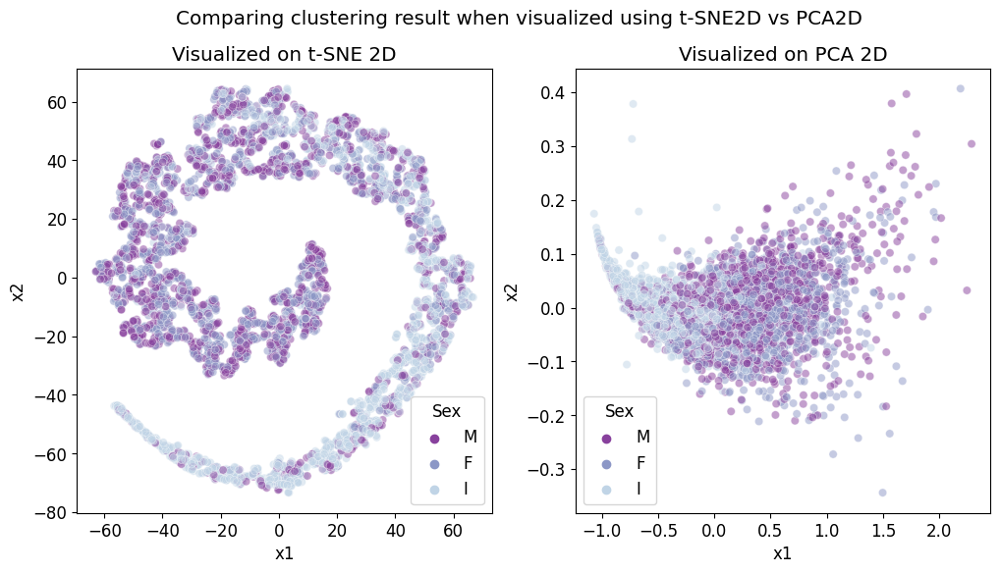

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
sns.scatterplot(data=dftsne, x='x1', y='x2', hue=data.Sex, legend="full", palette='BuPu_r', alpha=0.5, ax=ax[0]) # hue='cluster' 
ax[0].set_title('Visualized on t-SNE 2D')
sns.scatterplot(data=dfPCA, x='x1', y='x2', hue=data.Sex, legend="full", palette='BuPu_r', alpha=0.5, ax=ax[1]) # hue='cluster'
ax[1].set_title('Visualized on PCA 2D')
fig.suptitle('Comparing clustering result when visualized using t-SNE2D vs PCA2D')
plt.show()

In [ ]:
data.var()

Length             0.014422
Diameter           0.009849
Height             0.001750
Whole weight       0.240481
Shucked weight     0.049268
Viscera weight     0.012015
Shell weight       0.019377
Rings             10.395266
dtype: float64

### Check Sample Size Assumption

In [ ]:
print('Observations of each Rings:')
print(data['Rings'].value_counts())

Observations of each Rings:
9     689
10    634
8     568
11    487
7     391
12    267
6     259
13    203
14    126
5     115
15    103
16     67
17     58
4      57
18     42
19     32
20     26
3      15
21     14
23      9
22      6
27      2
24      2
1       1
26      1
29      1
2       1
25      1
Name: Rings, dtype: int64


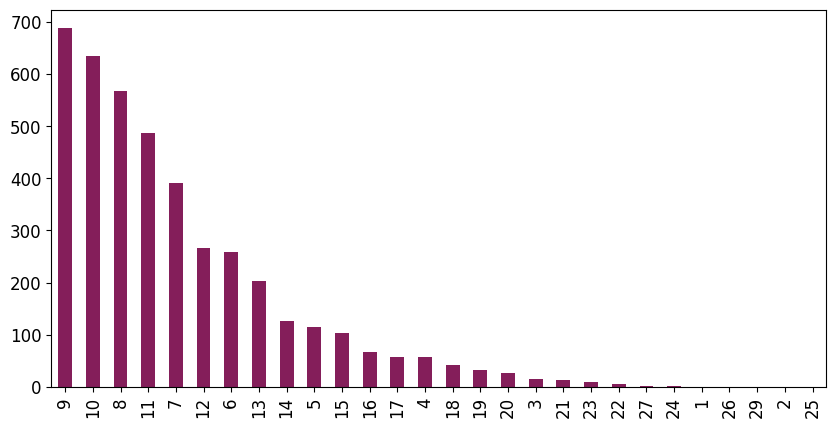

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig = plt.figure(figsize=(10, 5))

data['Rings'].value_counts().plot(kind='bar', color=colors[1])
plt.show()

The *barplot* shows us that most Abalones here are amongst $7$ and $11$ rings, with high predominance of $9$ rings.

In [ ]:
print('Observations of each sex type:')
print(data['Sex'].value_counts()) 

Observations of each sex type:
M    1528
I    1342
F    1307
Name: Sex, dtype: int64


# Exploratory Descriptive Analysis (EDA)

## Univariate Plots

<p><font color='0B5345'><center>Examinar las distribuciones es uno de los primeros pasos para modelar los datos y hacer predicciones.</center></font></p>

Se analiza de manera individual la distribución de los *Anillos* *(característica objetivo)*, el resto de caracteristicas se agrupan en dos conjuntos, esto permite obtener una mejor perpectiva del conjunto de datos.

Un conjunto denominado *Tamaño*, que contiene características que representan las dimensiones del abulón, conjunto denominado *Peso*, que contiene las diferentes características de peso y un tercer grupo compuesto únicamente por la característica *Sexo*. Las variables continuas o cuantitativas se analizan mediante histogramas y diagramas de caja, mientras que Las características categóricos se analizan mediante diagramas de barras.

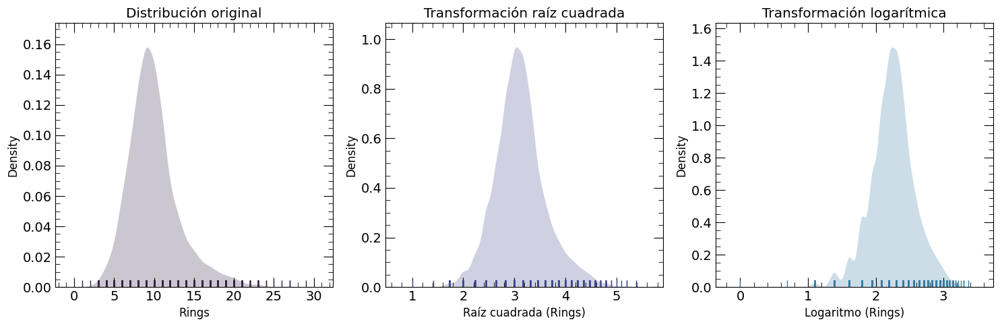

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('mako', 5)

fig = plt.figure(figsize=(15, 5), dpi=100)

ax = fig.add_subplot(1, 3, 1)
sns.distplot(data.Rings, bins=10, hist= False, rug=True, color=colors[0], kde_kws = {'shade': True, 'linewidth': 0},ax=ax)
ax.set_title('Distribución original')
ax.set_xlabel('Rings') 
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)

ax = fig.add_subplot(1, 3, 2)
sns.distplot(np.sqrt(data.Rings),  bins=10, hist=False, rug=True, color=colors[1], kde_kws = {'shade': True, 'linewidth': 0}, ax=ax)
ax.set_title('Transformación raíz cuadrada')
ax.set_xlabel('Raíz cuadrada (Rings)') 
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)

ax = fig.add_subplot(1, 3, 3)
sns.distplot(np.log(data.Rings), bins=10, hist= False, rug=True, color=colors[2], kde_kws = {'shade': True, 'linewidth': 0}, ax=ax)
ax.set_title('Transformación logarítmica')
ax.set_xlabel('Logaritmo (Rings)') 
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)

fig.tight_layout()
plt.show()

### Target Attribute

In [ ]:
data['Rings'].describe()

count    4177.000000
mean        9.933684
std         3.224169
min         1.000000
25%         8.000000
50%         9.000000
75%        11.000000
max        29.000000
Name: Rings, dtype: float64

In [ ]:
from scipy.stats import skew
from scipy.stats import kurtosis

# Calculate the skewness
print('Skewness:\n', skew(data['Rings'], axis=0, bias=True))
# Calculate the kurtosis
print('Kurtosis:\n', kurtosis(data['Rings'], axis=0, bias=True))

Skewness:
 1.1137017739656028
Kurtosis:
 2.3264623620128333


La asimetría y la medida de curtosis de Pearson se proporcionan a continuación.

Hay mucha asimetría presente en los datos (Asimetría > 0: más peso en la cola izquierda de la distribución). El sesgo más significativo es la variable objetivo anillos (Para una distribución con Curtosis < 3: Se llama platicúrtica).


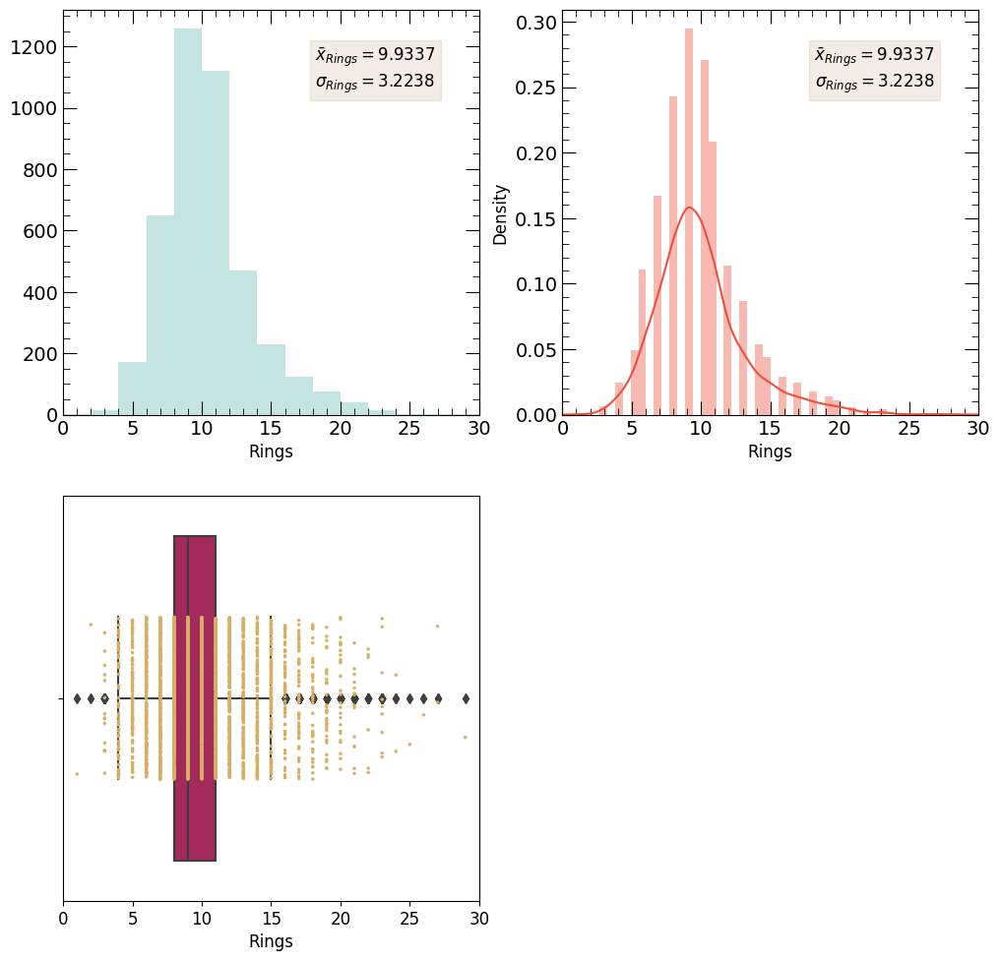

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100
colors=sns.color_palette('BrBG', 10)
colors2=sns.color_palette('rocket', 10)

rows = 2
cols = 2
i = 0

fig = plt.figure(figsize=(12, 12))

i += 1
ax = fig.add_subplot(rows, cols, i)
sns.distplot(data['Rings'], kde=False, bins=range(0, 31, 2), color=colors[7])
plt.xticks(range(0, 35, 5))
plt.xlim(0, 30)
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_Rings = '\n'.join((r'$\bar{x}_{Rings}=%.4f$' % (np.mean(data['Rings'])), r'$\sigma_{Rings}=%.4f$' % (np.std(data['Rings']))))
txt = plt.text(0.75, 0.85, statistical_Rings, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))

i += 1
ax = fig.add_subplot(rows, cols, i)
sns.distplot(data['Rings'], color=colors2[6])
plt.xticks(range(0, 35, 5))
plt.xlim(0, 30)
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_Rings = '\n'.join((r'$\bar{x}_{Rings}=%.4f$' % (np.mean(data['Rings'])), r'$\sigma_{Rings}=%.4f$' % (np.std(data['Rings']))))
txt = plt.text(0.75, 0.85, statistical_Rings, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))

i += 1
ax = fig.add_subplot(rows, cols, i)
sns.boxplot(data['Rings'], color=colors2[4])
sns.stripplot(x='Rings', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)
plt.xticks(range(0, 35, 5))
plt.xlim(0, 30)

plt.show()

<font color='red'>El análisis muestra que los valores del atributo Anillo oscilan entre 1 y 29 anillos en un espécimen de abulón. Sin embargo, los valores más frecuentes de Anillos están muy concentrados alrededor de la media de la distribución ($\bar{x}_{Rings}=9.933684$). Se puede observar que es posible aproximar la distribución de este atributo a una curva normal.</font>

### Size Attributes

<font color='red'>Se realiza el análisis de las características que representan las dimensiones físicas de un espécimen de abulón. Estas características son: Longitud, Diámetro y Altura. Para cada una de estas características se realiza los gráficos de histograma: se trazan dos histogramas y su respectivo diagrama de caja y bigotes. El primer histograma es un histograma de densidad (estimación Kernel de la densidad), y el segundo son las frecuencias absolutas de la característica, (Se realizaron algunos ajustes en las marcas y los intervalos). Se puede observar una distribución normal aproximada (La Longitud y el Diámetro están significativamente sesgados hacia la izquierda). También se puede observar un pico alto formado por el histograma de Altura. Al analizar el diagrama de caja de Altura, se concluye que el pico alto se forma debido a la presencia de dos observaciones que se encuentran mucho más allá de las posiciones centrales de la distribución.

Los gráficos de histograma para las características de dimensión del abulón se muestran a continuación:</font>

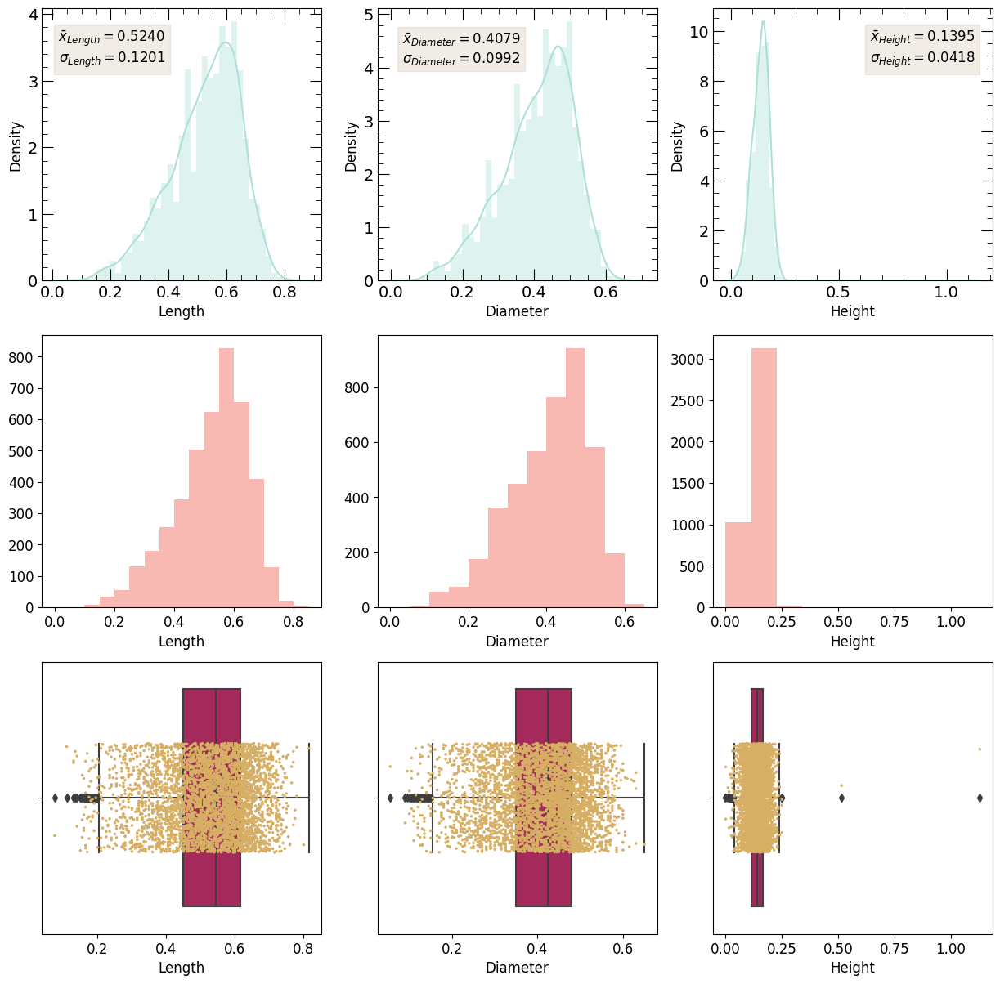

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('BrBG', 10)
colors2=sns.color_palette('rocket', 10)

fig = plt.figure(figsize=(15, 15))

rows = 3
cols = 3
i = 0

i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Length'], color=colors[6])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_Length = '\n'.join((r'$\bar{x}_{Length}=%.4f$' % (np.mean(data['Length'])), r'$\sigma_{Length}=%.4f$' % (np.std(data['Length']))))
txt = plt.text(0.25, 0.85, statistical_Length, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))
    
i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Diameter'], color=colors[6])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_Diameter = '\n'.join((r'$\bar{x}_{Diameter}=%.4f$' % (np.mean(data['Diameter'])), r'$\sigma_{Diameter}=%.4f$' % (np.std(data['Diameter']))))
txt = plt.text(0.3, 0.85, statistical_Diameter, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))

i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Height'], color=colors[6])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_Height = '\n'.join((r'$\bar{x}_{Height}=%.4f$' % (np.mean(data['Height'])), r'$\sigma_{Height}=%.4f$' % (np.std(data['Height']))))
txt = plt.text(0.75, 0.85, statistical_Height, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))

i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Length'], kde=False, bins=np.arange(0.0, 0.9, 0.05), color=colors2[6])

i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Diameter'], kde=False, bins=np.arange(0.0, 0.7, 0.05), color=colors2[6])

i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Height'], kde=False, bins=10, color=colors2[6])

i += 1
ax = plt.subplot(rows, cols, i)
sns.boxplot(data['Length'], color=colors2[4])
sns.stripplot(x='Length', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

i += 1
ax = plt.subplot(rows, cols, i)
sns.boxplot(data['Diameter'], color=colors2[4])
sns.stripplot(x='Diameter', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

i += 1
ax = plt.subplot(rows, cols, i)
sns.boxplot(data['Height'], color=colors2[4])
sns.stripplot(x='Height', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

plt.show()

<font color='red'>Se realiza un filtro de los valores atípicos en la característica Altura, para obtener una visualización más realista de la distribución del atributo.</font>

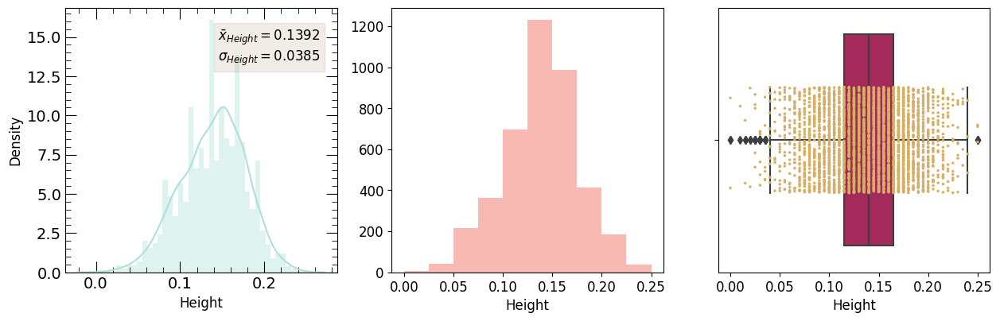

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('BrBG', 10)
colors2=sns.color_palette('rocket', 10)

# removing outliers 
data = data[data['Height'] < 0.3]

fig = plt.figure(figsize=(15, 15))

rows = 3
cols = 3
i = 0

i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Height'], color=colors[6])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_Height = '\n'.join((r'$\bar{x}_{Height}=%.4f$' % (np.mean(data['Height'])), r'$\sigma_{Height}=%.4f$' % (np.std(data['Height']))))
txt = plt.text(0.75, 0.85, statistical_Height, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))

i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Height'], kde=False, bins=10, color=colors2[6])

i += 1
ax = plt.subplot(rows, cols, i)
sns.boxplot(data['Height'], color=colors2[4])
sns.stripplot(x='Height', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

plt.show()

### Weight Attributes

<font color='red'>Se realiza el análisis de las características del peso de un espécimen de abulón. Estas características son: Peso entero, Peso espécimen (sin concha, Peso de las vísceras, Peso de la concha. Para cada una de estas características se realiza los gráficos de histograma: se trazan dos histogramas y su respectivo diagrama de caja y bigotes. El primer histograma es un histograma de densidad (estimación Kernel de la densidad, y el segundo son las frecuencias absolutas de la característica, (Se realizaron algunos ajustes en las marcas y los intervalos). Se puede observar una distribución normal aproximada (Para las características del peso de un espécimen, la curva de campana es un poco más grande, algunas muestran un grado de uniformidad). Las características están significativamente sesgadas hacia la derecha, con muchos valores atípicos. Esto se presenta debido a que aproximadamente un tercio del conjunto de datos está poblado por infantes ($1342$ Infants) los cuales tienen menores pesos que los adultos. 

Los gráficos de histograma para las características de peso del abulón se muestran a continuación:</font> 

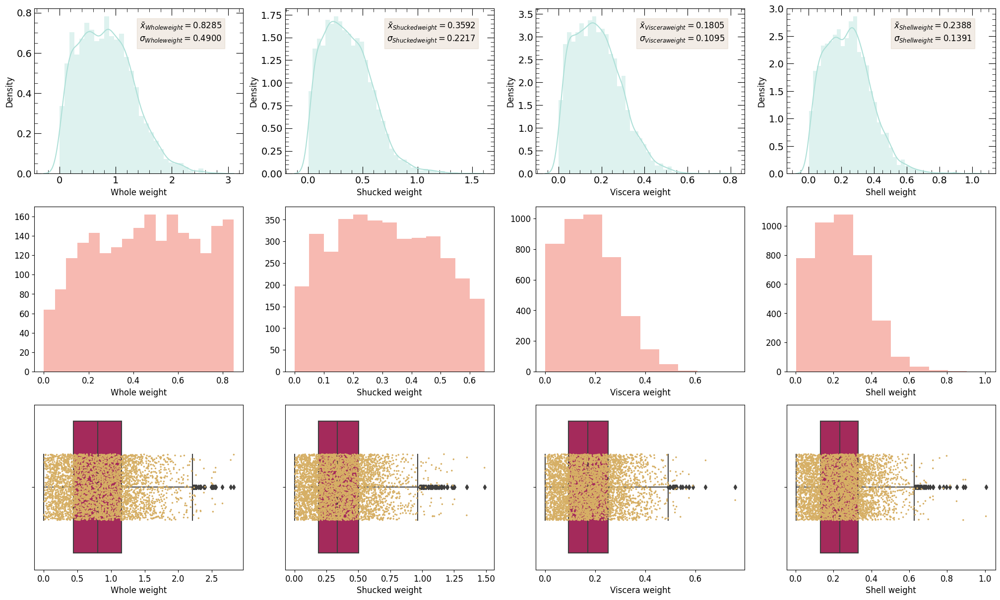

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('BrBG', 10)
colors2=sns.color_palette('rocket', 10)

fig = plt.figure(figsize=(25, 15))

rows = 3
cols = 4
i = 0

i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Whole weight'], color=colors[6])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_Whole_weight = '\n'.join((r'$\bar{x}_{Whole weight}=%.4f$' % (np.mean(data['Whole weight'])), r'$\sigma_{Whole weight}=%.4f$' % (np.std(data['Whole weight']))))
txt = plt.text(0.70, 0.85, statistical_Whole_weight, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))
    
i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Shucked weight'], color=colors[6])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_Shucked_weight = '\n'.join((r'$\bar{x}_{Shucked weight}=%.4f$' % (np.mean(data['Shucked weight'])), r'$\sigma_{Shucked weight}=%.4f$' % (np.std(data['Shucked weight']))))
txt = plt.text(0.70, 0.85, statistical_Shucked_weight, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))

i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Viscera weight'], color=colors[6])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_Viscera_weight = '\n'.join((r'$\bar{x}_{Viscera weight}=%.4f$' % (np.mean(data['Viscera weight'])), r'$\sigma_{Viscera weight}=%.4f$' % (np.std(data['Viscera weight']))))
txt = plt.text(0.70, 0.85, statistical_Viscera_weight, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))

i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Shell weight'], color=colors[6])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_Shell_weight = '\n'.join((r'$\bar{x}_{Shell weight}=%.4f$' % (np.mean(data['Shell weight'])), r'$\sigma_{Shell weight}=%.4f$' % (np.std(data['Shell weight']))))
txt = plt.text(0.70, 0.85, statistical_Shell_weight, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))

i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Whole weight'], kde=False, bins=np.arange(0.0, 0.9, 0.05), color=colors2[6])

i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Shucked weight'], kde=False, bins=np.arange(0.0, 0.7, 0.05), color=colors2[6])

i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Viscera weight'], kde=False, bins=10, color=colors2[6])

i += 1
ax = plt.subplot(rows, cols, i)
sns.distplot(data['Shell weight'], kde=False, bins=10, color=colors2[6])

i += 1
ax = plt.subplot(rows, cols, i)
sns.boxplot(data['Whole weight'], color=colors2[4])
sns.stripplot(x='Whole weight', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

i += 1
ax = plt.subplot(rows, cols, i)
sns.boxplot(data['Shucked weight'], color=colors2[4])
sns.stripplot(x='Shucked weight', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

i += 1
ax = plt.subplot(rows, cols, i)
sns.boxplot(data['Viscera weight'], color=colors2[4])
sns.stripplot(x='Viscera weight', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

i += 1
ax = plt.subplot(rows, cols, i)
sns.boxplot(data['Shell weight'], color=colors2[4])
sns.stripplot(x='Shell weight', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

plt.show()

### Sex Attributes

<font color='red'>La característica Sexo es una variable de tipo categórica para la cual los valores son: M para un espécimen de abulón Macho, F para espécimen de abulón Hembra e I para un espécimen de abulón Infante (un abulón que no es adulto). Se realiza el análisis del recuento de cada categoría con un gráfico de barras y se concluye que en relación con este característica, el conjunto de datos está equilibrado.</font>

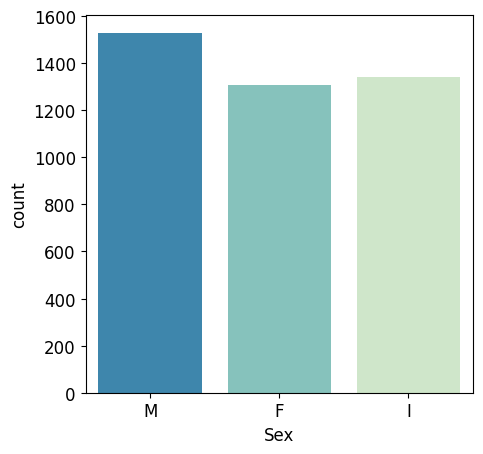

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('GnBu_r', 3)
colors2=sns.color_palette('rocket', 10)

fig = plt.figure(figsize=(5, 5))

bar = sns.countplot(data.Sex, palette=colors)
plt.show()

<font color='red'>Comprobar la distribución de variables

Se trazan los histogramas para verificar las distribuciones de variables y averiguar si son normales o sesgadas, además de su asimetría.</font>


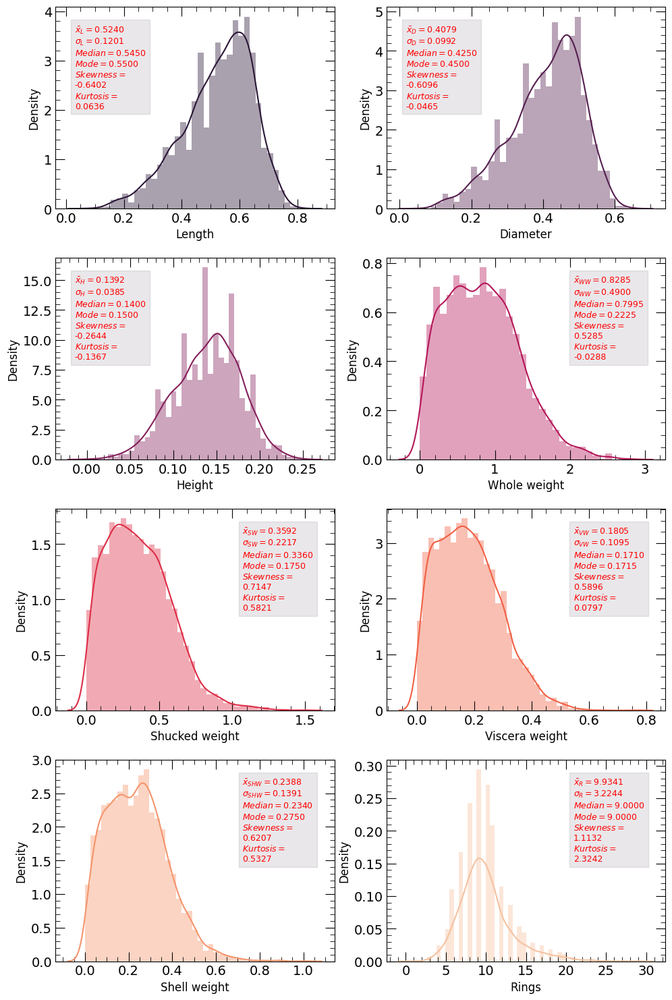

In [ ]:
import statistics
from scipy.stats import skew
from scipy.stats import kurtosis

mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
colors=sns.color_palette('rocket', 8)

fig = plt.figure(figsize=(10, 15), dpi=100)

ax = fig.add_subplot(4, 2, 1)
sns.distplot(data['Length'], color=colors[0])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_length = '\n'.join((r'$\bar{x}_{L}=%.4f$' % (np.mean(data['Length'])), r'$\sigma_{L}=%.4f$' % (np.std(data['Length'])),
                      r'$Median=%.4f$' % (np.median(data['Length'])), r'$Mode=%.4f$' % (statistics.mode(data['Length'])), 
                      r'$Skewness=$', str(round(skew(data['Length'], axis=0, bias=True),4)), 
                      r'$Kurtosis=$', str(round(kurtosis(data['Length'], axis=0, bias=True),4))))
txt = plt.text(0.07, 0.70, statistical_length, horizontalalignment='left', verticalalignment='center', transform=ax.transAxes, fontdict={'size':9, 'color':'red'})
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))


ax = fig.add_subplot(4, 2, 2)
sns.distplot(data['Diameter'], color=colors[1])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_diameter = '\n'.join((r'$\bar{x}_{D}=%.4f$' % (np.mean(data['Diameter'])), r'$\sigma_{D}=%.4f$' % (np.std(data['Diameter'])),
                      r'$Median=%.4f$' % (np.median(data['Diameter'])), r'$Mode=%.4f$' % (statistics.mode(data['Diameter'])), 
                      r'$Skewness=$', str(round(skew(data['Diameter'], axis=0, bias=True),4)), 
                      r'$Kurtosis=$', str(round(kurtosis(data['Diameter'], axis=0, bias=True),4))))
txt = plt.text(0.07, 0.70, statistical_diameter, horizontalalignment='left', verticalalignment='center', transform=ax.transAxes, fontdict={'size':9, 'color':'red'})
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))

ax = fig.add_subplot(4, 2, 3)
sns.distplot(data['Height'], color=colors[2])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_height ='\n'.join((r'$\bar{x}_{H}=%.4f$' % (np.mean(data['Height'])), r'$\sigma_{H}=%.4f$' % (np.std(data['Height'])),
                      r'$Median=%.4f$' % (np.median(data['Height'])), r'$Mode=%.4f$' % (statistics.mode(data['Height'])), 
                      r'$Skewness=$', str(round(skew(data['Height'], axis=0, bias=True),4)), 
                      r'$Kurtosis=$', str(round(kurtosis(data['Height'], axis=0, bias=True),4))))
txt = plt.text(0.07, 0.70, statistical_height, horizontalalignment='left', verticalalignment='center', transform=ax.transAxes, fontdict={'size':9, 'color':'red'})
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))

ax = fig.add_subplot(4, 2, 4)
sns.distplot(data['Whole weight'], color=colors[3])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_whole_weight ='\n'.join((r'$\bar{x}_{WW}=%.4f$' % (np.mean(data['Whole weight'])), r'$\sigma_{WW}=%.4f$' % (np.std(data['Whole weight'])),
                      r'$Median=%.4f$' % (np.median(data['Whole weight'])), r'$Mode=%.4f$' % (statistics.mode(data['Whole weight'])), 
                      r'$Skewness=$', str(round(skew(data['Whole weight'], axis=0, bias=True),4)), 
                      r'$Kurtosis=$', str(round(kurtosis(data['Whole weight'], axis=0, bias=True),4))))
txt = plt.text(0.67, 0.70, statistical_whole_weight, horizontalalignment='left', verticalalignment='center', transform=ax.transAxes, fontdict={'size':9, 'color':'red'})
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))

ax = fig.add_subplot(4, 2, 5)
sns.distplot(data['Shucked weight'], color=colors[4])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_shucked_weight ='\n'.join((r'$\bar{x}_{SW}=%.4f$' % (np.mean(data['Shucked weight'])), r'$\sigma_{SW}=%.4f$' % (np.std(data['Shucked weight'])),
                      r'$Median=%.4f$' % (np.median(data['Shucked weight'])), r'$Mode=%.4f$' % (statistics.mode(data['Shucked weight'])), 
                      r'$Skewness=$', str(round(skew(data['Shucked weight'], axis=0, bias=True),4)), 
                      r'$Kurtosis=$', str(round(kurtosis(data['Shucked weight'], axis=0, bias=True),4))))
txt = plt.text(0.67, 0.70, statistical_shucked_weight, horizontalalignment='left', verticalalignment='center', transform=ax.transAxes, fontdict={'size':9, 'color':'red'})
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))

ax = fig.add_subplot(4, 2, 6)
sns.distplot(data['Viscera weight'], color=colors[5])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_viscera_weight ='\n'.join((r'$\bar{x}_{VW}=%.4f$' % (np.mean(data['Viscera weight'])), r'$\sigma_{VW}=%.4f$' % (np.std(data['Viscera weight'])),
                      r'$Median=%.4f$' % (np.median(data['Viscera weight'])), r'$Mode=%.4f$' % (statistics.mode(data['Viscera weight'])), 
                      r'$Skewness=$', str(round(skew(data['Viscera weight'], axis=0, bias=True),4)), 
                      r'$Kurtosis=$', str(round(kurtosis(data['Viscera weight'], axis=0, bias=True),4))))
txt = plt.text(0.67, 0.70, statistical_viscera_weight , horizontalalignment='left', verticalalignment='center', transform=ax.transAxes, fontdict={'size':9, 'color':'red'})
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))

ax = fig.add_subplot(4, 2, 7)
sns.distplot(data['Shell weight'], color=colors[6])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_shell_weight ='\n'.join((r'$\bar{x}_{SHW}=%.4f$' % (np.mean(data['Shell weight'])), r'$\sigma_{SHW}=%.4f$' % (np.std(data['Shell weight'])),
                      r'$Median=%.4f$' % (np.median(data['Shell weight'])), r'$Mode=%.4f$' % (statistics.mode(data['Shell weight'])), 
                      r'$Skewness=$', str(round(skew(data['Shell weight'], axis=0, bias=True),4)), 
                      r'$Kurtosis=$', str(round(kurtosis(data['Shell weight'], axis=0, bias=True),4))))
txt = plt.text(0.67, 0.70, statistical_shell_weight, horizontalalignment='left', verticalalignment='center', transform=ax.transAxes, fontdict={'size':9, 'color':'red'})
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))


ax = fig.add_subplot(4, 2, 8)
sns.distplot(data['Rings'], color=colors[7])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_rings ='\n'.join((r'$\bar{x}_{R}=%.4f$' % (np.mean(data['Rings'])), r'$\sigma_{R}=%.4f$' % (np.std(data['Rings'])),
                      r'$Median=%.4f$' % (np.median(data['Rings'])), r'$Mode=%.4f$' % (statistics.mode(data['Rings'])), 
                      r'$Skewness=$', str(round(skew(data['Rings'], axis=0, bias=True),4)), 
                      r'$Kurtosis=$', str(round(kurtosis(data['Rings'], axis=0, bias=True),4))))
txt = plt.text(0.67, 0.70, statistical_rings, horizontalalignment='left', verticalalignment='center', transform=ax.transAxes, fontdict={'size':9, 'color':'red'})
txt.set_bbox(dict(facecolor=colors[0], edgecolor=colors[0], alpha=0.1))


fig.tight_layout()
plt.show()


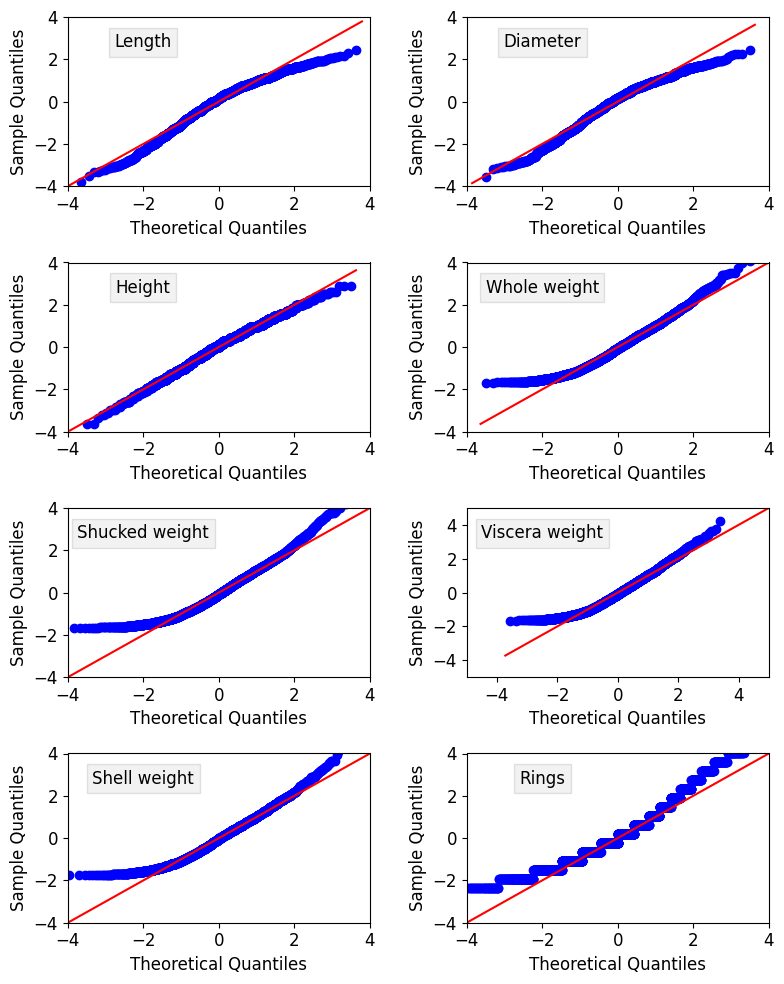

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12

fig = plt.figure(figsize=(8, 10), dpi=100)

ax = fig.add_subplot(4, 2, 1)
sm.graphics.qqplot(data['Length'], stats.t, line='45', fit=True, ax=ax)
ax.set_xlim(-4, 4)
ax.set_ylim(-4, 4)
txt = ax.text(0.25, 0.85, 'Length', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor='grey', alpha=0.1))

ax = fig.add_subplot(4, 2, 2)
sm.graphics.qqplot(data['Diameter'], stats.t, line='45', fit=True, ax=ax)
ax.set_xlim(-4, 4)
ax.set_ylim(-4, 4)
txt = ax.text(0.25, 0.85, 'Diameter', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor='grey', alpha=0.1))

ax = fig.add_subplot(4, 2, 3)
sm.graphics.qqplot(data['Height'], stats.t, line='45', fit=True, ax=ax)
ax.set_xlim(-4, 4)
ax.set_ylim(-4, 4)
txt = ax.text(0.25, 0.85, 'Height', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor='grey', alpha=0.1))

ax = fig.add_subplot(4, 2, 4)
sm.graphics.qqplot(data['Whole weight'], stats.t, line='45', fit=True, ax=ax)
ax.set_xlim(-4, 4)
ax.set_ylim(-4, 4)
txt = ax.text(0.25, 0.85, 'Whole weight', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor='grey', alpha=0.1))

ax = fig.add_subplot(4, 2, 5)
sm.graphics.qqplot(data['Shucked weight'], stats.t, line='45', fit=True, ax=ax)
ax.set_xlim(-4, 4)
ax.set_ylim(-4, 4)
txt = ax.text(0.25, 0.85, 'Shucked weight', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor='grey', alpha=0.1))

ax = fig.add_subplot(4, 2, 6)
sm.graphics.qqplot(data['Viscera weight'], stats.t, line='45', fit=True, ax=ax)
ax.set_xlim(-5, 5)
ax.set_ylim(-5, 5)
txt = ax.text(0.25, 0.85, 'Viscera weight', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor='grey', alpha=0.1))

ax = fig.add_subplot(4, 2, 7)
sm.graphics.qqplot(data['Shell weight'], stats.t, line='45', fit=True, ax=ax)
ax.set_xlim(-4, 4)
ax.set_ylim(-4, 4)
txt = ax.text(0.25, 0.85, 'Shell weight', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor='grey', alpha=0.1))

ax = fig.add_subplot(4, 2, 8)
sm.graphics.qqplot(data['Rings'], stats.t, line='45', fit=True, ax=ax)
ax.set_xlim(-4, 4)
ax.set_ylim(-4, 4)
txt = ax.text(0.25, 0.85, 'Rings', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor='grey', alpha=0.1))

fig.tight_layout()
plt.show()

If the points on the plot fall roughly along a straight diagonal line, then we typically assume a dataset is normally distributed.

<font color='red'> In this case, the points on this plots clearly don't fall along the red line, therefore we would not assume that this features in the dataset is normally distributed.</font>

The objective of the study is to predict the number of Rings, the analysis of each variable is also done concerning the response variable Rings. By analyzing the data, you can start to get ideas about which variables are most related to the Rings and in what way.

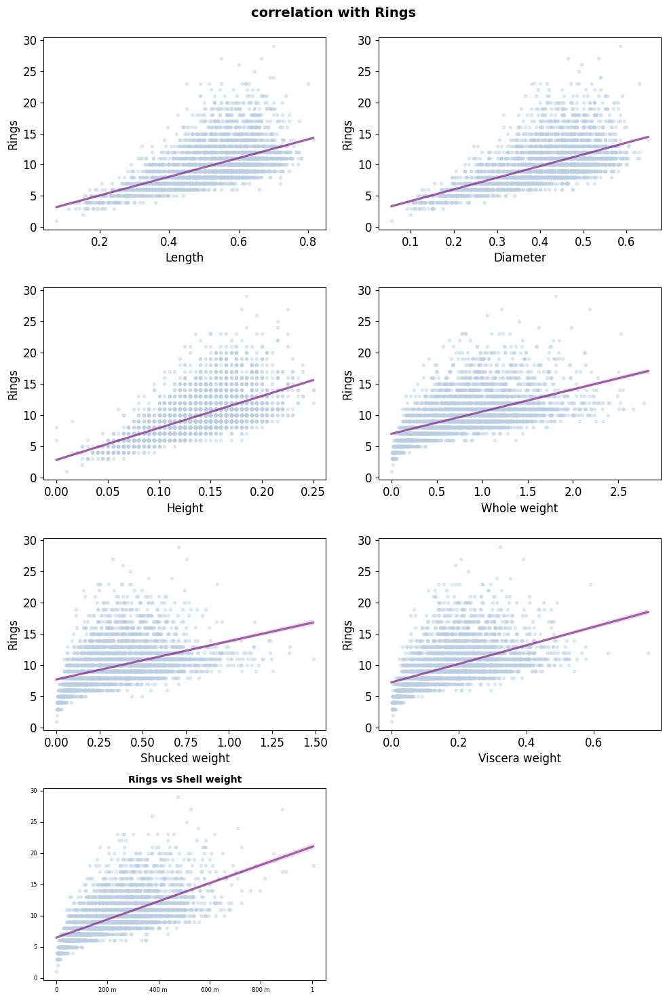

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12

# Ajustar número de subplots en función del número de columnas
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 15), dpi=100)

data_frame = pd.DataFrame(data)
axes = axes.flat

columnas_numericas = data_frame.select_dtypes(include=['float64', 'int']).columns
columnas_numericas = columnas_numericas.drop(['Rings'])

colors=sns.color_palette('BuPu_r', 10)

for i, columnas in enumerate(columnas_numericas):
  sns.regplot(x = data[columnas], y = data['Rings'], color = colors[7], marker = '.', scatter_kws = {"alpha":0.4}, line_kws = {"color":colors[1],"alpha":0.7}, ax = axes[i])
    
axes[i].set_title(f'Rings vs {columnas}', fontsize = 10, fontweight = "bold")
axes[i].yaxis.set_major_formatter(mpl.ticker.EngFormatter())
axes[i].xaxis.set_major_formatter(mpl.ticker.EngFormatter())
axes[i].tick_params(labelsize = 6)
axes[i].set_xlabel("")
axes[i].set_ylabel("")

# Se eliminan los axes vacíos
for i in [7]:
  fig.delaxes(axes[i])

fig.tight_layout()
plt.subplots_adjust(top=0.95)
fig.suptitle('correlation with Rings', fontsize = 14, fontweight = 'bold')
plt.show()

### Check Normality

Targed Attribute

In [ ]:
# Shapiro–Wilk test
print(stats.shapiro(data['Rings']))
# Anderson–Darling test
print(stats.anderson(data['Rings'], dist='norm'))
# Kolmogorov–Smirnov test 
print(stats.kstest(data['Rings'], 'norm'))
# D'Agostino's K-squared test
print(stats.normaltest(data['Rings']))

ShapiroResult(statistic=0.9311864376068115, pvalue=3.3708234559333475e-40)
AndersonResult(statistic=78.49351982864937, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.091]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.9981710600522022, pvalue=0.0)
NormaltestResult(statistic=812.4553823939589, pvalue=3.7805528780359457e-177)


From the output we can see that the test statistic is $0.9311$ and the corresponding p-value is $3.3708\times10^{-40}$(extremely close to zero).

Since the *p-value* is less than $.05$, we reject the null hypothesis of the Shapiro-Wilk test.

<font color='red'> This means we have sufficient evidence to say that the sample data does not come from a normal distribution.</font>

Other Attributes

In [ ]:
from scipy.stats import shapiro 
from scipy.stats import kstest
from scipy.stats import normaltest

# Size Attributes

# Shapiro–Wilk test
print(stats.shapiro(data['Length']))
# Anderson–Darling test
print(stats.anderson(data['Length'], dist='norm'))
# Kolmogorov–Smirnov test 
print(stats.kstest(data['Length'], 'norm'))
# D'Agostino's K-squared test
print(stats.normaltest(data['Length']))

# K^2 de D’Agostino
statistic, p = normaltest(data['Length'])
print('Estadisticos=%.4f, p=%.4f' % (statistic, p))
# Interpretación
alpha = 0.05
if p > alpha:
   print('La muestra parece Gaussiana o Normal (no se rechaza la hipótesis nula H0)')
else:
   print('La muestra no parece Gaussiana o Normal (se rechaza la hipótesis nula H0)')

ShapiroResult(statistic=0.9695959091186523, pvalue=7.111654607017173e-29)
AndersonResult(statistic=36.71788351843679, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.091]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.5752821486471413, pvalue=0.0)
NormaltestResult(statistic=242.41045607700073, pvalue=2.2974088253753984e-53)
Estadisticos=242.4105, p=0.0000
La muestra no parece Gaussiana o Normal (se rechaza la hipótesis nula H0)


From the output we can see that the test statistic is $0.9696$ and the corresponding p-value is $7.377\times10^{-29}$(extremely close to zero).

Since the *p-value* is less than $.05$, we reject the null hypothesis of the Shapiro-Wilk test.

<font color='red'> This means we have sufficient evidence to say that the sample data does not come from a normal distribution.</font>



In [ ]:
from scipy.stats import shapiro 
from scipy.stats import kstest
from scipy.stats import normaltest

# Size Attributes

# Shapiro–Wilk test
print(stats.shapiro(data['Diameter']))
# Anderson–Darling test
print(stats.anderson(data['Diameter'], dist='norm'))
# Kolmogorov–Smirnov test 
print(stats.kstest(data['Diameter'], 'norm'))
# D'Agostino's K-squared test
print(stats.normaltest(data['Diameter']))

# K^2 de D’Agostino
statistic, p = normaltest(data['Diameter'])
print('Estadisticos=%.4f, p=%.4f' % (statistic, p))
# Interpretación
alpha = 0.05
if p > alpha:
   print('La muestra parece Gaussiana o Normal (no se rechaza la hipótesis nula H0)')
else:
   print('La muestra no parece Gaussiana o Normal (se rechaza la hipótesis nula H0)')

ShapiroResult(statistic=0.9703916907310486, pvalue=1.5375029765252495e-28)
AndersonResult(statistic=36.545168032618676, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.091]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.5505380275190509, pvalue=0.0)
NormaltestResult(statistic=222.41307386322873, pvalue=5.0537605275839015e-49)
Estadisticos=222.4131, p=0.0000
La muestra no parece Gaussiana o Normal (se rechaza la hipótesis nula H0)


In [ ]:
from scipy.stats import shapiro 
from scipy.stats import kstest
from scipy.stats import normaltest

# Size Attributes

# Shapiro–Wilk test
print(stats.shapiro(data['Height']))
# Anderson–Darling test
print(stats.anderson(data['Height'], dist='norm'))
# Kolmogorov–Smirnov test 
print(stats.kstest(data['Height'], 'norm'))
# D'Agostino's K-squared test
print(stats.normaltest(data['Height']))

# K^2 de D’Agostino
statistic, p = normaltest(data['Height'])
print('Estadisticos=%.4f, p=%.4f' % (statistic, p))
# Interpretación
alpha = 0.05
if p > alpha:
   print('La muestra parece Gaussiana o Normal (no se rechaza la hipótesis nula H0)')
else:
   print('La muestra no parece Gaussiana o Normal (se rechaza la hipótesis nula H0)')

ShapiroResult(statistic=0.9929788708686829, pvalue=1.8660092459925337e-13)
AndersonResult(statistic=10.405837302388136, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.091]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.5102049338588188, pvalue=0.0)
NormaltestResult(statistic=50.776175350909675, pvalue=9.42092652032261e-12)
Estadisticos=50.7762, p=0.0000
La muestra no parece Gaussiana o Normal (se rechaza la hipótesis nula H0)


Se puede observar que aunque las variables se aproximan a una distribución normal, no se distribuyen normalmente.

Weight Attributes

In [ ]:
from scipy.stats import shapiro 
from scipy.stats import kstest
from scipy.stats import normaltest

# Weight Attributes

# Shapiro–Wilk test
print(stats.shapiro(data['Whole weight']))
# Anderson–Darling test
print(stats.anderson(data['Whole weight'], dist='norm'))
# Kolmogorov–Smirnov test 
print(stats.kstest(data['Whole weight'], 'norm'))
# D'Agostino's K-squared test
print(stats.normaltest(data['Whole weight']))

# K^2 de D’Agostino
statistic, p = normaltest(data['Whole weight'])
print('Estadisticos=%.4f, p=%.4f' % (statistic, p))
# Interpretación
alpha = 0.05
if p > alpha:
   print('La muestra parece Gaussiana o Normal (no se rechaza la hipótesis nula H0)')
else:
   print('La muestra no parece Gaussiana o Normal (se rechaza la hipótesis nula H0)')

ShapiroResult(statistic=0.9723831415176392, pvalue=1.1379424483960037e-27)
AndersonResult(statistic=20.913872535665178, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.091]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.5065122271207506, pvalue=0.0)
NormaltestResult(statistic=172.86273551589142, pvalue=2.906256351542184e-38)
Estadisticos=172.8627, p=0.0000
La muestra no parece Gaussiana o Normal (se rechaza la hipótesis nula H0)


In [ ]:
from scipy.stats import shapiro 
from scipy.stats import kstest
from scipy.stats import normaltest

# Weight Attributes

# Shapiro–Wilk test
print(stats.shapiro(data['Shucked weight']))
# Anderson–Darling test
print(stats.anderson(data['Shucked weight'], dist='norm'))
# Kolmogorov–Smirnov test 
print(stats.kstest(data['Shucked weight'], 'norm'))
# D'Agostino's K-squared test
print(stats.normaltest(data['Shucked weight']))

# K^2 de D’Agostino
statistic, p = normaltest(data['Shucked weight'])
print('Estadisticos=%.4f, p=%.4f' % (statistic, p))
# Interpretación
alpha = 0.05
if p > alpha:
   print('La muestra parece Gaussiana o Normal (no se rechaza la hipótesis nula H0)')
else:
   print('La muestra no parece Gaussiana o Normal (se rechaza la hipótesis nula H0)')

ShapiroResult(statistic=0.962308406829834, pvalue=1.1563089899730819e-31)
AndersonResult(statistic=27.099141935030275, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.091]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.5013161922867213, pvalue=0.0)
NormaltestResult(statistic=328.1094063239582, pvalue=5.648689286707404e-72)
Estadisticos=328.1094, p=0.0000
La muestra no parece Gaussiana o Normal (se rechaza la hipótesis nula H0)


In [ ]:
from scipy.stats import shapiro 
from scipy.stats import kstest
from scipy.stats import normaltest

# Weight Attributes

# Shapiro–Wilk test
print(stats.shapiro(data['Viscera weight']))
# Anderson–Darling test
print(stats.anderson(data['Viscera weight'], dist='norm'))
# Kolmogorov–Smirnov test 
print(stats.kstest(data['Viscera weight'], 'norm'))
# D'Agostino's K-squared test
print(stats.normaltest(data['Viscera weight']))

# K^2 de D’Agostino
statistic, p = normaltest(data['Viscera weight'])
print('Estadisticos=%.4f, p=%.4f' % (statistic, p))
# Interpretación
alpha = 0.05
if p > alpha:
   print('La muestra parece Gaussiana o Normal (no se rechaza la hipótesis nula H0)')
else:
   print('La muestra no parece Gaussiana o Normal (se rechaza la hipótesis nula H0)')

ShapiroResult(statistic=0.9682472348213196, pvalue=1.9930118899095661e-29)
AndersonResult(statistic=25.60030237950741, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.091]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.5003188421127125, pvalue=0.0)
NormaltestResult(statistic=210.72866790429254, pvalue=1.7412100900809693e-46)
Estadisticos=210.7287, p=0.0000
La muestra no parece Gaussiana o Normal (se rechaza la hipótesis nula H0)


In [ ]:
from scipy.stats import shapiro 
from scipy.stats import kstest
from scipy.stats import normaltest

# Weight Attributes

# Shapiro–Wilk test
print(stats.shapiro(data['Shell weight']))
# Anderson–Darling test
print(stats.anderson(data['Shell weight'], dist='norm'))
# Kolmogorov–Smirnov test 
print(stats.kstest(data['Shell weight'], 'norm'))
# D'Agostino's K-squared test
print(stats.normaltest(data['Shell weight']))

# K^2 de D’Agostino
statistic, p = normaltest(data['Shell weight'])
print('Estadisticos=%.4f, p=%.4f' % (statistic, p))
# Interpretación
alpha = 0.05
if p > alpha:
   print('La muestra parece Gaussiana o Normal (no se rechaza la hipótesis nula H0)')
else:
   print('La muestra no parece Gaussiana o Normal (se rechaza la hipótesis nula H0)')

ShapiroResult(statistic=0.9704228043556213, pvalue=1.5850475664679866e-28)
AndersonResult(statistic=18.499334728689064, critical_values=array([0.575, 0.655, 0.786, 0.917, 1.091]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]))
KstestResult(statistic=0.5009573040878825, pvalue=0.0)
NormaltestResult(statistic=261.26989950392044, pvalue=1.8448547510962774e-57)
Estadisticos=261.2699, p=0.0000
La muestra no parece Gaussiana o Normal (se rechaza la hipótesis nula H0)


Se puede observar que aunque las variables se aproximan a una distribución normal, no se distribuyen normalmente.

Linear Relationship

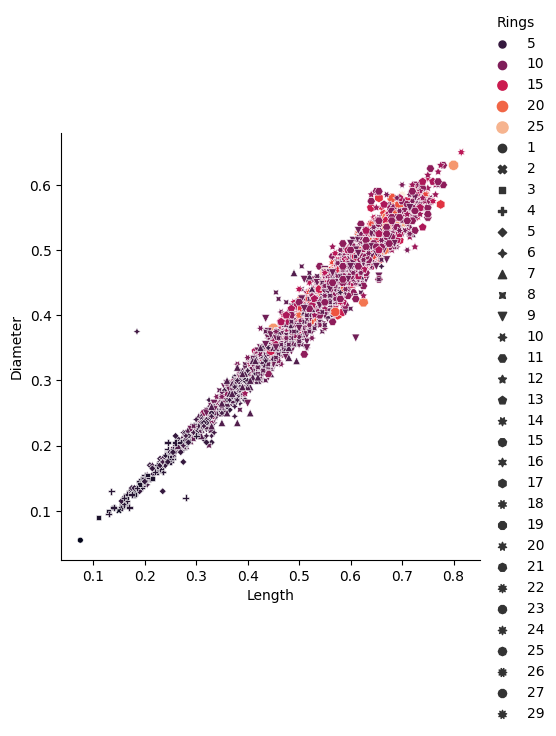

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=10
plt.rcParams['figure.figsize']=(15, 10)
plt.rcParams['figure.dpi'] = 100

sns.relplot(x ='Length', y ='Diameter', hue='Rings', data=data, style='Rings', size='Rings', palette='rocket')
plt.show()

Linear relationship between the numerical predictors and the response variable

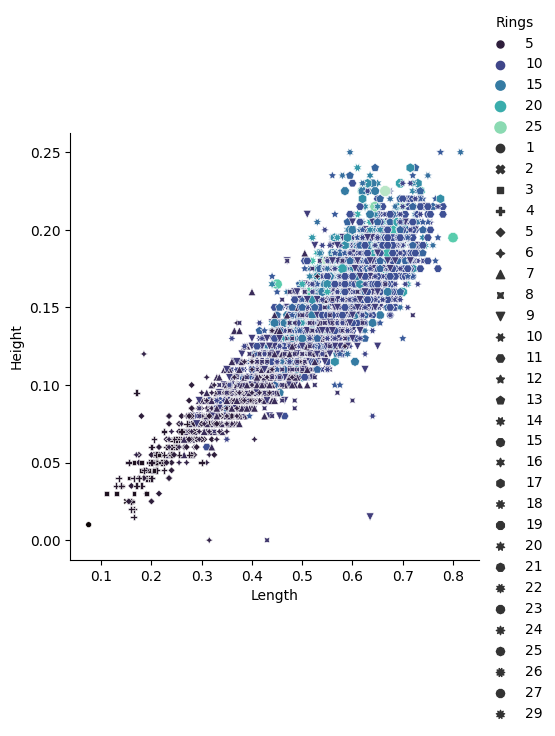

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=10
plt.rcParams['figure.figsize']=(15, 10)
plt.rcParams['figure.dpi'] = 100

sns.relplot(x ='Length', y ='Height', hue='Rings', data=data, style='Rings', size='Rings', palette='mako')
plt.show()

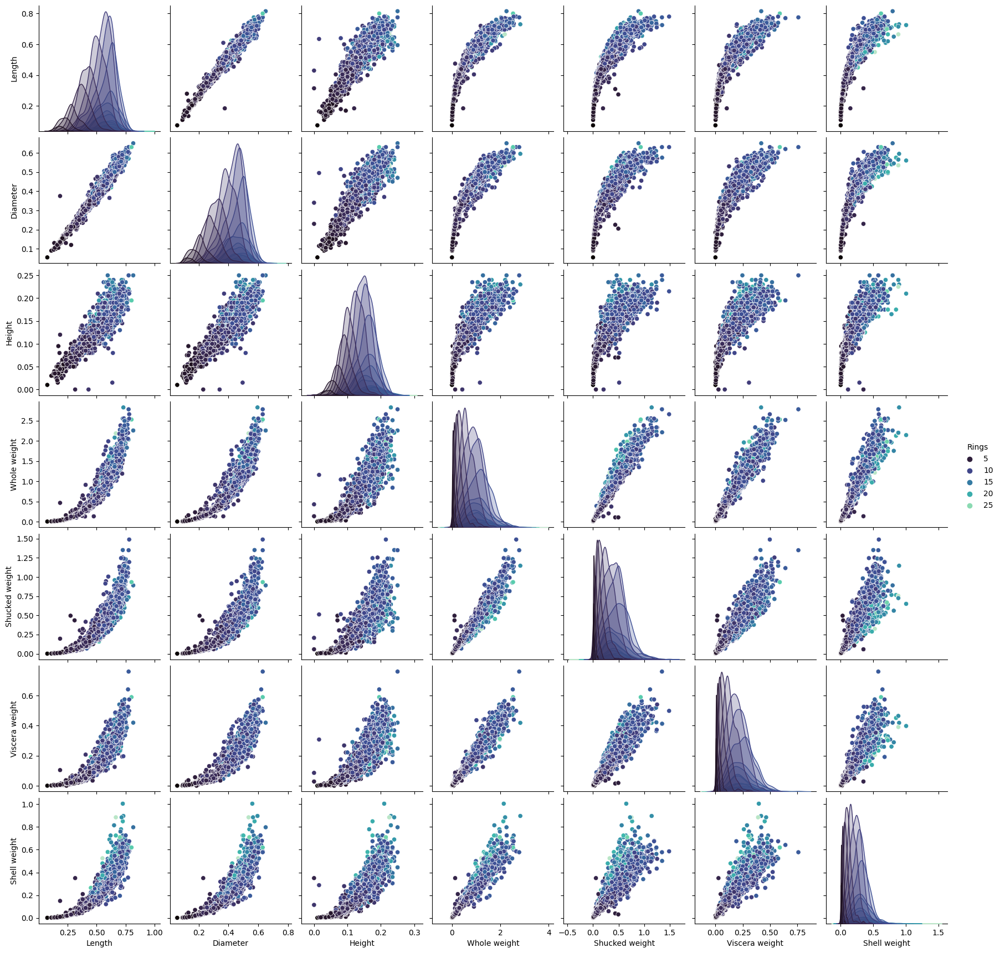

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=10
plt.rcParams['figure.figsize']=(5, 5)
plt.rcParams['figure.dpi'] = 100

g = sns.pairplot(data, hue='Rings', diag_kind='kde', markers='o', palette='mako')
plt.show()

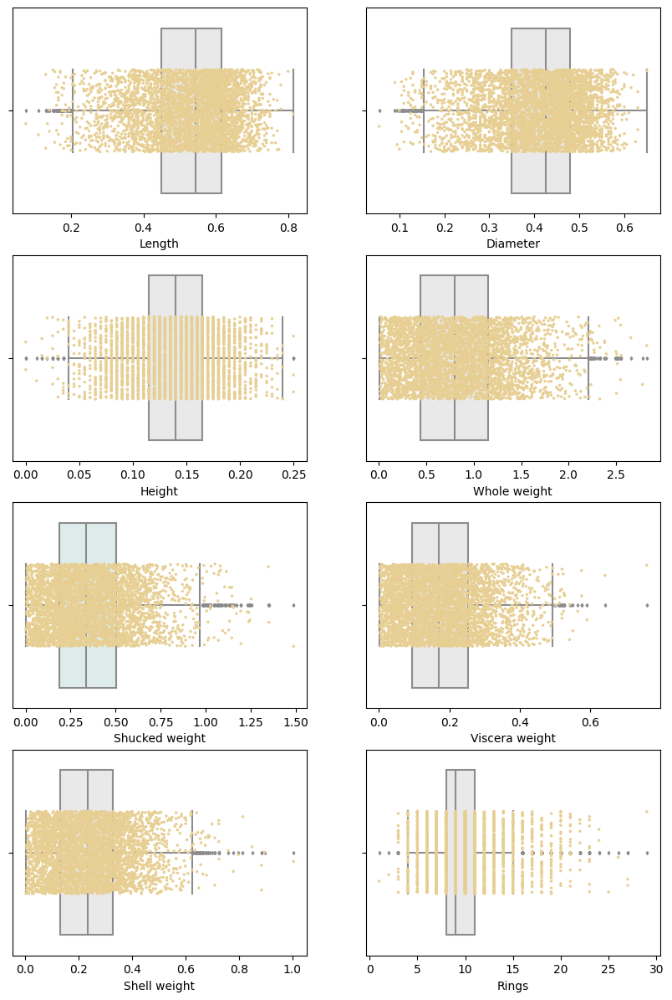

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=10

colors=sns.color_palette('BrBG', 8)
colors2=sns.color_palette('Greys_r', 5)

fig = plt.figure(figsize=(10, 15), dpi=100)

plt.subplot(4, 2, 1)
sns.boxplot(x ='Length', data=data, color=colors2[4], fliersize=2)
sns.stripplot(x ='Length', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

plt.subplot(4, 2, 2)
sns.boxplot(x ='Diameter', data=data, color=colors2[4], fliersize=2)
sns.stripplot(x ='Diameter', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

plt.subplot(4, 2, 3)
sns.boxplot(x ='Height', data=data, color=colors2[4], fliersize=2)
sns.stripplot(x ='Height', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

plt.subplot(4, 2, 4)
sns.boxplot(x ='Whole weight', data=data, color=colors2[4], fliersize=2)
sns.stripplot(x ='Whole weight', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

plt.subplot(4, 2, 5)
sns.boxplot(x ='Shucked weight', data=data, color=colors[4], fliersize=2)
sns.stripplot(x ='Shucked weight', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

plt.subplot(4, 2, 6)
sns.boxplot(x ='Viscera weight', data=data, color=colors2[4], fliersize=2)
sns.stripplot(x ='Viscera weight', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

plt.subplot(4, 2, 7)
sns.boxplot(x ='Shell weight', data=data, color=colors2[4], fliersize=2)
sns.stripplot(x ='Shell weight', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

plt.subplot(4, 2, 8)
sns.boxplot(x ='Rings', data=data, color=colors2[4], fliersize=2)
sns.stripplot(x ='Rings', data=data, color=colors[2], marker='o', jitter=0.2, size=2.5)

plt.show()



## Multivariate Plots

En esta sección se realiza el análisis de cómo se relacionan las características del conjunto de datos y cómo las variables independientes influyen en la variable respuesta. Entre los pasos del análisis multivariante fue la visualización de la matriz de correlación en un mapa de calor.

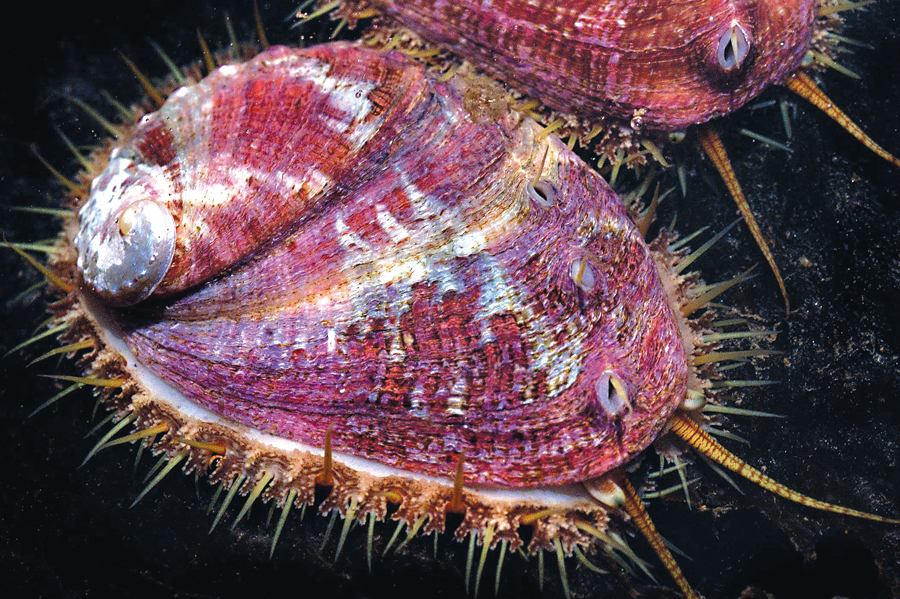

In [ ]:
from IPython.display import Image
Image(filename='/content/drive/MyDrive/Predictive Models/Final Project Regression Classification ABALONE/Images/WhiteAbalone.jpg', width=400, height=300)



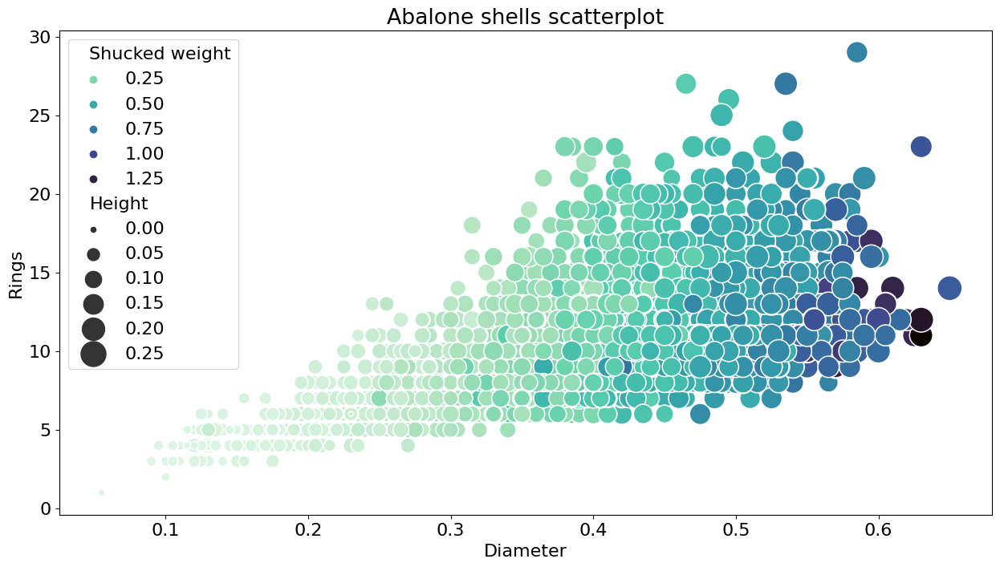

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=16

fig = plt.figure(figsize=(15, 8), dpi=100)

sns.scatterplot(x=data['Diameter'], y=data['Rings'], size=data['Height'], hue=data['Shucked weight'], palette='mako_r', sizes=(20, 500))
title = 'Abalone shells scatterplot'
plt.title(title)
plt.show()

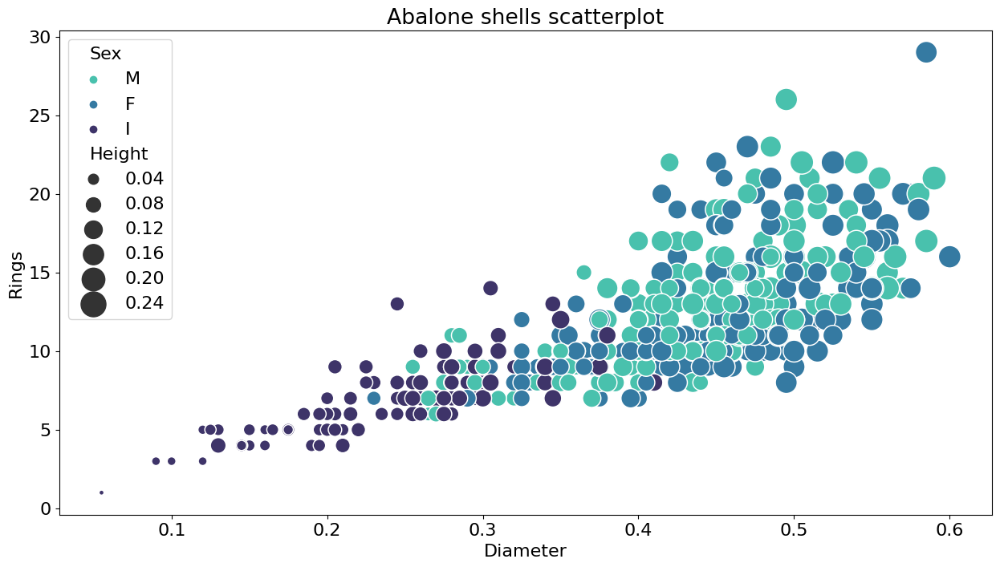

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=16

data_sub = data[:500]

fig = plt.figure(figsize=(15, 8), dpi=100)

sns.scatterplot(x=data_sub['Diameter'], y=data_sub['Rings'], size=data_sub['Height'], hue=data_sub['Sex'], palette='mako_r', sizes=(20, 500))
title = 'Abalone shells scatterplot'
plt.title(title)
plt.show()

### Infant vs Non-Infant

También tenemos una columna de "Sexo" que indica si el abulón es macho, hembra o cría. Esperaríamos que los bebés fueran significativamente diferentes de los adultos, por lo que dividiremos los datos en grupos de bebés y adultos, y veremos los histogramas de cada uno.

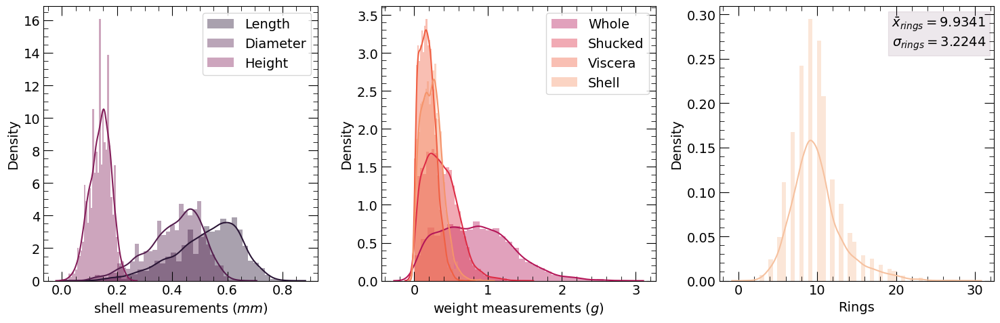

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=14
colors=sns.color_palette('rocket', 8)

fig = plt.figure(figsize=(15, 5), dpi=100)

ax = fig.add_subplot(1, 3, 1)
sns.distplot(data['Length'], label='Length', color=colors[0])
sns.distplot(data['Diameter'], label='Diameter', color=colors[1])
sns.distplot(data['Height'], label='Height', color=colors[2])
ax.legend()
plt.xlabel('shell measurements ($mm$)')
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)

ax = fig.add_subplot(1, 3, 2)
sns.distplot(data['Whole weight'], label='Whole', color=colors[3])
sns.distplot(data['Shucked weight'], label='Shucked', color=colors[4])
sns.distplot(data['Viscera weight'], label='Viscera', color=colors[5])
sns.distplot(data['Shell weight'], label='Shell', color=colors[6])
ax.legend()
plt.xlabel('weight measurements ($g$)')
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)

ax = fig.add_subplot(1, 3, 3)
sns.distplot(data['Rings'], color=colors[7])
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_rings = '\n'.join((r'$\bar{x}_{rings}=%.4f$' % (np.mean(data['Rings'])), r'$\sigma_{rings}=%.4f$' % (np.std(data['Rings']))))
txt = plt.text(0.80, 0.90, statistical_rings, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor=colors[1], edgecolor=colors[1], alpha=0.1))

fig.tight_layout()
plt.show()

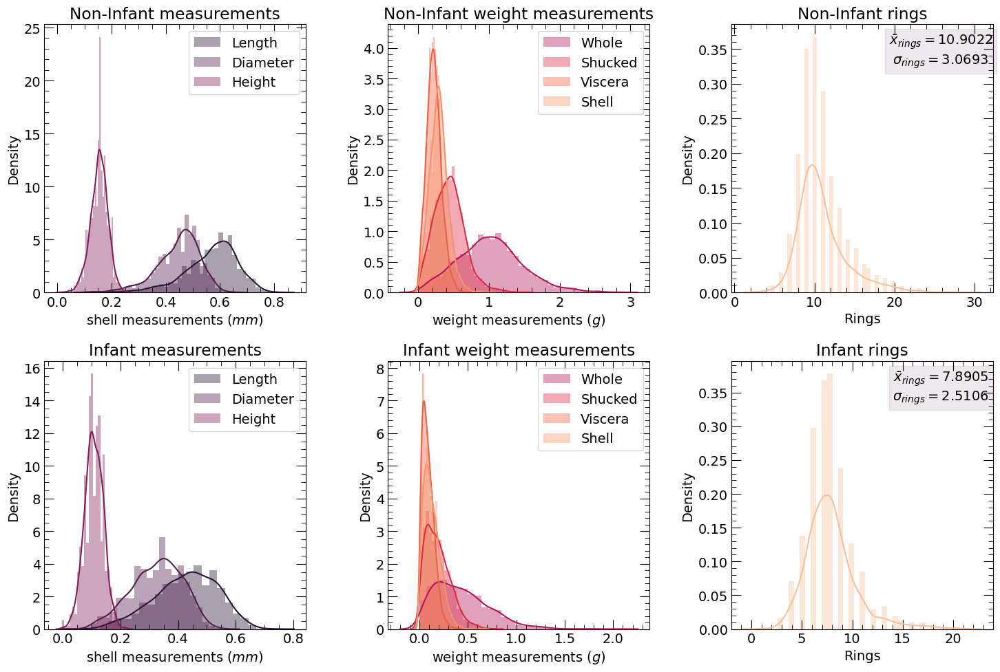

In [ ]:
inf_data = data[data['Sex']=='I']
ninf_data = data[data['Sex']!='I']

mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=14
colors=sns.color_palette('rocket', 8)

fig = plt.figure(figsize=(15, 10), dpi=100)

ax = fig.add_subplot(2, 3, 1)
sns.distplot(ninf_data['Length'], label='Length', color=colors[0])
sns.distplot(ninf_data['Diameter'], label='Diameter', color=colors[1])
sns.distplot(ninf_data['Height'], label='Height', color=colors[2])
ax.legend()
plt.xlabel('shell measurements ($mm$)')
plt.title('Non-Infant measurements')
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)

ax = fig.add_subplot(2, 3, 2)
sns.distplot(ninf_data['Whole weight'], label='Whole', color=colors[3])
sns.distplot(ninf_data['Shucked weight'], label='Shucked', color=colors[4])
sns.distplot(ninf_data['Viscera weight'], label='Viscera', color=colors[5])
sns.distplot(ninf_data['Shell weight'], label='Shell', color=colors[6])
ax.legend()
plt.xlabel('weight measurements ($g$)')
plt.title('Non-Infant weight measurements')
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)

ax = fig.add_subplot(2, 3, 3)
sns.distplot(ninf_data['Rings'], color=colors[7])
plt.title('Non-Infant rings')
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_rings = '\n'.join((r'$\bar{x}_{rings}=%.4f$' % (np.mean(ninf_data['Rings'])), r'$\sigma_{rings}=%.4f$' % (np.std(ninf_data['Rings']))))
txt = plt.text(0.80, 0.90, statistical_rings, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor=colors[1], edgecolor=colors[1], alpha=0.1))

ax = fig.add_subplot(2, 3, 4)
sns.distplot(inf_data['Length'], label='Length', color=colors[0])
sns.distplot(inf_data['Diameter'], label='Diameter', color=colors[1])
sns.distplot(inf_data['Height'], label='Height', color=colors[2])
ax.legend()
plt.xlabel('shell measurements ($mm$)')
plt.title('Infant measurements')
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)

ax = fig.add_subplot(2, 3, 5)
sns.distplot(inf_data['Whole weight'], label='Whole', color=colors[3])
sns.distplot(inf_data['Shucked weight'], label='Shucked', color=colors[4])
sns.distplot(inf_data['Viscera weight'], label='Viscera', color=colors[5])
sns.distplot(inf_data['Shell weight'], label='Shell', color=colors[6])
ax.legend()
plt.xlabel('weight measurements ($g$)')
plt.title('Infant weight measurements')
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)

ax = fig.add_subplot(2, 3, 6)
sns.distplot(inf_data['Rings'], color=colors[7])
plt.title('Infant rings')
plt.minorticks_on()
plt.tick_params(direction="in", right=True, top=True)
plt.tick_params(labelsize=14)
plt.tick_params(labelbottom=True, labeltop=False, labelright=False, labelleft=True)
plt.tick_params(direction="in", which="minor", length=5, bottom=True, top=True, left=True, right=True)
plt.tick_params(direction="in", which="major", length=10, bottom=True, top=True, left=True, right=True)
statistical_rings = '\n'.join((r'$\bar{x}_{rings}=%.4f$' % (np.mean(inf_data['Rings'])), r'$\sigma_{rings}=%.4f$' % (np.std(inf_data['Rings']))))
txt = plt.text(0.80, 0.90, statistical_rings, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
txt.set_bbox(dict(facecolor=colors[1], edgecolor=colors[1], alpha=0.1))

fig.tight_layout()
plt.show()

Análisis de estas distribuciones.

**Distribuciones de peso:**
<font color='green'>
- El peso total del espécimen tiene una gran variación en comparación con otros factores de peso, ya que integra múltiples pesos. Por lo tanto, es poco probable que el peso total se correlacione con fuerza como otras variables de peso.
- El peso de la concha y el peso de las vísceras parecen ser las dos cantidades que mejor reflejan el tamaño del organismo.</font>

**Distribución de las dimensiones (Longitud, Altura y Diámetro):**
<font color='green'>
- La Longitud y el diámetro están levemente sesgados negativamente. Una distribución sesgada indica un límite superior natural en la cantidad, que se esperaría para cantidades relacionadas con el tamaño.
- Las alturas de los infantes y los adultos tienen distribuciones muy similares.
- Los pesos y longitudes de los infantes tienen distribuciones más uniformes con medias más bajas y varianzas más altas que las distribuciones de peso y longitud de los adultos.</font>

**Infantes vs Adulto:**
<font color='green'>
- Los infantes tienen medidas con medias más pequeñas y mayor varianza que los adultos. Por lo tanto, un modelo que haga predicciones sobre el número de anillos en los caparazones de los infantes tendrá mayor incertidumbre por lo tanto necesitará ser más robusto.
- Un buen punto de partida para trabajos futuros es construir un modelo que no incluya infantes, reduciendo la variabilidad en la población.</font>

### **ANOVA** with one categorical feature

<font color='red'> La prueba ANOVA (análisis de varianza) es una técnica estadística que se utiliza para verificar si las medias de dos o más grupos son estadísticamente diferentes entre sí. En este proyecto se considera que para la variable categórica **Sexo** se tienen tres niveles (o grupos): *Infante, Masculino y Femenino*. El objetivo es determinar que los valores medios de cada grupo son estadísticamente diferentes de los demás y para ello necesitamos evaluar la variabilidad entre cada uno de los valores medios. </font>

<font color='red'> La prueba ANOVA analiza la varianza de diferentes grupos, calcula el F-value y el p-value. 

El p-value se usa para evaluar los resultados de la hipótesis. El p-value es un número entre $0$ y $1$. Si el p-value $< 0.05$ se rechaza la hipótesis nula y si el p-value $> 0.05$ se aceptar la hipótesis nula. F-value es la relación de la varianza inter grupos y la varianza intra de los grupos. Si el F-value está cerca de 1, significa que nuestra hipótesis nula es verdadera, es decir, las muestras tienen la misma media y si el F-value es mayor que 1, entonces las muestras tienen valores medios bastante diferentes. </font>

In [ ]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

Rings_lm_one_categorical=ols('Rings ~ C(Sex)', data=data).fit() #Specify C for Categorical 
sm.stats.anova_lm(Rings_lm_one_categorical, typ=2)

,sum_sq,df,F,PR(>F)
C(Sex),8387.664918,2.0,499.630442,2.992394e-195
Residual,35019.221309,4172.0,NaN,NaN


In [ ]:
Rings_lm_one_categorical.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Rings   R-squared:                       0.193
Model:                            OLS   Adj. R-squared:                  0.193
Method:                 Least Squares   F-statistic:                     499.6
Date:                Sat, 10 Dec 2022   Prob (F-statistic):          2.99e-195
Time:                        02:31:03   Log-Likelihood:                -10364.
No. Observations:                4175   AIC:                         2.073e+04
Df Residuals:                    4172   BIC:                         2.075e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      11.1317      0.080    138.852      0.000      10.975      11.289
C(Sex)[T.I]    -3.2412      0.113    -28.782      0.000      -3.462      -3.020
C(Sex)[T.M]    -0.4257      0.109     -3.899      0.000      -0.640      -0.212
==============================================================================
Omnibus:                     1083.378   Durbin-Watson:                   1.232
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2991.409
Skew:                           1.367   Prob(JB):                         0.00
Kurtosis:                       6.118   Cond. No.                         3.84
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### **MANOVA** with categorical and numerical features (all features)

ANOVA with several features.

In [ ]:
data.groupby('Sex').mean()

,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
Sex,,,,,,,,
F,0.579188,0.454809,0.157266,1.046879,0.446275,0.230776,0.302139,11.131700
I,0.427746,0.326494,0.107996,0.431363,0.191035,0.092010,0.128182,7.890462
M,0.561297,0.439204,0.151143,0.990661,0.432504,0.215367,0.281819,10.705959


In [ ]:
data.groupby('Sex').std()

,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
Sex,,,,,,,,
F,0.086124,0.070928,0.029588,0.430299,0.198714,0.097603,0.125610,3.104236
I,0.108858,0.088109,0.031995,0.286275,0.128405,0.062536,0.084927,2.511554
M,0.102665,0.084364,0.033548,0.469700,0.222403,0.104724,0.130744,3.027287


In [ ]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

Rings_lm=ols('Rings ~ C(Sex) + Length + Diameter + Height', data=data).fit() #Specify C for Categorical
sm.stats.anova_lm(Rings_lm, typ=2)

,sum_sq,df,F,PR(>F)
C(Sex),485.745242,2.0,38.388468,3.018264e-17
Length,250.513653,1.0,39.596210,3.444788e-10
Diameter,299.237958,1.0,47.297578,7.006344e-12
Height,1722.668693,1.0,272.285166,2.637823e-59
Residual,26376.044933,4169.0,NaN,NaN


In [ ]:
Rings_lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Rings   R-squared:                       0.392
Model:                            OLS   Adj. R-squared:                  0.392
Method:                 Least Squares   F-statistic:                     538.4
Date:                Sat, 10 Dec 2022   Prob (F-statistic):               0.00
Time:                        02:31:04   Log-Likelihood:                -9772.0
No. Observations:                4175   AIC:                         1.956e+04
Df Residuals:                    4169   BIC:                         1.959e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       4.2862      0.237     18.052      0.000       3.821       4.752
C(Sex)[T.I]    -0.9625      0.116     -8.265      0.000      -1.191      -0.734
C(Sex)[T.M]    -0.1367      0.095     -1.437      0.151      -0.323       0.050
Length        -12.6631      2.012     -6.293      0.000     -16.608      -8.718
Diameter       17.3544      2.523      6.877      0.000      12.407      22.302
Height         39.9762      2.423     16.501      0.000      35.227      44.726
==============================================================================
Omnibus:                     1297.492   Durbin-Watson:                   1.133
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4185.451
Skew:                           1.576   Prob(JB):                         0.00
Kurtosis:                       6.759   Cond. No.                         108.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### **Interpretación**

El resumen del ajuste del modelo contiene bastante información pero solo nos centraremos en un par de estadísticos importantes. El primero es el estadístico F. En este caso el F es de **489.5** (bastante alto)

El estadístico F es la relación de la varianza de las medias del grupo de muestra sobre la varianza dentro de los grupos de muestra. Es decir, Lo que realmente nos está diciendo es hasta qué punto la variación entre las medias del grupo domina sobre la variación dentro de los mismos grupos. Una estadística F alta significa que la varianza entre los grupos es mayor que la varianza dentro de los grupos (los grupos probablemente sean diferentes).

La variable categórica **Sexo** tiene tres niveles (o grupos): *Infante, Masculino y Femenino*.

In [ ]:
import statsmodels.stats.multicomp as multi

multi_comp = multi.MultiComparison(data['Rings'], data['Sex'])
multi_comp.tukeyhsd().summary()

group1,group2,meandiff,p-adj,lower,upper,reject
F,I,-3.2412,0.001,-3.5053,-2.9772,True
F,M,-0.4257,0.001,-0.6818,-0.1697,True
I,M,2.8155,0.001,2.5613,3.0697,True


In [ ]:
import statsmodels.stats.multicomp as multi

multi_comp = multi.MultiComparison(data['Length'], data['Sex'])
multi_comp.tukeyhsd().summary()

group1,group2,meandiff,p-adj,lower,upper,reject
F,I,-0.1514,0.001,-0.1605,-0.1423,True
F,M,-0.0179,0.001,-0.0267,-0.0091,True
I,M,0.1336,0.001,0.1248,0.1423,True


In [ ]:
import statsmodels.stats.multicomp as multi

multi_comp = multi.MultiComparison(data['Whole weight'], data['Sex'])
multi_comp.tukeyhsd().summary()

group1,group2,meandiff,p-adj,lower,upper,reject
F,I,-0.6155,0.001,-0.6525,-0.5785,True
F,M,-0.0562,0.001,-0.0921,-0.0203,True
I,M,0.5593,0.001,0.5237,0.5949,True


## Correlation Heat Map

<font color='red'> Discover patterns and relationships

The first step in establishing a multiple linear model is to study the relationship between variables. This information is critical in identifying problems that may be the best predictors for the model, and in detecting collinearity between predictors.

In [ ]:
def tidy_corr_matrix(correlation):

    correlation = correlation.stack().reset_index()
    correlation.columns = ['feature_1','feature_2','r']
    correlation = correlation.loc[correlation['feature_1'] != correlation['feature_2'], :]
    correlation['abs_r'] = np.abs(correlation['r'])
    correlation = correlation.sort_values('abs_r', ascending=False)
    
    return(correlation)

correlation_matrix = data.select_dtypes(include=['float64', 'int']).corr(method='pearson')
tidy_corr_matrix(correlation_matrix).head(50)

,feature_1,feature_2,r,abs_r
1,Length,Diameter,0.986804,0.986804
8,Diameter,Length,0.986804,0.986804
28,Whole weight,Shucked weight,0.969386,0.969386
35,Shucked weight,Whole weight,0.969386,0.969386
43,Viscera weight,Whole weight,0.966311,0.966311
29,Whole weight,Viscera weight,0.966311,0.966311
30,Whole weight,Shell weight,0.955385,0.955385
51,Shell weight,Whole weight,0.955385,0.955385
44,Viscera weight,Shucked weight,0.931868,0.931868
37,Shucked weight,Viscera weight,0.931868,0.931868


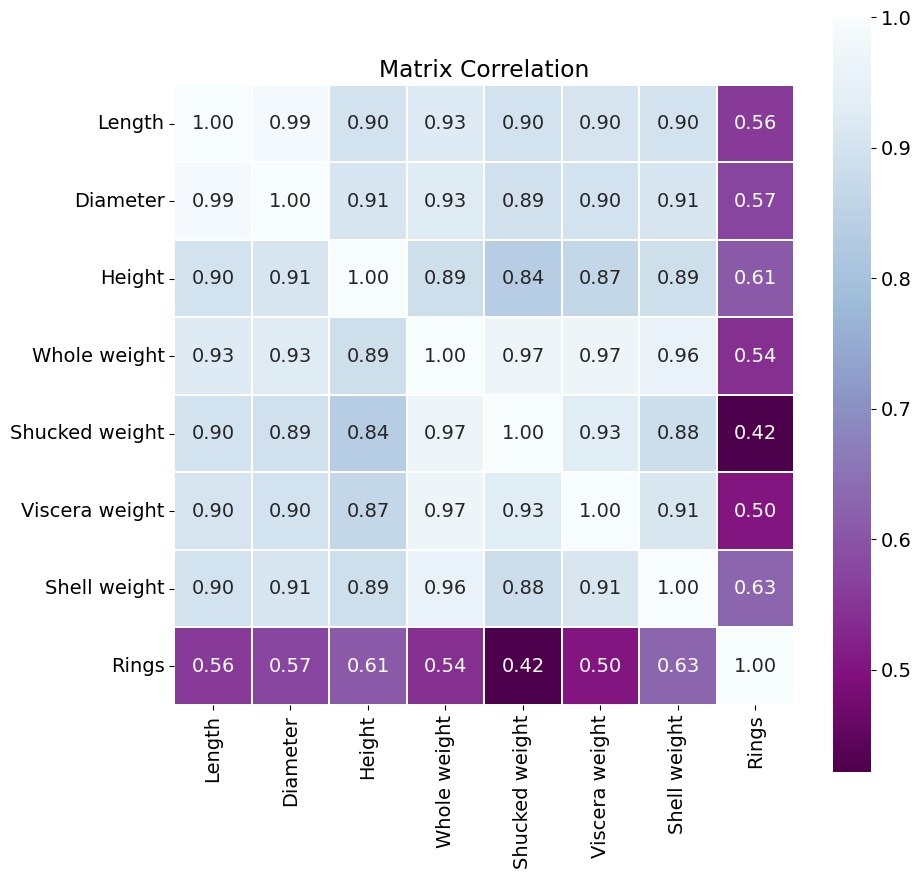

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=14
plt.rcParams['figure.figsize']=(10, 10)
plt.rcParams['figure.dpi'] = 100

correlation = data.corr(method='pearson')

plt.title('Matrix Correlation')
cm = sns.heatmap(correlation, cmap='BuPu_r', square=True, annot=True, fmt='.2f', linecolor='white', linewidth=0.5)

Al realizar el análisis de la matriz de correlación, se puede observar que la altura y el peso de la concha son los atributos que más se correlacionan con los anillos. Por lo tanto, el análisis multivariante se enfoca en la correlación de estos dos atributos con el atributo número de Anillos.

<Figure size 1000x500 with 0 Axes>

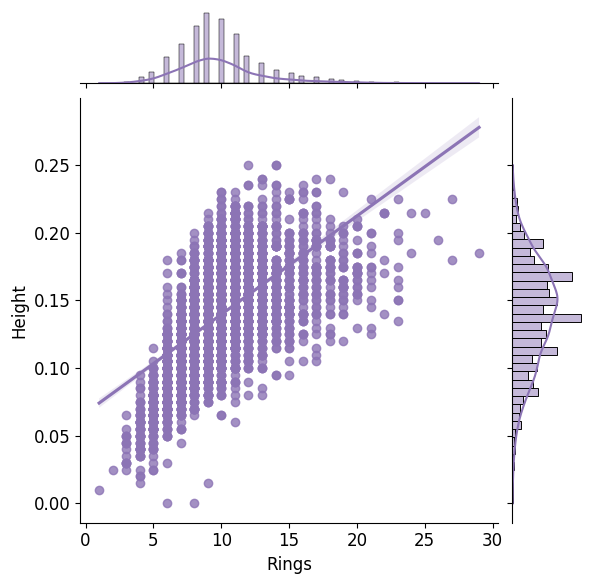

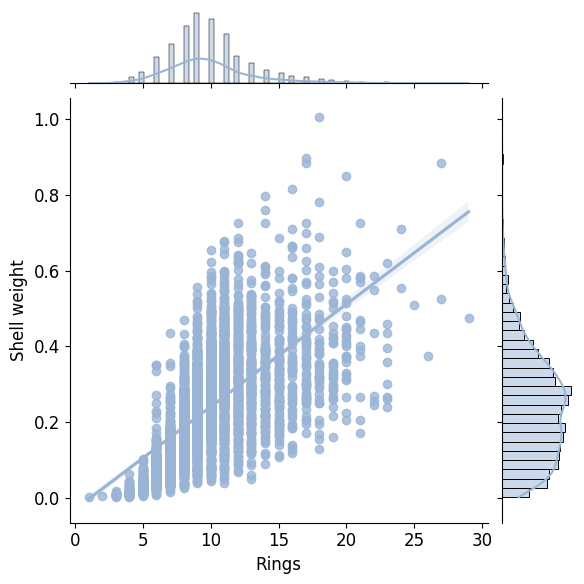

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('BuPu_r', 4)
colors2=sns.color_palette('rocket', 10)

# removing outliers 
data_1 = data[data['Height'] < 0.4]

fig = plt.figure(figsize=(10, 5))

ax = sns.jointplot(data=data_1, x='Rings', y='Height', kind='reg', color=colors[1])
#ax.plot_joint(sns.kdeplot, color=colors2[3], zorder=0, levels=10)
#ax.plot_marginals(sns.rugplot, color=colors2[3], height=-.15, clip_on=False)

ax = sns.jointplot(data=data_1, x='Rings', y='Shell weight', kind='reg', color=colors[2])
#ax.plot_joint(sns.kdeplot, color=colors2[4], zorder=0, levels=10)
#ax.plot_marginals(sns.rugplot, color=colors2[4], height=-.15, clip_on=False)

plt.show()

<font color='red'>Se puede observar que para valores más bajos de numero de Anillos, se tienen valores concentrados de Altura y Peso de caparazón. A medida que aumenta el valor de numero de Anillos, el diagrama de dispersión se retorna más grande y para los valores más altos de numero de Anillos se vuelve disperso.</font> 

## Identify Multicollinearity

### Variance Inflation Factor (VIF)

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

x_variables = data[['Length', 'Diameter', 'Height', 'Whole weight', 'Shucked weight','Viscera weight', 'Shell weight', 'Rings']]

vif_data = pd.DataFrame()
vif_data["feature"] = x_variables.columns
vif_data["VIF"] = [variance_inflation_factor(x_variables.values, i) 
for i in range(len(x_variables.columns))]

vif_data

,feature,VIF
0,Length,704.906951
1,Diameter,762.714763
2,Height,93.668209
3,Whole weight,435.348286
4,Shucked weight,117.315970
5,Viscera weight,64.712096
6,Shell weight,83.055049
7,Rings,22.019345


### Variable Combinations: Volume

<font color='red'>Observando como las diferentes variables se correlacionan entre sí, puede ser posible encontrar una combinación útil de variables.

Para este ejercicio se quiere correlacionar las dimensiones de medida (altura, longitud y diámetro) con el peso del organismo. Por conveniencia la altura, la longitud y el diámetro tienen unidades de longitud, el producto de las tres producirá una cantidad con unidades de longitud al cubo (volumen). Este volumen aproximado del abulón debe correlacionarse con el peso del organismo: el volumen ($x$) frente al peso ($y$) tendría una pendiente igual a la densidad.</font> 

En consecuencia, para un abulón el volumen es proporcional a la longitud por el diámetro por la altura.


$V∼L×D×H$


<font color='red'>En cuanto a las conchas del abulón, tienen la forma de un cuenco ovalado, y la altura indica la profundidad del cuenco. El área circular del caparazón se puede calcular a partir del área de una elipse, que es $πab$, donde $a$ y $b$ son los ejes mayor y menor. En el caso de un abulón, el eje mayor es proporcional a la longitud, mientras que el eje menor es proporcional al diámetro.</font> 


In [ ]:
data['Volume'] = data['Length'].values*data['Diameter'].values*data['Height'].values
data.head()

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings,Volume
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,15,0.015777
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7,0.008347
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9,0.030051
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10,0.020075
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7,0.006732


# Variables Selection 

### **Considerations**

<font color='red'>Con el análisis de variables se logró identificar algunas consideraciones necesarias para la selección de características y construcción de los modelos de Machine Learning:

- No hubo datos faltantes en el conjunto de datos.
- Las características dimensionales y de peso no se distribuyen de manera normal (en la regresión logística la solución puede ser más estable si los predictores tienen una distribución normal).
- Los datos de las características continuas (las dimensiones físicas de un espécimen de abulón, las características del peso de un espécimen de abulón) están moderadamente sesgadas, las características categóricas (Sexo: M, F, I) están equilibradas.
- Los datos contienen una cantidad significativa de valores atípicos (se debe usar estimadores robustos en el modelado).
- La multicolinealidad está presente tanto en las características dimensionales como de peso, por esta razón se deben de seleccionar los predictores (la multicolinealidad entre los predictores puede llevar a estimaciones sesgadas y a errores estándar inflados).
- Existen características con relaciones lineales (características dimensionales y de peso).</font>

### **Modeling**

<font color='red'>De acuerdo con el Análisis Exploratorio de los Datos (EDA), existe un grado significativo de multicolinealidad en el conjunto de datos. Por lo tanto, la selección de características es necesaria para descartar atributos altamente correlacionadas, irrelevantes y/o importantes para el desempeño de los modelos.

- La Longitud está casi perfectamente correlacionada con el Diámetro y solo se debe seleccionar una de las dos características (o se puede recurrir a la función de Volumen: $V∼L×D×H$).
- El Peso entero se puede seleccionar en combinación con el Peso de la concha, el Peso de las vísceras y el Peso sin la Concha (aunque el peso total es principalmente la suma de estas características, se evidencio que el peso total del espécimen tiene una gran variación en comparación con los otros factores de peso).
- La característica de Sexo no será incluida debido a los propósitos del estudio.</font>

Otros resultados de interés:

- Al observar la correlación entre los anillos (característica objetivo) y las variables independientes, se concluye que es posible construir un modelo para predecir el número de anillos en función de los atributos independientes (las dimensiones físicas de un espécimen de abulón, las características del peso de un espécimen de abulón).
- El peso de los abulones varía proporcionalmente a sus tamaños.
Si hay diferencias significativas (estadística) en dimensiones, características de peso y número de anillos entre abulones machos y abulones hembras (aunque parezca lo contrario).
- El grupo de abulones infantes presentan valores medios más bajos de en dimensiones, características de peso y número de anillos.
- El peso y la altura de los abulones varían según la edad.




In [ ]:
data.columns

Index(['Sex', 'Length', 'Diameter', 'Height', 'Whole weight', 'Shucked weight',
       'Viscera weight', 'Shell weight', 'Rings', 'Volume'],
      dtype='object')

Drop categorical column(Sex).

In [ ]:
data.drop('Sex', axis = 1, inplace = True)
data.head()

,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings,Volume
0,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,15,0.015777
1,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7,0.008347
2,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9,0.030051
3,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10,0.020075
4,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7,0.006732


In [ ]:
def abalone_removeoutliers(data, verbose=False):
  len1 = len(data)
  data = data[data['Height'] < 0.30]
  data = data[data['Height'] > 0.001]
  data = data[data['Length'] > 0.001]
  data = data[data['Diameter'] > 0.001]
  len2 = len(data)
  if(verbose):
    outliers = len1-len2
    print('Removed:', outliers)
  return data

In [ ]:
data = abalone_removeoutliers(data, True)

Removed: 4


<font color='red'>Se eliminaron cuatro ($4$) especímenes de abulón que tenían medidas extremas y atípicas no representativas en el conjunto de datos.</font>

In [ ]:
data.shape

(4173, 9)

In [ ]:
data['Rings'].mean()

9.935537982266954

In [ ]:
data_1 = data.copy()

<font color='red'>La columna de género se codifico en binario para separar las columnas que representan el abulón macho, hembra (No infantes) y los abulones infantes (Infantes). Los modelos se entrenaron utilizando una validación cruzada de 5-fold. En este proyecto se utilizaron diferentes modelos de clasificación de Machine Learning.</font>

In [ ]:
# Codificar variable respuesta 'Rings_transform' 1 si es Non-Infant 0 si es Infant
Rings_transform = []
for i in data_1['Rings']:
    if i > 9:
        Rings_transform.append('1')
    else:
        Rings_transform.append('0')

data_1['Rings_transform'] = Rings_transform
data_1.drop('Rings', axis=1, inplace=True)
data_1.head()

,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Volume,Rings_transform
0,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,0.015777,1
1,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,0.008347,0
2,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,0.030051,0
3,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,0.020075,1
4,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,0.006732,0


In [ ]:
# Verificar la proporción de los datos (balance)
print("Número de observaciones por clase")
print(data_1['Rings_transform'].value_counts())
print("")

print("Porcentaje de observaciones por clase")
print(100 * data_1['Rings_transform'].value_counts(normalize=True))

Número de observaciones por clase
0    2093
1    2080
Name: Rings_transform, dtype: int64

Porcentaje de observaciones por clase
0    50.155763
1    49.844237
Name: Rings_transform, dtype: float64


Data transformation

In [ ]:
X = data_1[['Length', 'Height', 'Shucked weight','Viscera weight', 'Shell weight',]]
y = data_1['Rings_transform']

In [ ]:
X.shape, y.shape

((4173, 5), (4173,))

# Logistic Regression

Se aplica la regresión logística debido a que se cumplen algunos de los siguientes supuestos:
- La variable de respuesta es binaria - donde el número de resultados es dos (**Rings_transform:** $1$ si es Non-Infant $0$ si es Infant)
- Las observaciones son independientes (las observaciones no deben provenir de mediciones repetidas del mismo individuo ni estar relacionadas entre sí de ninguna manera)(difícil de demostrar).
- No hay multicolinealidad entre las variables explicativas (Se hacen transformaciones para que no exista la multicolinealidad).
- No hay valores atípicos extremos (se realiza un procesado de los valores atípicos extremos u observaciones influyentes en el conjunto de datos).
- Existe una relación lineal entre las variables explicativas y el logit de la variable de respuesta (no se comprobó - usar una prueba de Box-Tidwell).
- El tamaño de la muestra es suficientemente grande (se cumple de acuerdo con el número de variables explicativas)

La regresión logística no requiere:
- Los residuos del modelo que se distribuirán normalmente.
- Los residuos tienen varianza constante, también conocida como homocedasticidad.

Nota: La regresión logística no se basa en supuestos distribucionales, sin embargo, la solución puede ser más estable si los predictores tienen una distribución normal multivariante (para este caso las distribuciones de los predictores no son normales).

In [ ]:
# Count unique number of outcomes in dependent variable ('Rings_transform')
print(data_1['Rings_transform'].nunique())

2


In [ ]:
from sklearn.model_selection import train_test_split
# División de los datos en train y test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 123)

In [ ]:
X_train.shape, y_train.shape

((2921, 5), (2921,))

In [ ]:
X_test.shape, y_test.shape

((1252, 5), (1252,))

Preprocessing

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# Model
Logistic_Regression = LogisticRegression().fit(X_train, y_train)
y_pred_Logistic_Regression = Logistic_Regression.predict(X_test)

# Score
print('Classification Report:\n', classification_report(y_test, y_pred_Logistic_Regression))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_Logistic_Regression))
Logistic_Regression_train_acc = Logistic_Regression.score(X_train, y_train)
print('Training Score:', Logistic_Regression_train_acc)
Logistic_Regression_test_acc = Logistic_Regression.score(X_test, y_test)
print('Testing Score:', Logistic_Regression_test_acc)

Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.79      0.78       644
           1       0.77      0.75      0.76       608

    accuracy                           0.77      1252
   macro avg       0.77      0.77      0.77      1252
weighted avg       0.77      0.77      0.77      1252

Confusion Matrix:
 [[507 137]
 [150 458]]
Training Score: 0.7928791509756933
Testing Score: 0.7707667731629393


<font color='red'>La puntuación de precisión del conjunto de entrenamiento es $0.7928$, mientras que la precisión del conjunto de prueba es $0.7707$. Estos dos valores son bastante comparables. Por lo tanto, no hay signos de sobreajuste.</font> 

In [ ]:
# Performance
from sklearn.metrics import confusion_matrix

cm_Logistic_Regression = confusion_matrix(y_test, y_pred_Logistic_Regression)

print('Confusion matrix\n\n', cm_Logistic_Regression)
print('\nTrue Positives(TP) =', cm_Logistic_Regression[0,0])
print('\nTrue Negatives(TN) =', cm_Logistic_Regression[1,1])
print('\nFalse Positives(FP) =', cm_Logistic_Regression[0,1])
print('\nFalse Negatives(FN) =', cm_Logistic_Regression[1,0])

Confusion matrix

 [[507 137]
 [150 458]]

True Positives(TP) = 507

True Negatives(TN) = 458

False Positives(FP) = 137

False Negatives(FN) = 150


In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

Logistic_Regression_Accuracy_score = accuracy_score(y_test, y_pred_Logistic_Regression)
print('Accuracy Score: {:.4f}'.format(Logistic_Regression_Accuracy_score))

Logistic_Regression_F1_score = f1_score(y_test, y_pred_Logistic_Regression, average="binary", pos_label='0')
print('F1 Score: {:.4f}'.format(Logistic_Regression_F1_score))

Logistic_Regression_Log_loss = log_loss(y_test, y_pred_Logistic_Regression)
print('Log Loss: {:.4f}'.format(Logistic_Regression_Log_loss))

Logistic_Regression_Precision_score = precision_score(y_test, y_pred_Logistic_Regression, pos_label='0')
print('Precision Score: {:.4f}'.format(Logistic_Regression_Precision_score))

Logistic_Regression_Recall_score = recall_score(y_test, y_pred_Logistic_Regression, pos_label='0')
print('Recall Score: {:.4f}'.format(Logistic_Regression_Recall_score))

Logistic_Regression_Roc_auc_score = roc_auc_score(y_test, y_pred_Logistic_Regression)
print('ROC-AUC Score: {:.4f}'.format(Logistic_Regression_Roc_auc_score))

Accuracy Score: 0.7708
F1 Score: 0.7794
Log Loss: 7.9175
Precision Score: 0.7717
Recall Score: 0.7873
ROC-AUC Score: 0.7703


# Vector Suport Machine (VSM)

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 123)

Preprocessing

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

# Model
Support_Vector_Machines = SVC(C = 100, kernel = 'linear', random_state=123).fit(X_train, y_train)
y_pred_Support_Vector_Machines = Support_Vector_Machines.predict(X_test)

# Score
print('Classification Report:\n', classification_report(y_test, y_pred_Support_Vector_Machines))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_Support_Vector_Machines))
Support_Vector_Machines_train_acc = Support_Vector_Machines.score(X_train, y_train)
print('Training Score:', Support_Vector_Machines_train_acc)
Support_Vector_Machines_test_acc = Support_Vector_Machines.score(X_test, y_test)
print('Testing Score:', Support_Vector_Machines_test_acc)

Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.82      0.80       644
           1       0.79      0.76      0.78       608

    accuracy                           0.79      1252
   macro avg       0.79      0.79      0.79      1252
weighted avg       0.79      0.79      0.79      1252

Confusion Matrix:
 [[525 119]
 [147 461]]
Training Score: 0.7891133173570695
Testing Score: 0.7875399361022364


<font color='red'>La puntuación de precisión del conjunto de entrenamiento es $0.7891$, mientras que la precisión del conjunto de prueba es $0.7875$. Estos dos valores son bastante comparables. Por lo tanto, no hay signos de sobreajuste.</font> 

In [ ]:
# Performance
from sklearn.metrics import confusion_matrix
labels = [0, 1]
cm_Support_Vector_Machines = confusion_matrix(y_test, y_pred_Support_Vector_Machines)

print('Confusion matrix\n\n', cm_Support_Vector_Machines)
print('\nTrue Positives(TP) =', cm_Support_Vector_Machines[0,0])
print('\nTrue Negatives(TN) =', cm_Support_Vector_Machines[1,1])
print('\nFalse Positives(FP) =', cm_Support_Vector_Machines[0,1])
print('\nFalse Negatives(FN) =', cm_Support_Vector_Machines[1,0])

Confusion matrix

 [[525 119]
 [147 461]]

True Positives(TP) = 525

True Negatives(TN) = 461

False Positives(FP) = 119

False Negatives(FN) = 147


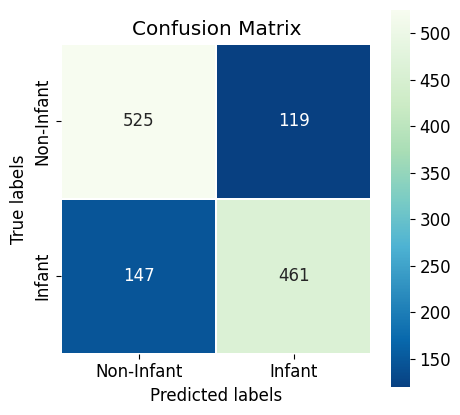

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig = plt.figure(figsize=(5, 5))

ax = plt.subplot()
sns.heatmap(cm_Support_Vector_Machines, cmap='GnBu_r', annot=True, fmt='g', ax=ax, square=True, linecolor='white', linewidth=0.5)  # Annot=True to annotate cells, fmt='g' to disable scientific notation

ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Non-Infant', 'Infant'])
ax.yaxis.set_ticklabels(['Non-Infant', 'Infant'])
plt.show()

The confusion matrix shows 525 + 461 = 986 correct predictions and 119 + 147 = 266 incorrect predictions.

* True Positives (Actual Positive:1 and Predict Positive:1) - 525
* True Negatives (Actual Negative:0 and Predict Negative:0) - 461
* False Positives (Actual Negative:0 but Predict Positive:1) - 119 (Type I error)
* False Negatives (Actual Positive:1 but Predict Negative:0) - 147 (Type II error)

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

Support_Vector_Machines_Accuracy_score = accuracy_score(y_test, y_pred_Support_Vector_Machines)
print('Accuracy Score: {:.4f}'.format(Support_Vector_Machines_Accuracy_score))

Support_Vector_Machines_F1_score = f1_score(y_test, y_pred_Support_Vector_Machines, average="binary", pos_label='0')
print('F1 Score: {:.4f}'.format(Support_Vector_Machines_F1_score))

Support_Vector_Machines_Log_loss = log_loss(y_test, y_pred_Support_Vector_Machines)
print('Log Loss: {:.4f}'.format(Support_Vector_Machines_Log_loss))

Support_Vector_Machines_Precision_score = precision_score(y_test, y_pred_Support_Vector_Machines, pos_label='0')
print('Precision Score: {:.4f}'.format(Support_Vector_Machines_Precision_score))

Support_Vector_Machines_Recall_score = recall_score(y_test, y_pred_Support_Vector_Machines, pos_label='0')
print('Recall Score: {:.4f}'.format(Support_Vector_Machines_Recall_score))

Support_Vector_Machines_Roc_auc_score = roc_auc_score(y_test, y_pred_Support_Vector_Machines)
print('ROC-AUC Score: {:.4f}'.format(Support_Vector_Machines_Roc_auc_score))

Accuracy Score: 0.7875
F1 Score: 0.7979
Log Loss: 7.3382
Precision Score: 0.7812
Recall Score: 0.8152
ROC-AUC Score: 0.7867


In [ ]:
from sklearn.model_selection import GridSearchCV

# Tuning Hiper-Parámetros 

# Creando grill

param_grid = {'C': np.logspace(-5, 5, 50)}

grid_search = GridSearchCV(estimator = SVC(kernel= "rbf", gamma='scale'), param_grid = param_grid,
        scoring = 'accuracy', n_jobs = -1, cv = 5, verbose = 0, return_train_score = True)

In [ ]:
# Total de instancias a ser probadas
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=SVC(), n_jobs=-1,
             param_grid={'C': array([1.00000000e-05, 1.59985872e-05, 2.55954792e-05, 4.09491506e-05,
       6.55128557e-05, 1.04811313e-04, 1.67683294e-04, 2.68269580e-04,
       4.29193426e-04, 6.86648845e-04, 1.09854114e-03, 1.75751062e-03,
       2.81176870e-03, 4.49843267e-03, 7.19685673e-03, 1.15139540e-02,
       1.84206997e-02, 2.94705170e-02, 4.71486636e-0...
       5.17947468e+00, 8.28642773e+00, 1.32571137e+01, 2.12095089e+01,
       3.39322177e+01, 5.42867544e+01, 8.68511374e+01, 1.38949549e+02,
       2.22299648e+02, 3.55648031e+02, 5.68986603e+02, 9.10298178e+02,
       1.45634848e+03, 2.32995181e+03, 3.72759372e+03, 5.96362332e+03,
       9.54095476e+03, 1.52641797e+04, 2.44205309e+04, 3.90693994e+04,
       6.25055193e+04, 1.00000000e+05])},
             return_train_score=True, scoring='accuracy')

In [ ]:
# Sacar el puntaje y top 5
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
33,0.474742,0.008116,0.070720,0.000547,54.286754,{'C': 54.286754393238596},0.791453,0.799658,0.792808,0.823630,...,0.800071,0.012124,1,0.807791,0.807873,0.812152,0.802739,0.811724,0.808456,0.003400
30,0.336209,0.009872,0.071611,0.002122,13.257114,{'C': 13.257113655901108},0.782906,0.808219,0.794521,0.821918,...,0.799389,0.014007,2,0.807363,0.805306,0.809157,0.801027,0.808301,0.806231,0.002901
34,0.589118,0.011500,0.072657,0.005292,86.851137,{'C': 86.85113737513521},0.791453,0.794521,0.792808,0.825342,...,0.799386,0.013014,3,0.809932,0.810013,0.815576,0.806162,0.813436,0.811024,0.003237
38,2.344175,0.685018,0.108360,0.037773,568.986603,{'C': 568.9866029018305},0.789744,0.803082,0.789384,0.823630,...,0.799045,0.013371,4,0.820634,0.817287,0.820710,0.813008,0.819855,0.818299,0.002922
32,0.407103,0.006372,0.071173,0.001685,33.932218,{'C': 33.9322177189533},0.788034,0.799658,0.796233,0.821918,...,0.798703,0.012502,5,0.807791,0.808729,0.811297,0.801883,0.809585,0.807857,0.003202


In [ ]:
# Definir los parametros para el mejor modelo
Support_Vector_Machines_best = grid_search.best_estimator_

In [ ]:
y_pred_Support_Vector_Machines_best_test = Support_Vector_Machines_best.predict(X_test)
y_pred_Support_Vector_Machines_best_train = Support_Vector_Machines_best.predict(X_train)

# Score test
print('Test Classification Report:\n', classification_report(y_test, y_pred_Support_Vector_Machines_best_test))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_Support_Vector_Machines_best_test))
Support_Vector_Machines_best_test_acc = Support_Vector_Machines_best.score(X_test, y_test)
print('Testing Accuracy:', Support_Vector_Machines_best_test_acc)

# Score train
print('Train Classification Report:\n', classification_report(y_train, y_pred_Support_Vector_Machines_best_train))
print('Confusion Matrix:\n', confusion_matrix(y_train, y_pred_Support_Vector_Machines_best_train))
Support_Vector_Machines_best_train_acc = Support_Vector_Machines_best.score(X_train, y_train)
print('Training Accuracy:', Support_Vector_Machines_best_train_acc)

Test Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.77      0.78       644
           1       0.77      0.80      0.78       608

    accuracy                           0.78      1252
   macro avg       0.78      0.78      0.78      1252
weighted avg       0.78      0.78      0.78      1252

Confusion Matrix:
 [[496 148]
 [124 484]]
Testing Accuracy: 0.7827476038338658
Train Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.79      0.80      1449
           1       0.80      0.82      0.81      1472

    accuracy                           0.81      2921
   macro avg       0.81      0.81      0.81      2921
weighted avg       0.81      0.81      0.81      2921

Confusion Matrix:
 [[1143  306]
 [ 259 1213]]
Training Accuracy: 0.8065730914070524


<font color='red'>La puntuación de precisión del conjunto de entrenamiento es $0.8065$, mientras que la precisión del conjunto de prueba es $0.7827$. Estos dos valores son bastante comparables. Por lo tanto, no hay signos de sobreajuste.</font> 

In [ ]:
# Performance
from sklearn.metrics import confusion_matrix

cm_Support_Vector_Machines_best = confusion_matrix(y_test, y_pred_Support_Vector_Machines_best_test)

print('Confusion matrix\n\n', cm_Support_Vector_Machines_best)
print('\nTrue Positives(TP) =', cm_Support_Vector_Machines_best[0,0])
print('\nTrue Negatives(TN) =', cm_Support_Vector_Machines_best[1,1])
print('\nFalse Positives(FP) =', cm_Support_Vector_Machines_best[0,1])
print('\nFalse Negatives(FN) =', cm_Support_Vector_Machines_best[1,0])

Confusion matrix

 [[496 148]
 [124 484]]

True Positives(TP) = 496

True Negatives(TN) = 484

False Positives(FP) = 148

False Negatives(FN) = 124


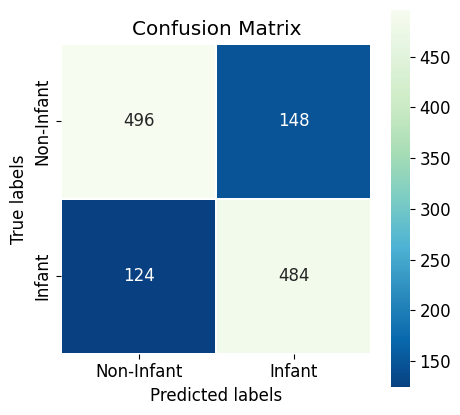

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig = plt.figure(figsize=(5, 5))

ax = plt.subplot()
sns.heatmap(cm_Support_Vector_Machines_best, cmap='GnBu_r', annot=True, fmt='g', ax=ax, square=True, linecolor='white', linewidth=0.5)  # Annot=True to annotate cells, fmt='g' to disable scientific notation

ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Non-Infant', 'Infant'])
ax.yaxis.set_ticklabels(['Non-Infant', 'Infant'])
plt.show()

The confusion matrix shows 496 + 484 = 980 correct predictions and 148 + 124 = 272 incorrect predictions.

* True Positives (Actual Positive:1 and Predict Positive:1) - 496
* True Negatives (Actual Negative:0 and Predict Negative:0) - 484
* False Positives (Actual Negative:0 but Predict Positive:1) - 148 (Type I error)
* False Negatives (Actual Positive:1 but Predict Negative:0) - 124 (Type II error)

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

Support_Vector_Machines_best_Accuracy_score = accuracy_score(y_test, y_pred_Support_Vector_Machines_best_test)
print('Accuracy Score: {:.4f}'.format(Support_Vector_Machines_best_Accuracy_score))

Support_Vector_Machines_best_F1_score = f1_score(y_test, y_pred_Support_Vector_Machines_best_test, average="binary", pos_label='0')
print('F1 Score: {:.4f}'.format(Support_Vector_Machines_best_F1_score))

Support_Vector_Machines_best_Log_loss = log_loss(y_test, y_pred_Support_Vector_Machines_best_test)
print('Log Loss: {:.4f}'.format(Support_Vector_Machines_best_Log_loss))

Support_Vector_Machines_best_Precision_score = precision_score(y_test, y_pred_Support_Vector_Machines_best_test, pos_label='0')
print('Precision Score: {:.4f}'.format(Support_Vector_Machines_best_Precision_score))

Support_Vector_Machines_best_Recall_score = recall_score(y_test, y_pred_Support_Vector_Machines_best_test, pos_label='0')
print('Recall Score: {:.4f}'.format(Support_Vector_Machines_best_Recall_score))

Support_Vector_Machines_best_Roc_auc_score = roc_auc_score(y_test, y_pred_Support_Vector_Machines_best_test)
print('ROC-AUC Score: {:.4f}'.format(Support_Vector_Machines_best_Roc_auc_score))

Accuracy Score: 0.7827
F1 Score: 0.7848
Log Loss: 7.5037
Precision Score: 0.8000
Recall Score: 0.7702
ROC-AUC Score: 0.7831


# k-Nearest Neighbors (kNN)

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 123)

Preprocessing

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Model
kNN = KNeighborsClassifier(n_neighbors=5).fit(X_train, y_train)
y_pred_kNN = kNN.predict(X_test)

# Score
print('Classification Report:\n', classification_report(y_test, y_pred_kNN))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_kNN))
kNN_train_acc = kNN.score(X_train, y_train)
print('Training Score:', kNN_train_acc)
kNN_test_acc = kNN.score(X_test, y_test)
print('Testing Score:', kNN_test_acc)

Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.76      0.77       644
           1       0.75      0.76      0.76       608

    accuracy                           0.76      1252
   macro avg       0.76      0.76      0.76      1252
weighted avg       0.76      0.76      0.76      1252

Confusion Matrix:
 [[488 156]
 [143 465]]
Training Score: 0.843889079082506
Testing Score: 0.7611821086261981


<font color='red'>La puntuación de precisión del conjunto de entrenamiento es $0.8438$, mientras que la precisión del conjunto de prueba es $0.7611$. Estos dos valores son bastante comparables. Por lo tanto, no hay signos de sobreajuste.</font> 

In [ ]:
# Performance
from sklearn.metrics import confusion_matrix

cm_kNN = confusion_matrix(y_test, y_pred_kNN)

print('Confusion matrix\n\n', cm_kNN)
print('\nTrue Positives(TP) =', cm_kNN[0,0])
print('\nTrue Negatives(TN) =', cm_kNN[1,1])
print('\nFalse Positives(FP) =', cm_kNN[0,1])
print('\nFalse Negatives(FN) =', cm_kNN[1,0])

Confusion matrix

 [[488 156]
 [143 465]]

True Positives(TP) = 488

True Negatives(TN) = 465

False Positives(FP) = 156

False Negatives(FN) = 143


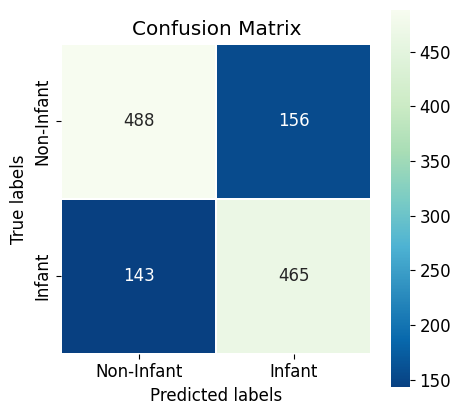

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig = plt.figure(figsize=(5, 5))

ax = plt.subplot()
sns.heatmap(cm_kNN, cmap='GnBu_r', annot=True, fmt='g', ax=ax, square=True, linecolor='white', linewidth=0.5)  # Annot=True to annotate cells, fmt='g' to disable scientific notation

ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Non-Infant', 'Infant'])
ax.yaxis.set_ticklabels(['Non-Infant', 'Infant'])
plt.show()

The confusion matrix shows 488 + 465 = 953 correct predictions and 156 + 143 = 299 incorrect predictions.

* True Positives (Actual Positive:1 and Predict Positive:1) - 492
* True Negatives (Actual Negative:0 and Predict Negative:0) - 470
* False Positives (Actual Negative:0 but Predict Positive:1) - 156 (Type I error)
* False Negatives (Actual Positive:1 but Predict Negative:0) - 143 (Type II error)

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

kNN_Accuracy_score = accuracy_score(y_test, y_pred_kNN)
print('Accuracy Score: {:.4f}'.format(kNN_Accuracy_score))

kNN_F1_score = f1_score(y_test, y_pred_kNN, average="binary", pos_label='0')
print('F1 Score: {:.4f}'.format(kNN_F1_score))

kNN_Log_loss = log_loss(y_test, y_pred_kNN)
print('Log Loss: {:.4f}'.format(kNN_Log_loss))

kNN_Precision_score = precision_score(y_test, y_pred_kNN, pos_label='0')
print('Precision Score: {:.4f}'.format(kNN_Precision_score))

kNN_Recall_score = recall_score(y_test, y_pred_kNN, pos_label='0')
print('Recall Score: {:.4f}'.format(kNN_Recall_score))

kNN_Roc_auc_score = roc_auc_score(y_test, y_pred_kNN)
print('ROC-AUC Score: {:.4f}'.format(kNN_Roc_auc_score))

Accuracy Score: 0.7612
F1 Score: 0.7655
Log Loss: 8.2486
Precision Score: 0.7734
Recall Score: 0.7578
ROC-AUC Score: 0.7613


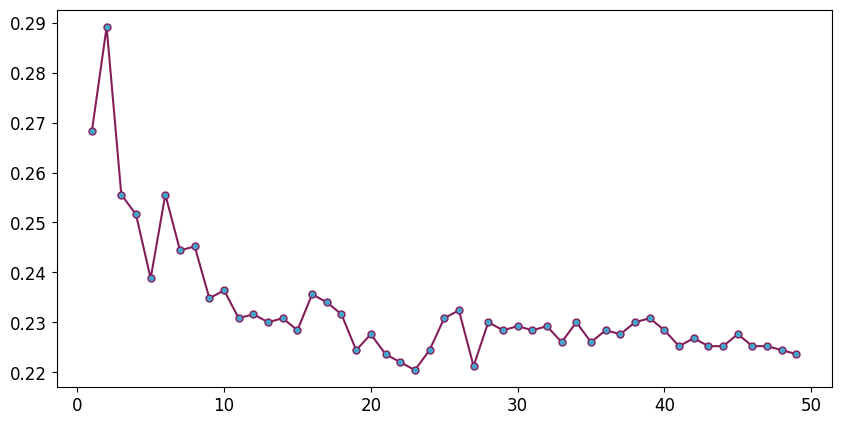

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('GnBu_r', 5)
colors2=sns.color_palette('rocket', 5)

error_rate = []
for i in range(1, 50):
    kNN = KNeighborsClassifier(n_neighbors= i).fit(X_train, y_train)
    y_predi = kNN.predict(X_test)
    error_rate.append(np.mean(y_test != y_predi))
    
fig = plt.figure(figsize=(10, 5))
plt.plot(range(1, 50), error_rate, color=colors2[1], marker='o', markerfacecolor=colors[1], markersize=5)
plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV

# Tuning Hiper-Parámetros 

# Creando grill

param_grid = {'n_neighbors':range(2, 100, 1), 'weights': ['uniform', 'distance'], 'metric':['euclidian', 'manhattan', 'minkowski']}

grid_search = GridSearchCV(estimator = KNeighborsClassifier(), param_grid = param_grid,
        scoring = 'accuracy', n_jobs = -1, cv = 5, verbose = 0, return_train_score = True)

In [ ]:
# Total de instancias a ser probadas
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'metric': ['euclidian', 'manhattan', 'minkowski'],
                         'n_neighbors': range(2, 100),
                         'weights': ['uniform', 'distance']},
             return_train_score=True, scoring='accuracy')

In [ ]:
# Sacar el puntaje y top 5
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_metric,param_n_neighbors,param_weights,params,split0_test_score,split1_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
309,0.019357,0.002976,0.074122,0.020052,manhattan,58,distance,"{'metric': 'manhattan', 'n_neighbors': 58, 'we...",0.786325,0.794521,...,0.796991,0.012871,1,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
305,0.011256,0.003500,0.044677,0.007356,manhattan,56,distance,"{'metric': 'manhattan', 'n_neighbors': 56, 'we...",0.786325,0.792808,...,0.796306,0.013340,2,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
227,0.006884,0.000124,0.016369,0.000563,manhattan,17,distance,"{'metric': 'manhattan', 'n_neighbors': 17, 'we...",0.781197,0.787671,...,0.795965,0.013241,3,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
307,0.014296,0.005156,0.042477,0.014348,manhattan,57,distance,"{'metric': 'manhattan', 'n_neighbors': 57, 'we...",0.782906,0.789384,...,0.795965,0.014956,4,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
308,0.012482,0.002994,0.071832,0.019856,manhattan,58,uniform,"{'metric': 'manhattan', 'n_neighbors': 58, 'we...",0.777778,0.794521,...,0.795624,0.014741,5,0.798801,0.797176,0.795892,0.790329,0.801883,0.796816,0.003812


In [ ]:
# Definir los parametros para el mejor modelo
kNN_best = grid_search.best_estimator_

In [ ]:
y_pred_kNN_best_test = kNN_best.predict(X_test)
y_pred_kNN_best_train = kNN_best.predict(X_train)

# Score test
print('Test Classification Report:\n', classification_report(y_test, y_pred_kNN_best_test))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_kNN_best_test))
kNN_best_test_acc = kNN_best.score(X_test, y_test)
print('Testing Accuracy:', kNN_best_test_acc)

# Score train
print('Train Classification Report:\n', classification_report(y_train, y_pred_kNN_best_train))
print('Confusion Matrix:\n', confusion_matrix(y_train, y_pred_kNN_best_train))
kNN_best_train_acc = kNN_best.score(X_train, y_train)
print('Training Accuracy:', kNN_best_train_acc)

Test Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.77      0.78       644
           1       0.76      0.78      0.77       608

    accuracy                           0.78      1252
   macro avg       0.78      0.78      0.78      1252
weighted avg       0.78      0.78      0.78      1252

Confusion Matrix:
 [[495 149]
 [132 476]]
Testing Accuracy: 0.7755591054313099
Train Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1449
           1       1.00      1.00      1.00      1472

    accuracy                           1.00      2921
   macro avg       1.00      1.00      1.00      2921
weighted avg       1.00      1.00      1.00      2921

Confusion Matrix:
 [[1449    0]
 [   0 1472]]
Training Accuracy: 1.0


<font color='red'>La puntuación de precisión del conjunto de entrenamiento es $1.0$, mientras que la precisión del conjunto de prueba es $0.7755$. Por lo tanto hay signos de sobreajuste.</font> 

In [ ]:
# Performance
from sklearn.metrics import confusion_matrix

cm_kNN_best = confusion_matrix(y_test, y_pred_kNN_best_test)

print('Confusion matrix\n\n', cm_kNN)
print('\nTrue Positives(TP) =', cm_kNN_best[0,0])
print('\nTrue Negatives(TN) =', cm_kNN_best[1,1])
print('\nFalse Positives(FP) =', cm_kNN_best[0,1])
print('\nFalse Negatives(FN) =', cm_kNN_best[1,0])

Confusion matrix

 [[488 156]
 [143 465]]

True Positives(TP) = 495

True Negatives(TN) = 476

False Positives(FP) = 149

False Negatives(FN) = 132


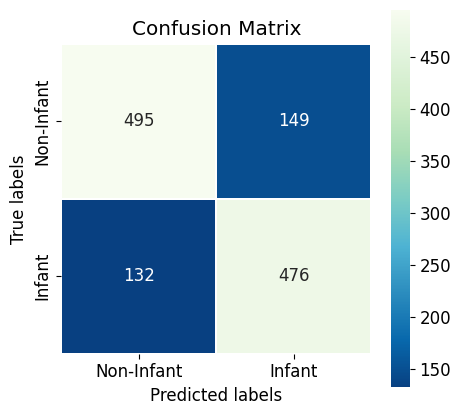

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig = plt.figure(figsize=(5, 5))

ax = plt.subplot()
sns.heatmap(cm_kNN_best, cmap='GnBu_r', annot=True, fmt='g', ax=ax, square=True, linecolor='white', linewidth=0.5)  # Annot=True to annotate cells, fmt='g' to disable scientific notation

ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Non-Infant', 'Infant'])
ax.yaxis.set_ticklabels(['Non-Infant', 'Infant'])
plt.show()

The confusion matrix shows 495 + 476 = 971 correct predictions and 149 + 132 = 281 incorrect predictions.

* True Positives (Actual Positive:1 and Predict Positive:1) - 495
* True Negatives (Actual Negative:0 and Predict Negative:0) - 476
* False Positives (Actual Negative:0 but Predict Positive:1) - 149 (Type I error)
* False Negatives (Actual Positive:1 but Predict Negative:0) - 132 (Type II error)

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

kNN_best_Accuracy_score = accuracy_score(y_test, y_pred_kNN_best_test)
print('Accuracy Score: {:.4f}'.format(kNN_best_Accuracy_score))

kNN_best_F1_score = f1_score(y_test, y_pred_kNN_best_test, average="binary", pos_label='0')
print('F1 Score: {:.4f}'.format(kNN_best_F1_score))

kNN_best_Log_loss = log_loss(y_test, y_pred_kNN_best_test)
print('Log Loss: {:.4f}'.format(kNN_best_Log_loss))

kNN_best_Precision_score = precision_score(y_test, y_pred_kNN_best_test, pos_label='0')
print('Precision Score: {:.4f}'.format(kNN_best_Precision_score))

kNN_best_Recall_score = recall_score(y_test, y_pred_kNN_best_test, pos_label='0')
print('Recall Score: {:.4f}'.format(kNN_best_Recall_score))

kNN_best_Roc_auc_score = roc_auc_score(y_test, y_pred_kNN_best_test)
print('ROC-AUC Score: {:.4f}'.format(kNN_best_Roc_auc_score))

Accuracy Score: 0.7756
F1 Score: 0.7789
Log Loss: 7.7520
Precision Score: 0.7895
Recall Score: 0.7686
ROC-AUC Score: 0.7758


# Decision Trees

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 123)

Preprocessing

Los Decision trees no requieren que se realice el escalado de características ya que no son sensibles a la varianza de los datos.

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Ajustando un primer modelo

# Model
Decision_Trees = DecisionTreeClassifier(max_depth=3, random_state=0).fit(X_train, y_train)
y_pred_Decision_Trees = Decision_Trees.predict(X_test)

# Score
print('Classification Report:\n', classification_report(y_test, y_pred_Decision_Trees))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_Decision_Trees))
Decision_Trees_train_acc = Decision_Trees.score(X_train, y_train)
print('Training Score:', Decision_Trees_train_acc)
Decision_Trees_test_acc = Decision_Trees.score(X_test, y_test)
print('Testing Score:', Decision_Trees_test_acc)

Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.66      0.74       644
           1       0.71      0.85      0.77       608

    accuracy                           0.76      1252
   macro avg       0.77      0.76      0.76      1252
weighted avg       0.77      0.76      0.75      1252

Confusion Matrix:
 [[428 216]
 [ 89 519]]
Training Score: 0.7747346799041425
Testing Score: 0.7563897763578274


<font color='red'>La puntuación de precisión del conjunto de entrenamiento es $0.7747$, mientras que la precisión del conjunto de prueba es $0.7563$. Estos dos valores son bastante comparables. Por lo tanto, no hay signos de sobreajuste.</font> 

In [ ]:
# Performance
from sklearn.metrics import confusion_matrix

cm_Decision_Trees = confusion_matrix(y_test, y_pred_Decision_Trees)

print('Confusion matrix\n\n', cm_Decision_Trees)
print('\nTrue Positives(TP) =', cm_Decision_Trees[0,0])
print('\nTrue Negatives(TN) =', cm_Decision_Trees[1,1])
print('\nFalse Positives(FP) =', cm_Decision_Trees[0,1])
print('\nFalse Negatives(FN) =', cm_Decision_Trees[1,0])

Confusion matrix

 [[428 216]
 [ 89 519]]

True Positives(TP) = 428

True Negatives(TN) = 519

False Positives(FP) = 216

False Negatives(FN) = 89


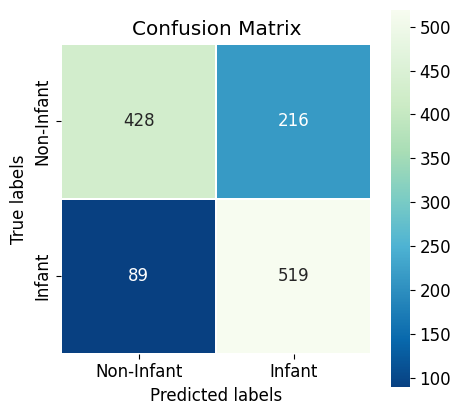

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig = plt.figure(figsize=(5, 5))

ax = plt.subplot()
sns.heatmap(cm_Decision_Trees, cmap='GnBu_r', annot=True, fmt='g', ax=ax, square=True, linecolor='white', linewidth=0.5)  # Annot=True to annotate cells, fmt='g' to disable scientific notation

ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Non-Infant', 'Infant'])
ax.yaxis.set_ticklabels(['Non-Infant', 'Infant'])
plt.show()

The confusion matrix shows 428 + 519 = 947 correct predictions and 216 + 89 = 296 incorrect predictions.

* True Positives (Actual Positive:1 and Predict Positive:1) - 428
* True Negatives (Actual Negative:0 and Predict Negative:0) - 519
* False Positives (Actual Negative:0 but Predict Positive:1) - 216 (Type I error)
* False Negatives (Actual Positive:1 but Predict Negative:0) - 89 (Type II error)

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

Decision_Trees_Accuracy_score = accuracy_score(y_test, y_pred_Decision_Trees)
print('Accuracy Score: {:.4f}'.format(Decision_Trees_Accuracy_score))

Decision_Trees_F1_score = f1_score(y_test, y_pred_Decision_Trees, average="binary", pos_label='0')
print('F1 Score: {:.4f}'.format(Decision_Trees_F1_score))

Decision_Trees_Log_loss = log_loss(y_test, y_pred_Decision_Trees)
print('Log Loss: {:.4f}'.format(Decision_Trees_Log_loss))

Decision_Trees_Precision_score = precision_score(y_test, y_pred_Decision_Trees, pos_label='0')
print('Precision Score: {:.4f}'.format(Decision_Trees_Precision_score))

Decision_Trees_Recall_score = recall_score(y_test, y_pred_Decision_Trees, pos_label='0')
print('Recall Score: {:.4f}'.format(Decision_Trees_Recall_score))

Decision_Trees_Roc_auc_score = roc_auc_score(y_test, y_pred_Decision_Trees)
print('ROC-AUC Score: {:.4f}'.format(Decision_Trees_Roc_auc_score))

Accuracy Score: 0.7564
F1 Score: 0.7373
Log Loss: 8.4141
Precision Score: 0.8279
Recall Score: 0.6646
ROC-AUC Score: 0.7591


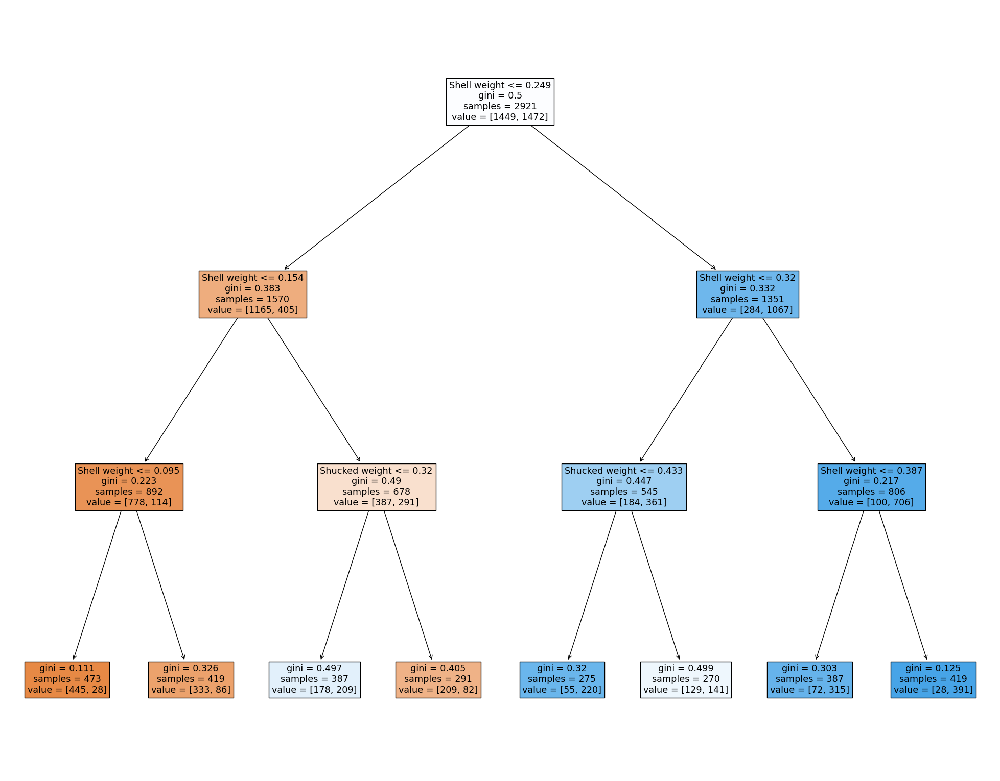

In [ ]:
# Graficando modelo 1
from sklearn import tree
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(Decision_Trees, feature_names=X.columns, filled=True)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Arbol completo

# Model
Decision_Trees_complete = DecisionTreeClassifier(random_state=0).fit(X_train, y_train)
y_pred_Decision_Trees_complete = Decision_Trees_complete.predict(X_test)

# Score
print('Classification Report:\n', classification_report(y_test, y_pred_Decision_Trees_complete))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_Decision_Trees_complete))
Decision_Trees_complete_train_acc = Decision_Trees_complete.score(X_train, y_train)
print('Training Score:', Decision_Trees_complete_train_acc)
Decision_Trees_complete_test_acc = Decision_Trees_complete.score(X_test, y_test)
print('Testing Score:', Decision_Trees_complete_test_acc)

Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.71      0.70       644
           1       0.69      0.68      0.68       608

    accuracy                           0.69      1252
   macro avg       0.69      0.69      0.69      1252
weighted avg       0.69      0.69      0.69      1252

Confusion Matrix:
 [[455 189]
 [193 415]]
Training Score: 1.0
Testing Score: 0.694888178913738


<font color='red'>La puntuación de precisión del conjunto de entrenamiento es $1.0$, mientras que la precisión del conjunto de prueba es $0.6948$. Por lo tanto, hay signos de sobreajuste.</font> 

In [ ]:
# Performance
from sklearn.metrics import confusion_matrix

cm_Decision_Trees_complete = confusion_matrix(y_test, y_pred_Decision_Trees_complete)

print('Confusion matrix\n\n', cm_Decision_Trees_complete)
print('\nTrue Positives(TP) =', cm_Decision_Trees_complete[0,0])
print('\nTrue Negatives(TN) =', cm_Decision_Trees_complete[1,1])
print('\nFalse Positives(FP) =', cm_Decision_Trees_complete[0,1])
print('\nFalse Negatives(FN) =', cm_Decision_Trees_complete[1,0])

Confusion matrix

 [[455 189]
 [193 415]]

True Positives(TP) = 455

True Negatives(TN) = 415

False Positives(FP) = 189

False Negatives(FN) = 193


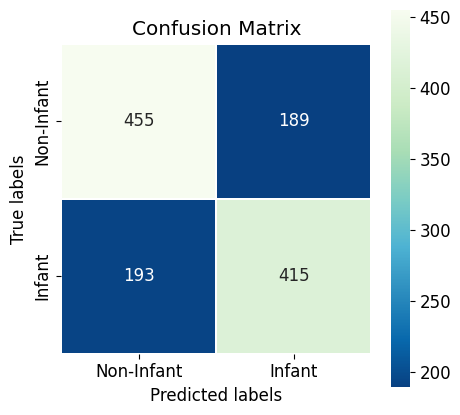

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig = plt.figure(figsize=(5, 5))

ax = plt.subplot()
sns.heatmap(cm_Decision_Trees_complete, cmap='GnBu_r', annot=True, fmt='g', ax=ax, square=True, linecolor='white', linewidth=0.5)  # Annot=True to annotate cells, fmt='g' to disable scientific notation

ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Non-Infant', 'Infant'])
ax.yaxis.set_ticklabels(['Non-Infant', 'Infant'])
plt.show()

The confusion matrix shows 455 + 415 = 870 correct predictions and 189 + 193 = 382 incorrect predictions.

* True Positives (Actual Positive:1 and Predict Positive:1) - 455
* True Negatives (Actual Negative:0 and Predict Negative:0) - 415
* False Positives (Actual Negative:0 but Predict Positive:1) - 189 (Type I error)
* False Negatives (Actual Positive:1 but Predict Negative:0) - 193 (Type II error)

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

Decision_Trees_complete_Accuracy_score = accuracy_score(y_test, y_pred_Decision_Trees_complete)
print('Accuracy Score: {:.4f}'.format(Decision_Trees_complete_Accuracy_score))

Decision_Trees_complete_F1_score = f1_score(y_test, y_pred_Decision_Trees_complete, average="binary", pos_label='0')
print('F1 Score: {:.4f}'.format(Decision_Trees_complete_F1_score))

Decision_Trees_complete_Log_loss = log_loss(y_test, y_pred_Decision_Trees_complete)
print('Log Loss: {:.4f}'.format(Decision_Trees_complete_Log_loss))

Decision_Trees_complete_Precision_score = precision_score(y_test, y_pred_Decision_Trees_complete, pos_label='0')
print('Precision Score: {:.4f}'.format(Decision_Trees_complete_Precision_score))

Decision_Trees_complete_Recall_score = recall_score(y_test, y_pred_Decision_Trees_complete, pos_label='0')
print('Recall Score: {:.4f}'.format(Decision_Trees_complete_Recall_score))

Decision_Trees_complete_Roc_auc_score = roc_auc_score(y_test, y_pred_Decision_Trees_complete)
print('ROC-AUC Score: {:.4f}'.format(Decision_Trees_complete_Roc_auc_score))

Accuracy Score: 0.6949
F1 Score: 0.7043
Log Loss: 10.5383
Precision Score: 0.7022
Recall Score: 0.7065
ROC-AUC Score: 0.6945


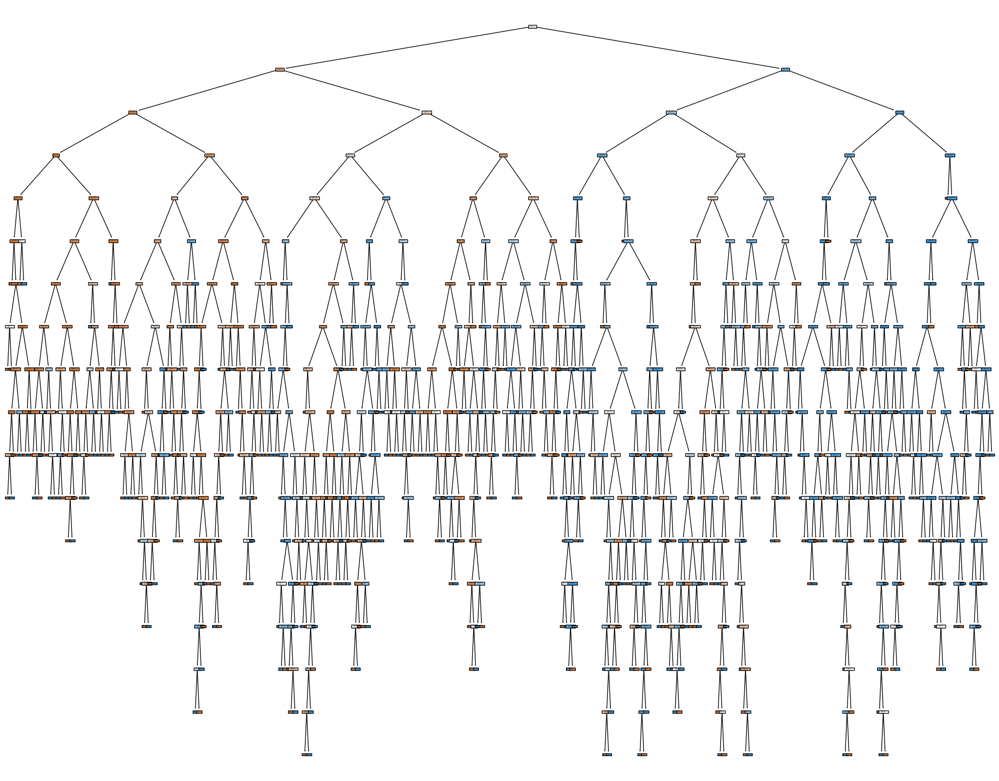

In [ ]:
# Graficando modelo completo
from sklearn import tree
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(Decision_Trees_complete, feature_names=X.columns, filled=True)

In [ ]:
from sklearn.model_selection import GridSearchCV

# Tuning Hiper-Parámetros 

# Creando grill
params = {'max_depth': [2, 3, 5, 10, 20], 'min_samples_leaf': [5, 10, 20, 50, 100], 'criterion': ["gini", "entropy"]}

grid_search = GridSearchCV(estimator=Decision_Trees_complete, param_grid=params, cv=10, n_jobs=-1, verbose=1, scoring = "accuracy")

In [ ]:
# Total de instancias a ser probadas
grid_search.fit(X_train, y_train)

Fitting 10 folds for each of 50 candidates, totalling 500 fits


GridSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=0), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [ ]:
# Sacar el puntaje y top 5
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
18,0.014487,0.001090,0.003278,0.000236,gini,10,50,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",0.764505,0.784247,...,0.801370,0.780822,0.794521,0.794521,0.828767,0.773973,0.784247,0.793916,0.020874,1
23,0.013967,0.000921,0.003135,0.000073,gini,20,50,"{'criterion': 'gini', 'max_depth': 20, 'min_sa...",0.764505,0.784247,...,0.801370,0.780822,0.794521,0.794521,0.828767,0.773973,0.784247,0.793916,0.020874,1
13,0.015268,0.003419,0.003593,0.000447,gini,5,50,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.761092,0.773973,...,0.794521,0.780822,0.801370,0.794521,0.828767,0.773973,0.784247,0.792548,0.022034,3
11,0.015828,0.004584,0.004365,0.003431,gini,5,10,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.737201,0.767123,...,0.791096,0.784247,0.801370,0.801370,0.818493,0.777397,0.773973,0.787076,0.023575,4
47,0.019136,0.000279,0.003178,0.000153,entropy,20,20,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.781570,0.787671,...,0.773973,0.773973,0.811644,0.756849,0.801370,0.791096,0.784247,0.787061,0.016021,5


In [ ]:
# Definir los parametros para el mejor modelo
Decision_Trees_best = grid_search.best_estimator_

In [ ]:
y_pred_Decision_Trees_best_test = Decision_Trees_best.predict(X_test)
y_pred_Decision_Trees_best_train = Decision_Trees_best.predict(X_train)

# Score test
print('Test Classification Report:\n', classification_report(y_test, y_pred_Decision_Trees_best_test))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_Decision_Trees_best_test))
Decision_Trees_best_test_acc = Decision_Trees_best.score(X_test, y_test)
print('Testing Accuracy:', Decision_Trees_best_test_acc)

# Score train
print('Train Classification Report:\n', classification_report(y_train, y_pred_Decision_Trees_best_train))
print('Confusion Matrix:\n', confusion_matrix(y_train, y_pred_Decision_Trees_best_train))
Decision_Trees_best_train_acc = Decision_Trees_best.score(X_train, y_train)
print('Training Accuracy:', Decision_Trees_best_train_acc)

Test Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.74      0.76       644
           1       0.74      0.78      0.76       608

    accuracy                           0.76      1252
   macro avg       0.76      0.76      0.76      1252
weighted avg       0.76      0.76      0.76      1252

Confusion Matrix:
 [[475 169]
 [135 473]]
Testing Accuracy: 0.7571884984025559
Train Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.78      0.80      1449
           1       0.80      0.84      0.82      1472

    accuracy                           0.81      2921
   macro avg       0.81      0.81      0.81      2921
weighted avg       0.81      0.81      0.81      2921

Confusion Matrix:
 [[1134  315]
 [ 241 1231]]
Training Accuracy: 0.8096542280041081


<font color='red'>La puntuación de precisión del conjunto de entrenamiento es $0.8096$, mientras que la precisión del conjunto de prueba es $0.7571$. Estos dos valores son bastante comparables. Por lo tanto, no hay signos de sobreajuste.</font> 

In [ ]:
# Performance
from sklearn.metrics import confusion_matrix

cm_Decision_Trees_best = confusion_matrix(y_test, y_pred_Decision_Trees_best_test)

print('Confusion matrix\n\n', cm_Decision_Trees_best)
print('\nTrue Positives(TP) =', cm_Decision_Trees_best[0,0])
print('\nTrue Negatives(TN) =', cm_Decision_Trees_best[1,1])
print('\nFalse Positives(FP) =', cm_Decision_Trees_best[0,1])
print('\nFalse Negatives(FN) =', cm_Decision_Trees_best[1,0])

Confusion matrix

 [[475 169]
 [135 473]]

True Positives(TP) = 475

True Negatives(TN) = 473

False Positives(FP) = 169

False Negatives(FN) = 135


The confusion matrix shows 475 + 473 = 948 correct predictions and 169 + 135 = 304 incorrect predictions.

* True Positives (Actual Positive:1 and Predict Positive:1) - 475
* True Negatives (Actual Negative:0 and Predict Negative:0) - 473
* False Positives (Actual Negative:0 but Predict Positive:1) - 169 (Type I error)
* False Negatives (Actual Positive:1 but Predict Negative:0) - 135 (Type II error)

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

Decision_Trees_best_Accuracy_score = accuracy_score(y_test, y_pred_Decision_Trees_best_test)
print('Accuracy Score: {:.4f}'.format(Decision_Trees_best_Accuracy_score))

Decision_Trees_best_F1_score = f1_score(y_test, y_pred_Decision_Trees_best_test, average="binary", pos_label='0')
print('F1 Score: {:.4f}'.format(Decision_Trees_best_F1_score))

Decision_Trees_best_Log_loss = log_loss(y_test, y_pred_Decision_Trees_best_test)
print('Log Loss: {:.4f}'.format(Decision_Trees_best_Log_loss))

Decision_Trees_best_Precision_score = precision_score(y_test, y_pred_Decision_Trees_best_test, pos_label='0')
print('Precision Score: {:.4f}'.format(Decision_Trees_best_Precision_score))

Decision_Trees_best_Recall_score = recall_score(y_test, y_pred_Decision_Trees_best_test, pos_label='0')
print('Recall Score: {:.4f}'.format(Decision_Trees_best_Recall_score))

Decision_Trees_best_Roc_auc_score = roc_auc_score(y_test, y_pred_Decision_Trees_best_test)
print('ROC-AUC Score: {:.4f}'.format(Decision_Trees_best_Roc_auc_score))

Accuracy Score: 0.7572
F1 Score: 0.7576
Log Loss: 8.3865
Precision Score: 0.7787
Recall Score: 0.7376
ROC-AUC Score: 0.7578


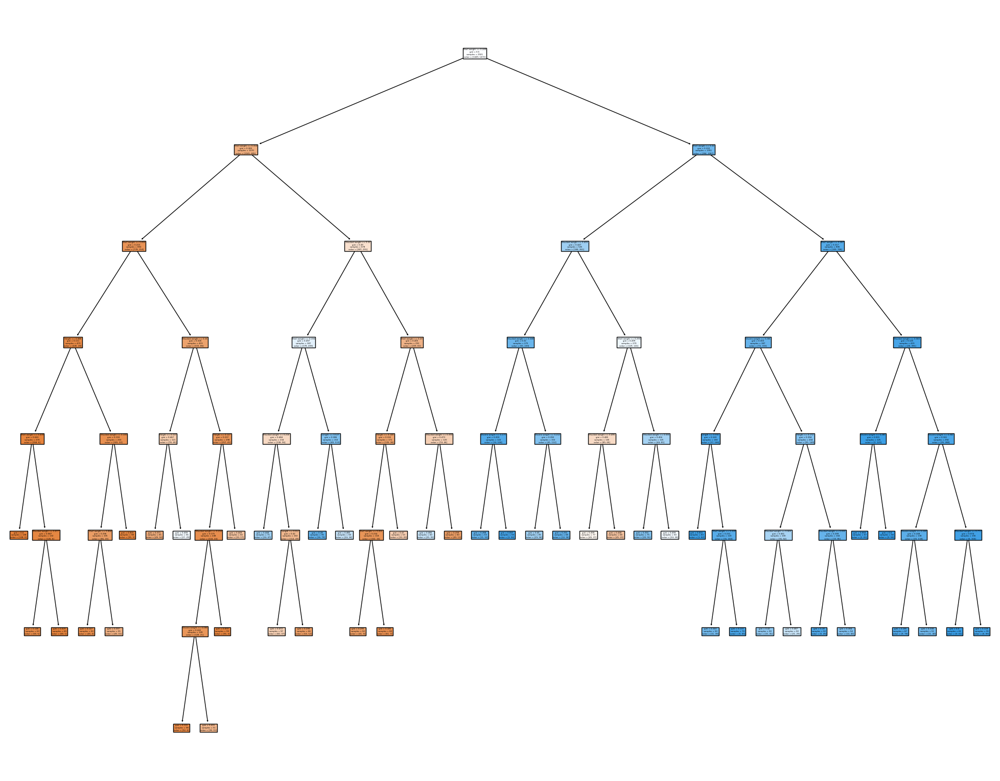

In [ ]:
# Graficando mejor modelo 
from sklearn import tree
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(Decision_Trees_best, feature_names=X.columns, filled=True)

# Naive Bayes

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 123)

Preprocessing

In [ ]:
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import classification_report, confusion_matrix

# Model
Bernoulli_NB = BernoulliNB().fit(X_train, y_train)
y_pred_Bernoulli_NB = Bernoulli_NB.predict(X_test)

# Score
print('Classification Report:\n', classification_report(y_test, y_pred_Bernoulli_NB))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_Bernoulli_NB))
Bernoulli_NB_train_acc = Bernoulli_NB.score(X_train, y_train)
print('Training Score:', Bernoulli_NB_train_acc)
Bernoulli_NB_test_acc = Bernoulli_NB.score(X_test, y_test)
print('Testing Score:', Bernoulli_NB_test_acc)

Classification Report:
               precision    recall  f1-score   support

           0       0.72      0.73      0.72       644
           1       0.71      0.69      0.70       608

    accuracy                           0.71      1252
   macro avg       0.71      0.71      0.71      1252
weighted avg       0.71      0.71      0.71      1252

Confusion Matrix:
 [[471 173]
 [187 421]]
Training Score: 0.7302293735022253
Testing Score: 0.7124600638977636


<font color='red'>La puntuación de precisión del conjunto de entrenamiento es $0.73280$, mientras que la precisión del conjunto de prueba es $0.73604$. Estos dos valores son bastante comparables. Por lo tanto, no hay signos de sobreajuste.</font> 

In [ ]:
from sklearn.metrics import accuracy_score

print('Model accuracy score: {0:0.4f}'.format(accuracy_score(y_test, y_pred_Bernoulli_NB)))

Model accuracy score: 0.7292


Entonces, la precisión del modelo es $0.7360$. Pero no se puede decir que el modelo sea muy bueno en base a la precisión anterior. Se debe comparar con la precisión nula. La precisión nula es la precisión que se podría lograr prediciendo siempre la clase más frecuente.

Se debe de verificar la distribución de clases en el conjunto de prueba.

In [ ]:
y_test.value_counts()

0    644
1    608
Name: Rings_transform, dtype: int64

Las ocurrencias de la clase más frecuente son $635$ (Infant). Entonces, se calcula la precisión nula dividiendo $635$ por el número total de ocurrencias.

In [ ]:
null_accuracy = (644/(644+608))

print('Null accuracy score: {0:0.4f}'.format(null_accuracy))

Null accuracy score: 0.5144


<font color='red'>La puntuación de precisión del modelo es $0.7292$, y la puntuación de precisión nula es $0.5144$. Por lo tanto, se puede concluir que el modelo de clasificación de Bernoulli Naive Bayes está haciendo un muy buen trabajo al predecir las etiquetas de clase.</font> 

In [ ]:
# Performance
from sklearn.metrics import confusion_matrix

cm_Bernoulli_NB = confusion_matrix(y_test, y_pred_Bernoulli_NB)

print('Confusion matrix\n\n', cm_Bernoulli_NB)
print('\nTrue Positives(TP) =', cm_Bernoulli_NB[0,0])
print('\nTrue Negatives(TN) =', cm_Bernoulli_NB[1,1])
print('\nFalse Positives(FP) =', cm_Bernoulli_NB[0,1])
print('\nFalse Negatives(FN) =', cm_Bernoulli_NB[1,0])

Confusion matrix

 [[471 173]
 [187 421]]

True Positives(TP) = 471

True Negatives(TN) = 421

False Positives(FP) = 173

False Negatives(FN) = 187


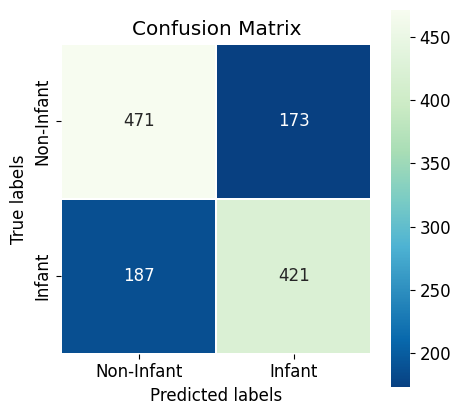

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig = plt.figure(figsize=(5, 5))

ax = plt.subplot()
sns.heatmap(cm_Bernoulli_NB, cmap='GnBu_r', annot=True, fmt='g', ax=ax, square=True, linecolor='white', linewidth=0.5)  # Annot=True to annotate cells, fmt='g' to disable scientific notation

ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Non-Infant', 'Infant'])
ax.yaxis.set_ticklabels(['Non-Infant', 'Infant'])
plt.show()

The confusion matrix shows 473 + 440 = 913 correct predictions and 171 + 168 = 339 incorrect predictions.

* True Positives (Actual Positive:1 and Predict Positive:1) - 473
* True Negatives (Actual Negative:0 and Predict Negative:0) - 440
* False Positives (Actual Negative:0 but Predict Positive:1) - 171 (Type I error)
* False Negatives (Actual Positive:1 but Predict Negative:0) - 168 (Type II error)

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

Bernoulli_NB_Accuracy_score = accuracy_score(y_test, y_pred_Bernoulli_NB)
print('Accuracy Score: {:.4f}'.format(Bernoulli_NB_Accuracy_score))

Bernoulli_NB_F1_score = f1_score(y_test, y_pred_Bernoulli_NB, average="binary", pos_label='0')
print('F1 Score: {:.4f}'.format(Bernoulli_NB_F1_score))

Bernoulli_NB_Log_loss = log_loss(y_test, y_pred_Bernoulli_NB)
print('Log Loss: {:.4f}'.format(Bernoulli_NB_Log_loss))

Bernoulli_NB_Precision_score = precision_score(y_test, y_pred_Bernoulli_NB, pos_label='0')
print('Precision Score: {:.4f}'.format(Bernoulli_NB_Precision_score))

Bernoulli_NB_Recall_score = recall_score(y_test, y_pred_Bernoulli_NB, pos_label='0')
print('Recall Score: {:.4f}'.format(Bernoulli_NB_Recall_score))

Bernoulli_NB_Roc_auc_score = roc_auc_score(y_test, y_pred_Bernoulli_NB)
print('ROC-AUC Score: {:.4f}'.format(Bernoulli_NB_Roc_auc_score))

Accuracy Score: 0.7125
F1 Score: 0.7235
Log Loss: 9.9314
Precision Score: 0.7158
Recall Score: 0.7314
ROC-AUC Score: 0.7119


# Random Trees/Random Forest

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 123)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Model
Random_Forest = RandomForestClassifier(max_depth=3, random_state=0).fit(X_train, y_train)
y_pred_Random_Forest = Random_Forest.predict(X_test)

# Score
print('Classification Report:\n', classification_report(y_test, y_pred_Random_Forest))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_Random_Forest))
Random_Forest_train_acc = Random_Forest.score(X_train, y_train)
print('Training Score:', Random_Forest_train_acc)
Random_Forest_test_acc = Random_Forest.score(X_test, y_test)
print('Testing Score:', Random_Forest_test_acc)

Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.75      0.76       644
           1       0.74      0.76      0.75       608

    accuracy                           0.76      1252
   macro avg       0.76      0.76      0.76      1252
weighted avg       0.76      0.76      0.76      1252

Confusion Matrix:
 [[485 159]
 [146 462]]
Training Score: 0.7884286203355015
Testing Score: 0.7563897763578274


<font color='red'>La puntuación de precisión del conjunto de entrenamiento es $0.7884$, mientras que la precisión del conjunto de prueba es $0.7563$. Estos dos valores son bastante comparables. Por lo tanto, no hay signos de sobreajuste.</font> 

In [ ]:
# Performance
from sklearn.metrics import confusion_matrix

cm_Random_Forest = confusion_matrix(y_test, y_pred_Random_Forest)

print('Confusion matrix\n\n', cm_Random_Forest)
print('\nTrue Positives(TP) =', cm_Random_Forest[0,0])
print('\nTrue Negatives(TN) =', cm_Random_Forest[1,1])
print('\nFalse Positives(FP) =', cm_Random_Forest[0,1])
print('\nFalse Negatives(FN) =', cm_Random_Forest[1,0])

Confusion matrix

 [[485 159]
 [146 462]]

True Positives(TP) = 485

True Negatives(TN) = 462

False Positives(FP) = 159

False Negatives(FN) = 146


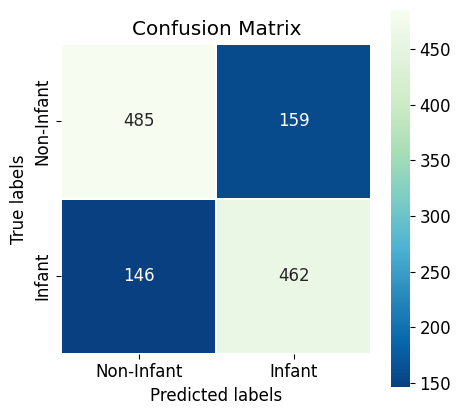

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig = plt.figure(figsize=(5, 5))

ax = plt.subplot()
sns.heatmap(cm_Random_Forest, cmap='GnBu_r', annot=True, fmt='g', ax=ax, square=True, linecolor='white', linewidth=0.5)  # Annot=True to annotate cells, fmt='g' to disable scientific notation

ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Non-Infant', 'Infant'])
ax.yaxis.set_ticklabels(['Non-Infant', 'Infant'])
plt.show()

The confusion matrix shows 485 + 462 = 947 correct predictions and 159 + 146 = 305 incorrect predictions.

* True Positives (Actual Positive:1 and Predict Positive:1) - 485
* True Negatives (Actual Negative:0 and Predict Negative:0) - 462
* False Positives (Actual Negative:0 but Predict Positive:1) - 159 (Type I error)
* False Negatives (Actual Positive:1 but Predict Negative:0) - 146 (Type II error)

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

Random_Forest_Accuracy_score = accuracy_score(y_test, y_pred_Random_Forest)
print('Accuracy Score: {:.4f}'.format(Random_Forest_Accuracy_score))

Random_Forest_F1_score = f1_score(y_test, y_pred_Random_Forest, average="binary", pos_label='0')
print('F1 Score: {:.4f}'.format(Random_Forest_F1_score))

Random_Forest_Log_loss = log_loss(y_test, y_pred_Random_Forest)
print('Log Loss: {:.4f}'.format(Random_Forest_Log_loss))

Random_Forest_Precision_score = precision_score(y_test, y_pred_Random_Forest, pos_label='0')
print('Precision Score: {:.4f}'.format(Random_Forest_Precision_score))

Random_Forest_Recall_score = recall_score(y_test, y_pred_Random_Forest, pos_label='0')
print('Recall Score: {:.4f}'.format(Random_Forest_Recall_score))

Random_Forest_Roc_auc_score = roc_auc_score(y_test, y_pred_Random_Forest)
print('ROC-AUC Score: {:.4f}'.format(Random_Forest_Roc_auc_score))

Accuracy Score: 0.7564
F1 Score: 0.7608
Log Loss: 8.4141
Precision Score: 0.7686
Recall Score: 0.7531
ROC-AUC Score: 0.7565


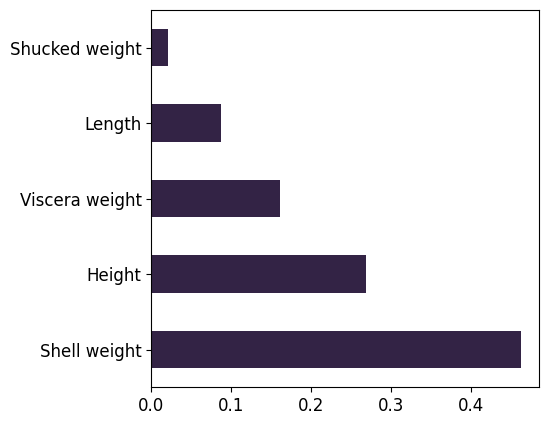

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100
colors=sns.color_palette('mako', 5)

plt.figure(figsize=(5, 5))
feat_importances = pd.Series(Random_Forest.feature_importances_, index = X_train.columns)
feat_importances.nlargest(7).plot(kind='barh', color=colors[0])
plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold

# Tuning Hiper-Parámetros 

# Creando grill
param_grid = {'n_estimators': [150], 'max_features': [5, 7, 9], 'max_depth': [None, 3, 10, 20], 'criterion': ['gini', 'entropy']}

grid_search = GridSearchCV(estimator = RandomForestClassifier(random_state = 123), param_grid = param_grid, 
        scoring = 'accuracy', n_jobs=-1, cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=123), 
        refit = True, verbose = 0, return_train_score = True)

In [ ]:
# Total de instancias a ser probadas
grid_search.fit(X_train, y_train)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=5, random_state=123),
             estimator=RandomForestClassifier(random_state=123), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 3, 10, 20],
                         'max_features': [5, 7, 9], 'n_estimators': [150]},
             return_train_score=True, scoring='accuracy')

In [ ]:
# Sacar el puntaje y top 5
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_max_features,param_n_estimators,params,split0_test_score,...,split7_train_score,split8_train_score,split9_train_score,split10_train_score,split11_train_score,split12_train_score,split13_train_score,split14_train_score,mean_train_score,std_train_score
18,2.033305,0.093219,0.053074,0.010940,entropy,10,5,150,"{'criterion': 'entropy', 'max_depth': 10, 'max...",0.829060,...,0.946941,0.933676,0.937527,0.934503,0.937955,0.937527,0.944801,0.933676,0.939718,0.005788
6,1.374214,0.014722,0.050141,0.002637,gini,10,5,150,"{'criterion': 'gini', 'max_depth': 10, 'max_fe...",0.818803,...,0.961489,0.956782,0.955499,0.956764,0.961917,0.958066,0.961061,0.954643,0.958576,0.003806
12,2.234256,0.047881,0.051236,0.002814,entropy,None,5,150,"{'criterion': 'entropy', 'max_depth': None, 'm...",0.818803,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
9,1.775069,0.489448,0.054036,0.012292,gini,20,5,150,"{'criterion': 'gini', 'max_depth': 20, 'max_fe...",0.815385,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
21,2.463027,0.537558,0.051719,0.004308,entropy,20,5,150,"{'criterion': 'entropy', 'max_depth': 20, 'max...",0.815385,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000


In [ ]:
# Definir los parametros para el mejor modelo
Random_Forest_best = grid_search.best_estimator_

In [ ]:
y_pred_Random_Forest_best_test = Random_Forest_best.predict(X_test)
y_pred_Random_Forest_best_train = Random_Forest_best.predict(X_train)

# Score test
print('Test Classification Report:\n', classification_report(y_test, y_pred_Random_Forest_best_test))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_Random_Forest_best_test))
Random_Forest_best_test_acc = Random_Forest_best.score(X_test, y_test)
print('Testing Accuracy:', Random_Forest_best_test_acc)

# Score train
print('Train Classification Report:\n', classification_report(y_train, y_pred_Random_Forest_best_train))
print('Confusion Matrix:\n', confusion_matrix(y_train, y_pred_Random_Forest_best_train))
Random_Forest_best_train_acc = Random_Forest_best.score(X_train, y_train)
print('Training Accuracy:', Random_Forest_best_train_acc)

Test Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.75      0.77       644
           1       0.75      0.79      0.77       608

    accuracy                           0.77      1252
   macro avg       0.77      0.77      0.77      1252
weighted avg       0.77      0.77      0.77      1252

Confusion Matrix:
 [[483 161]
 [128 480]]
Testing Accuracy: 0.7691693290734825
Train Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.91      0.93      1449
           1       0.92      0.95      0.93      1472

    accuracy                           0.93      2921
   macro avg       0.93      0.93      0.93      2921
weighted avg       0.93      0.93      0.93      2921

Confusion Matrix:
 [[1320  129]
 [  80 1392]]
Training Accuracy: 0.9284491612461486


<font color='red'>La puntuación de precisión del conjunto de entrenamiento es $0.9284$, mientras que la precisión del conjunto de prueba es $0.7691$. Pueden ser signos de sobreajuste.</font> 

In [ ]:
# Performance
from sklearn.metrics import confusion_matrix

cm_Random_Forest_best = confusion_matrix(y_test, y_pred_Random_Forest_best_test)

print('Confusion matrix\n\n', cm_Random_Forest_best)
print('\nTrue Positives(TP) =', cm_Random_Forest_best[0,0])
print('\nTrue Negatives(TN) =', cm_Random_Forest_best[1,1])
print('\nFalse Positives(FP) =', cm_Random_Forest_best[0,1])
print('\nFalse Negatives(FN) =', cm_Random_Forest_best[1,0])

Confusion matrix

 [[483 161]
 [128 480]]

True Positives(TP) = 483

True Negatives(TN) = 480

False Positives(FP) = 161

False Negatives(FN) = 128


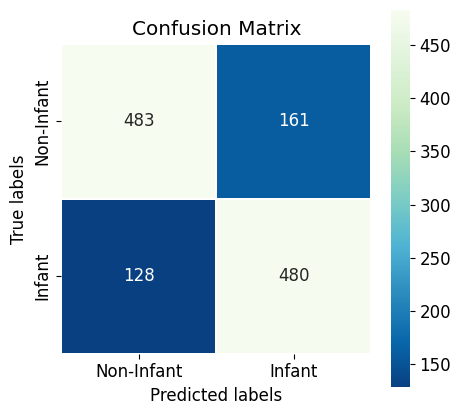

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig = plt.figure(figsize=(5, 5))

ax = plt.subplot()
sns.heatmap(cm_Random_Forest_best, cmap='GnBu_r', annot=True, fmt='g', ax=ax, square=True, linecolor='white', linewidth=0.5)  # Annot=True to annotate cells, fmt='g' to disable scientific notation

ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Non-Infant', 'Infant'])
ax.yaxis.set_ticklabels(['Non-Infant', 'Infant'])
plt.show()

The confusion matrix shows 483 + 480 = 963 correct predictions and 161 + 128 = 289 incorrect predictions.

* True Positives (Actual Positive:1 and Predict Positive:1) - 483
* True Negatives (Actual Negative:0 and Predict Negative:0) - 480
* False Positives (Actual Negative:0 but Predict Positive:1) - 161 (Type I error)
* False Negatives (Actual Positive:1 but Predict Negative:0) - 128 (Type II error)

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

Random_Forest_best_Accuracy_score = accuracy_score(y_test, y_pred_Random_Forest_best_test)
print('Accuracy Score: {:.4f}'.format(Random_Forest_best_Accuracy_score))

Random_Forest_best_F1_score = f1_score(y_test, y_pred_Random_Forest_best_test, average="binary", pos_label='0')
print('F1 Score: {:.4f}'.format(Random_Forest_best_F1_score))

Random_Forest_best_Log_loss = log_loss(y_test, y_pred_Random_Forest_best_test)
print('Log Loss: {:.4f}'.format(Random_Forest_best_Log_loss))

Random_Forest_best_Precision_score = precision_score(y_test, y_pred_Random_Forest_best_test, pos_label='0')
print('Precision Score: {:.4f}'.format(Random_Forest_best_Precision_score))

Random_Forest_best_Recall_score = recall_score(y_test, y_pred_Random_Forest_best_test, pos_label='0')
print('Recall Score: {:.4f}'.format(Random_Forest_best_Recall_score))

Random_Forest_best_Roc_auc_score = roc_auc_score(y_test, y_pred_Random_Forest_best_test)
print('ROC-AUC Score: {:.4f}'.format(Random_Forest_best_Roc_auc_score))

Accuracy Score: 0.7692
F1 Score: 0.7697
Log Loss: 7.9727
Precision Score: 0.7905
Recall Score: 0.7500
ROC-AUC Score: 0.7697


# Ensemble Learning

Preprocessing

Los ensemble methods no requieren que se realice el escalado de características, ya que no son sensibles a la varianza de los datos.

## Voting Classifier

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 123)

In [ ]:
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.ensemble import VotingClassifier
from sklearn.metrics import classification_report, confusion_matrix

model_1 = GradientBoostingClassifier(random_state=1).fit(X_train, y_train)
model_2 = RandomForestClassifier(random_state=1).fit(X_train, y_train)
model_3 = LogisticRegression().fit(X_train, y_train)
model_4 = KNeighborsClassifier().fit(X_train, y_train)
model_5 = GaussianNB().fit(X_train, y_train)

# Model
Voting = VotingClassifier([("Gradient Boosting", model_1), ("Random Forest", model_2), ("Logistic Regression", model_3), ("K-Neighbors", model_4), ("Gaussian NB", model_5)]).fit(X_train, y_train)
y_pred_Voting = Voting.predict(X_test)

# Score
print('Classification Report:\n', classification_report(y_test, y_pred_Voting))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_Voting))
Voting_train_acc = Voting.score(X_train, y_train)
print('Training Score:', Voting_train_acc)
Voting_test_acc = Voting.score(X_test, y_test)
print('Testing Score:', Voting_test_acc)

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.77      0.78       644
           1       0.76      0.79      0.78       608

    accuracy                           0.78      1252
   macro avg       0.78      0.78      0.78      1252
weighted avg       0.78      0.78      0.78      1252

Confusion Matrix:
 [[497 147]
 [130 478]]
Training Score: 0.8521054433413214
Testing Score: 0.7787539936102237


<font color='red'>La puntuación de precisión del conjunto de entrenamiento es $0.8521$, mientras que la precisión del conjunto de prueba es $0.7787$. Estos dos valores son bastante comparables. Por lo tanto, no hay signos de sobreajuste.</font> 

In [ ]:
# Performance
from sklearn.metrics import confusion_matrix

cm_Voting = confusion_matrix(y_test, y_pred_Voting)

print('Confusion matrix\n\n', cm_Voting)
print('\nTrue Positives(TP) =', cm_Voting[0,0])
print('\nTrue Negatives(TN) =', cm_Voting[1,1])
print('\nFalse Positives(FP) =', cm_Voting[0,1])
print('\nFalse Negatives(FN) =', cm_Voting[1,0])

Confusion matrix

 [[497 147]
 [130 478]]

True Positives(TP) = 497

True Negatives(TN) = 478

False Positives(FP) = 147

False Negatives(FN) = 130


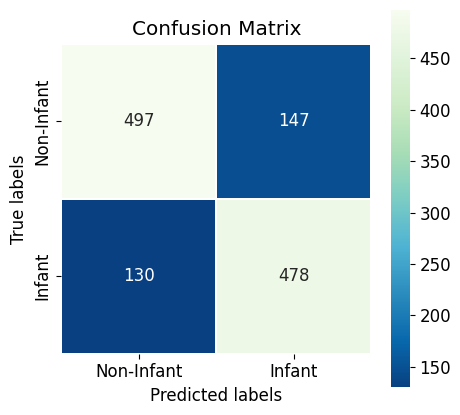

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig = plt.figure(figsize=(5, 5))

ax = plt.subplot()
sns.heatmap(cm_Voting, cmap='GnBu_r', annot=True, fmt='g', ax=ax, square=True, linecolor='white', linewidth=0.5)  # Annot=True to annotate cells, fmt='g' to disable scientific notation

ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Non-Infant', 'Infant'])
ax.yaxis.set_ticklabels(['Non-Infant', 'Infant'])
plt.show()

The confusion matrix shows 497 + 478 = 975 correct predictions and 147 + 130 = 277 incorrect predictions.

* True Positives (Actual Positive:1 and Predict Positive:1) - 497
* True Negatives (Actual Negative:0 and Predict Negative:0) - 478
* False Positives (Actual Negative:0 but Predict Positive:1) - 147 (Type I error)
* False Negatives (Actual Positive:1 but Predict Negative:0) - 130 (Type II error)

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

Voting_Accuracy_score = accuracy_score(y_test, y_pred_Voting)
print('Accuracy Score: {:.4f}'.format(Voting_Accuracy_score))

Voting_F1_score = f1_score(y_test, y_pred_Voting, average="binary", pos_label='0')
print('F1 Score: {:.4f}'.format(Voting_F1_score))

Voting_Log_loss = log_loss(y_test, y_pred_Voting)
print('Log Loss: {:.4f}'.format(Voting_Log_loss))

Voting_Precision_score = precision_score(y_test, y_pred_Voting, pos_label='0')
print('Precision Score: {:.4f}'.format(Voting_Precision_score))

Voting_Recall_score = recall_score(y_test, y_pred_Voting, pos_label='0')
print('Recall Score: {:.4f}'.format(Voting_Recall_score))

Voting_Roc_auc_score = roc_auc_score(y_test, y_pred_Voting)
print('ROC-AUC Score: {:.4f}'.format(Voting_Roc_auc_score))

Accuracy Score: 0.7788
F1 Score: 0.7821
Log Loss: 7.6417
Precision Score: 0.7927
Recall Score: 0.7717
ROC-AUC Score: 0.7790


## AdaBoost Classifier

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 123)

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Model
AdaBoost = AdaBoostClassifier(random_state=0, n_estimators=100).fit(X_train, y_train)
y_pred_AdaBoost = AdaBoost.predict(X_test)

# Score
print('Classification Report:\n', classification_report(y_test, y_pred_AdaBoost))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_AdaBoost))
AdaBoost_train_acc = AdaBoost.score(X_train, y_train)
print('Training Score:', AdaBoost_train_acc)
AdaBoost_test_acc = AdaBoost.score(X_test, y_test)
print('Testing Score:', AdaBoost_test_acc)

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.75      0.77       644
           1       0.75      0.78      0.77       608

    accuracy                           0.77      1252
   macro avg       0.77      0.77      0.77      1252
weighted avg       0.77      0.77      0.77      1252

Confusion Matrix:
 [[484 160]
 [132 476]]
Training Score: 0.8055460458747005
Testing Score: 0.7667731629392971


<font color='red'>La puntuación de precisión del conjunto de entrenamiento es $0.8055$, mientras que la precisión del conjunto de prueba es $0.7667$. Estos dos valores son bastante comparables. Por lo tanto, no hay signos de sobreajuste.</font> 

In [ ]:
# Performance
from sklearn.metrics import confusion_matrix

cm_AdaBoost = confusion_matrix(y_test, y_pred_AdaBoost)

print('Confusion matrix\n\n', cm_AdaBoost)
print('\nTrue Positives(TP) =', cm_AdaBoost[0,0])
print('\nTrue Negatives(TN) =', cm_AdaBoost[1,1])
print('\nFalse Positives(FP) =', cm_AdaBoost[0,1])
print('\nFalse Negatives(FN) =', cm_AdaBoost[1,0])

Confusion matrix

 [[484 160]
 [132 476]]

True Positives(TP) = 484

True Negatives(TN) = 476

False Positives(FP) = 160

False Negatives(FN) = 132


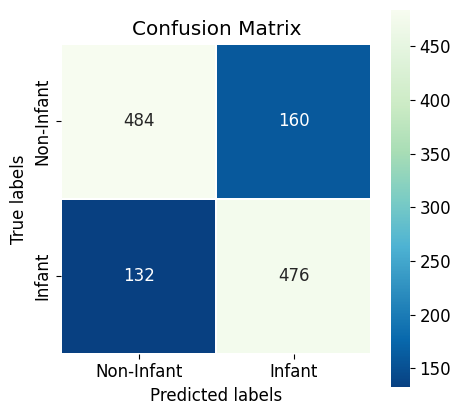

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig = plt.figure(figsize=(5, 5))

ax = plt.subplot()
sns.heatmap(cm_AdaBoost, cmap='GnBu_r', annot=True, fmt='g', ax=ax, square=True, linecolor='white', linewidth=0.5)  # Annot=True to annotate cells, fmt='g' to disable scientific notation

ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Non-Infant', 'Infant'])
ax.yaxis.set_ticklabels(['Non-Infant', 'Infant'])
plt.show()

The confusion matrix shows 484 + 476 = 960 correct predictions and 160 + 132 = 292 incorrect predictions.

* True Positives (Actual Positive:1 and Predict Positive:1) - 484
* True Negatives (Actual Negative:0 and Predict Negative:0) - 476
* False Positives (Actual Negative:0 but Predict Positive:1) - 160 (Type I error)
* False Negatives (Actual Positive:1 but Predict Negative:0) - 132 (Type II error)

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

AdaBoost_Accuracy_score = accuracy_score(y_test, y_pred_AdaBoost)
print('Accuracy Score: {:.4f}'.format(AdaBoost_Accuracy_score))

AdaBoost_F1_score = f1_score(y_test, y_pred_AdaBoost, average="binary", pos_label='0')
print('F1 Score: {:.4f}'.format(AdaBoost_F1_score))

AdaBoost_Log_loss = log_loss(y_test, y_pred_AdaBoost)
print('Log Loss: {:.4f}'.format(AdaBoost_Log_loss))

AdaBoost_Precision_score = precision_score(y_test, y_pred_AdaBoost, pos_label='0')
print('Precision Score: {:.4f}'.format(AdaBoost_Precision_score))

AdaBoost_Recall_score = recall_score(y_test, y_pred_AdaBoost, pos_label='0')
print('Recall Score: {:.4f}'.format(AdaBoost_Recall_score))

AdaBoost_Roc_auc_score = roc_auc_score(y_test, y_pred_AdaBoost)
print('ROC-AUC Score: {:.4f}'.format(AdaBoost_Roc_auc_score))

Accuracy Score: 0.7668
F1 Score: 0.7683
Log Loss: 8.0555
Precision Score: 0.7857
Recall Score: 0.7516
ROC-AUC Score: 0.7672


## Gradient Boosting Classifier

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 123)

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Model
Gradient_Boosting = GradientBoostingClassifier(random_state=0).fit(X_train, y_train)
y_pred_Gradient_Boosting = Gradient_Boosting.predict(X_test)

# Score
print('Classification Report:\n', classification_report(y_test, y_pred_Gradient_Boosting))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_Gradient_Boosting))
Gradient_Boosting_train_acc = Gradient_Boosting.score(X_train, y_train)
print('Training Score:', Gradient_Boosting_train_acc)
Gradient_Boosting_test_acc = Gradient_Boosting.score(X_test, y_test)
print('Testing Score:', Gradient_Boosting_test_acc)

Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.78      0.79       644
           1       0.77      0.79      0.78       608

    accuracy                           0.79      1252
   macro avg       0.79      0.79      0.79      1252
weighted avg       0.79      0.79      0.79      1252

Confusion Matrix:
 [[502 142]
 [126 482]]
Training Score: 0.8366997603560424
Testing Score: 0.7859424920127795


<font color='red'>La puntuación de precisión del conjunto de entrenamiento es $0.8366$, mientras que la precisión del conjunto de prueba es $0.7859$. Estos dos valores son bastante comparables. Por lo tanto, no hay signos de sobreajuste.</font> 

In [ ]:
# Performance
from sklearn.metrics import confusion_matrix

cm_Gradient_Boosting = confusion_matrix(y_test, y_pred_Gradient_Boosting)

print('Confusion matrix\n\n', cm_Gradient_Boosting)
print('\nTrue Positives(TP) =', cm_Gradient_Boosting[0,0])
print('\nTrue Negatives(TN) =', cm_Gradient_Boosting[1,1])
print('\nFalse Positives(FP) =', cm_Gradient_Boosting[0,1])
print('\nFalse Negatives(FN) =', cm_Gradient_Boosting[1,0])

Confusion matrix

 [[502 142]
 [126 482]]

True Positives(TP) = 502

True Negatives(TN) = 482

False Positives(FP) = 142

False Negatives(FN) = 126


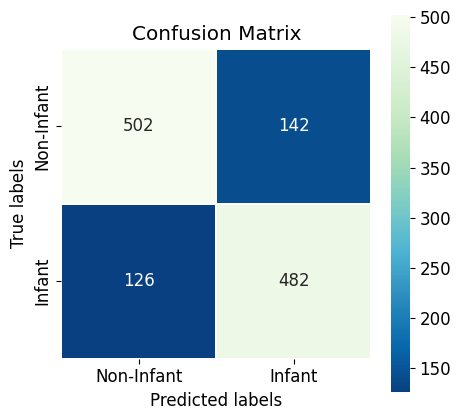

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig = plt.figure(figsize=(5, 5))

ax = plt.subplot()
sns.heatmap(cm_Gradient_Boosting , cmap='GnBu_r', annot=True, fmt='g', ax=ax, square=True, linecolor='white', linewidth=0.5)  # Annot=True to annotate cells, fmt='g' to disable scientific notation

ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Non-Infant', 'Infant'])
ax.yaxis.set_ticklabels(['Non-Infant', 'Infant'])
plt.show()

The confusion matrix shows 502 + 482 = 984 correct predictions and 142 + 126 = 286 incorrect predictions.

* True Positives (Actual Positive:1 and Predict Positive:1) - 502
* True Negatives (Actual Negative:0 and Predict Negative:0) - 482
* False Positives (Actual Negative:0 but Predict Positive:1) - 142 (Type I error)
* False Negatives (Actual Positive:1 but Predict Negative:0) - 126 (Type II error)

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

Gradient_Boosting_Accuracy_score = accuracy_score(y_test, y_pred_Gradient_Boosting)
print('Accuracy Score: {:.4f}'.format(Gradient_Boosting_Accuracy_score))

Gradient_Boosting_F1_score = f1_score(y_test, y_pred_Gradient_Boosting, average="binary", pos_label='0')
print('F1 Score: {:.4f}'.format(Gradient_Boosting_F1_score))

Gradient_Boosting_Log_loss = log_loss(y_test, y_pred_Gradient_Boosting)
print('Log Loss: {:.4f}'.format(Gradient_Boosting_Log_loss))

Gradient_Boosting_Precision_score = precision_score(y_test, y_pred_Gradient_Boosting, pos_label='0')
print('Precision Score: {:.4f}'.format(Gradient_Boosting_Precision_score))

Gradient_Boosting_Recall_score = recall_score(y_test, y_pred_Gradient_Boosting, pos_label='0')
print('Recall Score: {:.4f}'.format(Gradient_Boosting_Recall_score))

Gradient_Boosting_Roc_auc_score = roc_auc_score(y_test, y_pred_Gradient_Boosting)
print('ROC-AUC Score: {:.4f}'.format(Gradient_Boosting_Roc_auc_score))

Accuracy Score: 0.7859
F1 Score: 0.7893
Log Loss: 7.3934
Precision Score: 0.7994
Recall Score: 0.7795
ROC-AUC Score: 0.7861


## XGBoost Classifier

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 123)

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Model
XGBoost = XGBClassifier(objective = "binary:logistic", n_estimators = 100, max_depth = 3, 
                        subsample = 0.8, colsample_bytree = 0.6, learning_rate = 0.1).fit(X_train, y_train)
y_pred_XGBoost = XGBoost.predict(X_test)

# Score
print('Classification Report:\n', classification_report(y_test, y_pred_XGBoost))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_XGBoost))
XGBoost_train_acc = XGBoost.score(X_train, y_train)
print('Training Score:', XGBoost_train_acc)
XGBoost_test_acc = XGBoost.score(X_test, y_test)
print('Testing Score:', XGBoost_test_acc)

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.78      0.79       644
           1       0.77      0.78      0.78       608

    accuracy                           0.78      1252
   macro avg       0.78      0.78      0.78      1252
weighted avg       0.78      0.78      0.78      1252

Confusion Matrix:
 [[503 141]
 [133 475]]
Training Score: 0.8277986990756591
Testing Score: 0.7811501597444089


<font color='red'>La puntuación de precisión del conjunto de entrenamiento es $0.8277$, mientras que la precisión del conjunto de prueba es $0.7811$. Estos dos valores son bastante comparables. Por lo tanto, no hay signos de sobreajuste.</font> 

In [ ]:
# Performance
from sklearn.metrics import confusion_matrix

cm_XGBoost = confusion_matrix(y_test, y_pred_XGBoost)

print('Confusion matrix\n\n', cm_XGBoost)
print('\nTrue Positives(TP) =', cm_XGBoost[0,0])
print('\nTrue Negatives(TN) =', cm_XGBoost[1,1])
print('\nFalse Positives(FP) =', cm_XGBoost[0,1])
print('\nFalse Negatives(FN) =', cm_XGBoost[1,0])

Confusion matrix

 [[503 141]
 [133 475]]

True Positives(TP) = 503

True Negatives(TN) = 475

False Positives(FP) = 141

False Negatives(FN) = 133


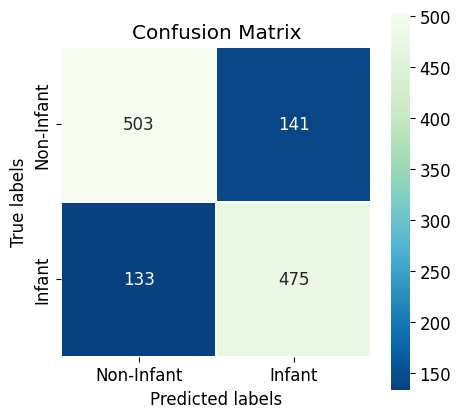

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig = plt.figure(figsize=(5, 5))

ax = plt.subplot()
sns.heatmap(cm_XGBoost, cmap='GnBu_r', annot=True, fmt='g', ax=ax, square=True, linecolor='white', linewidth=0.5)  # Annot=True to annotate cells, fmt='g' to disable scientific notation

ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Non-Infant', 'Infant'])
ax.yaxis.set_ticklabels(['Non-Infant', 'Infant'])
plt.show()

The confusion matrix shows 503 + 475 = 978 correct predictions and 141 + 133 = 274 incorrect predictions.

* True Positives (Actual Positive:1 and Predict Positive:1) - 503
* True Negatives (Actual Negative:0 and Predict Negative:0) - 475
* False Positives (Actual Negative:0 but Predict Positive:1) - 141 (Type I error)
* False Negatives (Actual Positive:1 but Predict Negative:0) - 133 (Type II error)

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

XGBoost_Accuracy_score = accuracy_score(y_test, y_pred_XGBoost)
print('Accuracy Score: {:.4f}'.format(XGBoost_Accuracy_score))

XGBoost_F1_score = f1_score(y_test, y_pred_XGBoost, average="binary", pos_label='0')
print('F1 Score: {:.4f}'.format(XGBoost_F1_score))

XGBoost_Log_loss = log_loss(y_test, y_pred_XGBoost)
print('Log Loss: {:.4f}'.format(XGBoost_Log_loss))

XGBoost_Precision_score = precision_score(y_test, y_pred_XGBoost, pos_label='0')
print('Precision Score: {:.4f}'.format(XGBoost_Precision_score))

XGBoost_Recall_score = recall_score(y_test, y_pred_XGBoost, pos_label='0')
print('Recall Score: {:.4f}'.format(XGBoost_Recall_score))

XGBoost_Roc_auc_score = roc_auc_score(y_test, y_pred_XGBoost)
print('ROC-AUC Score: {:.4f}'.format(XGBoost_Roc_auc_score))

Accuracy Score: 0.7812
F1 Score: 0.7859
Log Loss: 7.5589
Precision Score: 0.7909
Recall Score: 0.7811
ROC-AUC Score: 0.7812


# Plus

Artificial Neural Network

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 123)

Preprocessing

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
import pandas as pd
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense 
from keras import optimizers

y_train = np.asarray(y_train).astype("float64")
y_test = np.asarray(y_test).astype("float64")

# Hyper parameters
input_dim = 5 # Number of neurons in the input layer
hidden_units=100 # Number of neurons in the first hidden layer
learning_rate=0.01
hidden_layer_act='tanh'
output_layer_act='sigmoid'
epochs = 1000 # Number of training cycles

# Model
Neural_Network = Sequential() # A model consisting of successive layers
# Input layer
Neural_Network.add(Dense(hidden_units, input_dim=input_dim, activation='relu'))
# Deep layer 
Neural_Network.add(Dense(hidden_units, activation=hidden_layer_act))
# Output layer, with one neuron
Neural_Network.add(Dense(1, activation=output_layer_act))

# Compile the model
sgd = optimizers.SGD(lr=learning_rate)
Neural_Network.compile(optimizer=sgd, loss='binary_crossentropy', metrics=['acc'])

#early_stopping = keras.callbacks.EarlyStopping(patience=10, min_delta=0.001, restore_best_weights=True)

# Train the model


history = Neural_Network.fit(X_train, y_train, validation_data=(X_test, y_test), batch_size=512, 
          epochs=epochs, verbose=2) # Usar esto para llamar a early_stopping callbacks=(early_stopping),

#history_df = pd.DataFrame(history.history)
#history_df.loc[:, ['loss', 'val_loss']].plot(title="Cross-entropy")
#history_df.loc[:, ['acc', 'val_acc']].plot(title="Accuracy")


# Use the trained model to predict 'Infant' for the test data
y_pred_Neural_Network = Neural_Network.predict(X_test)


# Set a threshold of 50% for classification, i.e. > 0.5 is Non-Infant
# Note: the '*1' converts the Boolean array into an array containing 0 or 1
y_pred_Neural_Network = (y_pred_Neural_Network > 0.5)*1

Epoch 1/1000
6/6 - 1s - loss: 0.6135 - acc: 0.7032 - val_loss: 0.6046 - val_acc: 0.7029 - 1s/epoch - 185ms/step
Epoch 2/1000
6/6 - 0s - loss: 0.6005 - acc: 0.7097 - val_loss: 0.5932 - val_acc: 0.7117 - 60ms/epoch - 10ms/step
Epoch 3/1000
6/6 - 0s - loss: 0.5897 - acc: 0.7131 - val_loss: 0.5836 - val_acc: 0.7141 - 53ms/epoch - 9ms/step
Epoch 4/1000
6/6 - 0s - loss: 0.5806 - acc: 0.7172 - val_loss: 0.5755 - val_acc: 0.7157 - 70ms/epoch - 12ms/step
Epoch 5/1000
6/6 - 0s - loss: 0.5728 - acc: 0.7203 - val_loss: 0.5685 - val_acc: 0.7196 - 69ms/epoch - 11ms/step
Epoch 6/1000
6/6 - 0s - loss: 0.5661 - acc: 0.7230 - val_loss: 0.5627 - val_acc: 0.7212 - 81ms/epoch - 13ms/step
Epoch 7/1000
6/6 - 0s - loss: 0.5605 - acc: 0.7258 - val_loss: 0.5576 - val_acc: 0.7196 - 67ms/epoch - 11ms/step
Epoch 8/1000
6/6 - 0s - loss: 0.5556 - acc: 0.7275 - val_loss: 0.5532 - val_acc: 0.7204 - 57ms/epoch - 10ms/step
Epoch 9/1000
6/6 - 0s - loss: 0.5514 - acc: 0.7271 - val_loss: 0.5494 - val_acc: 0.7196 - 56ms/epo

In [ ]:
# Score
print('Classification Report:\n', classification_report(y_test, y_pred_Neural_Network))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred_Neural_Network))

Classification Report:
               precision    recall  f1-score   support

         0.0       0.78      0.77      0.78       644
         1.0       0.76      0.77      0.77       608

    accuracy                           0.77      1252
   macro avg       0.77      0.77      0.77      1252
weighted avg       0.77      0.77      0.77      1252

Confusion Matrix:
 [[498 146]
 [137 471]]


In [ ]:
# Performance
from sklearn.metrics import confusion_matrix

cm_Neural_Network = confusion_matrix(y_test, y_pred_Neural_Network)

print('Confusion matrix\n\n', cm_Neural_Network)
print('\nTrue Positives(TP) =', cm_Neural_Network[0,0])
print('\nTrue Negatives(TN) =', cm_Neural_Network[1,1])
print('\nFalse Positives(FP) =', cm_Neural_Network[0,1])
print('\nFalse Negatives(FN) =', cm_Neural_Network[1,0])

Confusion matrix

 [[498 146]
 [137 471]]

True Positives(TP) = 498

True Negatives(TN) = 471

False Positives(FP) = 146

False Negatives(FN) = 137


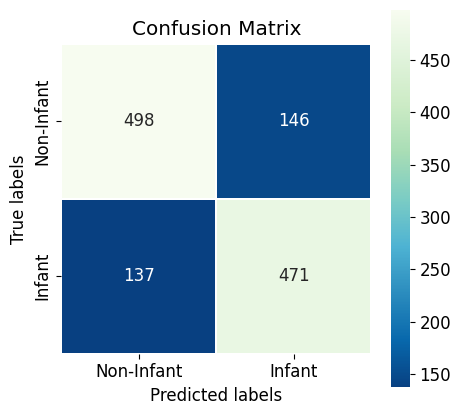

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=12
plt.rcParams['figure.figsize']=(20, 20)
plt.rcParams['figure.dpi'] = 100

colors=sns.color_palette('rocket', 5)

fig = plt.figure(figsize=(5, 5))

ax = plt.subplot()
sns.heatmap(cm_Neural_Network, cmap='GnBu_r', annot=True, fmt='g', ax=ax, square=True, linecolor='white', linewidth=0.5)  # Annot=True to annotate cells, fmt='g' to disable scientific notation

ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted labels') 
ax.set_ylabel('True labels')
ax.xaxis.set_ticklabels(['Non-Infant', 'Infant'])
ax.yaxis.set_ticklabels(['Non-Infant', 'Infant'])
plt.show()

The confusion matrix shows 501 + 471 = 972 correct predictions and 143 + 137 = 280 incorrect predictions.

* True Positives (Actual Positive:1 and Predict Positive:1) - 501
* True Negatives (Actual Negative:0 and Predict Negative:0) - 471
* False Positives (Actual Negative:0 but Predict Positive:1) - 143 (Type I error)
* False Negatives (Actual Positive:1 but Predict Negative:0) - 137 (Type II error)

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, log_loss, precision_score, recall_score, roc_auc_score

Neural_Network_Accuracy_score = accuracy_score(y_test, y_pred_Neural_Network)
print('Accuracy Score: {:.4f}'.format(Neural_Network_Accuracy_score))

Neural_Network_F1_score = f1_score(y_test, y_pred_Neural_Network, average="binary", pos_label=0.0)
print('F1 Score: {:.4f}'.format(Neural_Network_F1_score))

Neural_Network_Log_loss = log_loss(y_test, y_pred_Neural_Network)
print('Log Loss: {:.4f}'.format(Neural_Network_Log_loss))

Neural_Network_Precision_score = precision_score(y_test, y_pred_Neural_Network, pos_label=0.0)
print('Precision Score: {:.4f}'.format(Neural_Network_Precision_score))

Neural_Network_Recall_score = recall_score(y_test, y_pred_Neural_Network, pos_label=0.0)
print('Recall Score: {:.4f}'.format(Neural_Network_Recall_score))

Neural_Network_Roc_auc_score = roc_auc_score(y_test, y_pred_Neural_Network)
print('ROC-AUC Score: {:.4f}'.format(Neural_Network_Roc_auc_score))

Accuracy Score: 0.7740
F1 Score: 0.7787
Log Loss: 7.8072
Precision Score: 0.7843
Recall Score: 0.7733
ROC-AUC Score: 0.7740


# Metrics

###Testing Score (Accuracy)

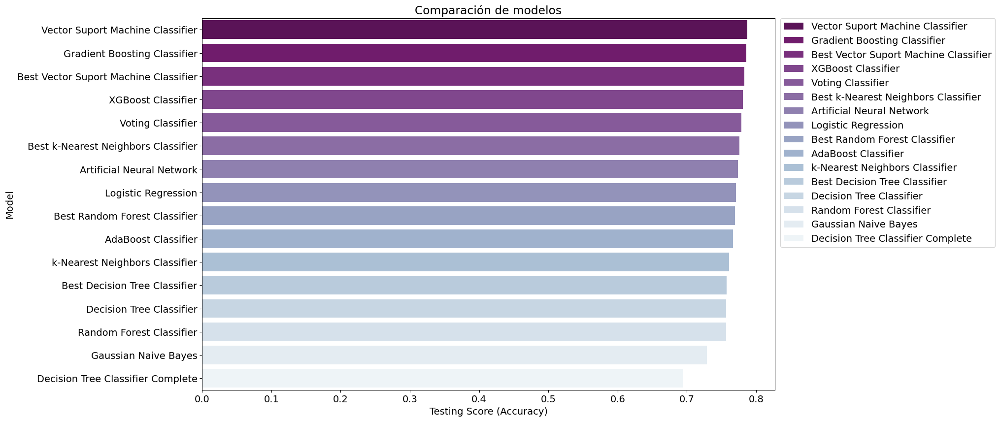

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=14
plt.rcParams['figure.figsize']=(10, 10)
plt.rcParams['figure.dpi'] = 100

df_comparacion = pd.DataFrame({'Modelo': ['Logistic Regression', 'Vector Suport Machine Classifier', 'k-Nearest Neighbors Classifier',
        'Decision Tree Classifier', 'Decision Tree Classifier Complete', 'Bernoulli Naive Bayes', 'Random Forest Classifier', 'Voting Classifier', 'AdaBoost Classifier', 'Gradient Boosting Classifier', 'XGBoost Classifier',
        'Best Vector Suport Machine Classifier', 'Best k-Nearest Neighbors Classifier', 'Best Decision Tree Classifier','Best Random Forest Classifier', 'Artificial Neural Network'],
        'Testing Score': [Logistic_Regression_Accuracy_score, Support_Vector_Machines_Accuracy_score, kNN_Accuracy_score, Decision_Trees_Accuracy_score, 
        Decision_Trees_complete_Accuracy_score, Bernoulli_NB_Accuracy_score, Random_Forest_Accuracy_score, Voting_Accuracy_score, AdaBoost_Accuracy_score, Gradient_Boosting_Accuracy_score, XGBoost_Accuracy_score, 
        Support_Vector_Machines_best_Accuracy_score, kNN_best_Accuracy_score, Decision_Trees_best_Accuracy_score, Random_Forest_best_Accuracy_score, Neural_Network_Accuracy_score]})


fig, ax = plt.subplots(figsize=(15, 10))

sns.barplot(data=df_comparacion.sort_values('Testing Score', ascending=False), x='Testing Score', y='Modelo', hue='Modelo', palette='BuPu_r', dodge=False)
ax.set_title('Comparación de modelos')
ax.set_ylabel('Model')
ax.set_xlabel('Testing Score (Accuracy)')
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0)
plt.show()

### F1 Score

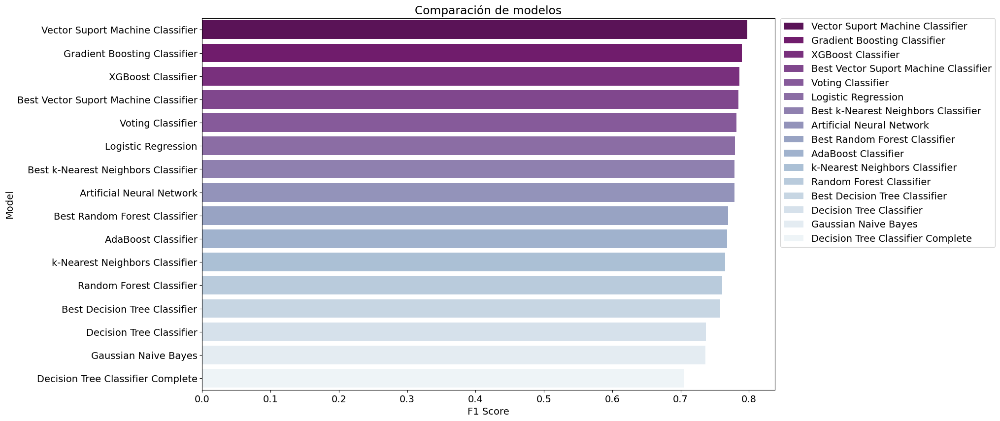

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=14
plt.rcParams['figure.figsize']=(10, 10)
plt.rcParams['figure.dpi'] = 100

df_comparacion = pd.DataFrame({'Modelo': ['Logistic Regression', 'Vector Suport Machine Classifier', 'k-Nearest Neighbors Classifier',
        'Decision Tree Classifier', 'Decision Tree Classifier Complete', 'Bernoulli Naive Bayes', 'Random Forest Classifier', 'Voting Classifier', 'AdaBoost Classifier', 'Gradient Boosting Classifier', 'XGBoost Classifier',
        'Best Vector Suport Machine Classifier', 'Best k-Nearest Neighbors Classifier', 'Best Decision Tree Classifier','Best Random Forest Classifier', 'Artificial Neural Network'],
        'F1 Score': [Logistic_Regression_F1_score, Support_Vector_Machines_F1_score, kNN_F1_score, Decision_Trees_F1_score, 
        Decision_Trees_complete_F1_score, Bernoulli_NB_F1_score, Random_Forest_F1_score, Voting_F1_score, AdaBoost_F1_score, Gradient_Boosting_F1_score, XGBoost_F1_score, 
        Support_Vector_Machines_best_F1_score, kNN_best_F1_score, Decision_Trees_best_F1_score, Random_Forest_best_F1_score, Neural_Network_F1_score]})


fig, ax = plt.subplots(figsize=(15, 10))

sns.barplot(data=df_comparacion.sort_values('F1 Score', ascending=False), x='F1 Score', y='Modelo', hue='Modelo', palette='BuPu_r', dodge=False)
ax.set_title('Comparación de modelos')
ax.set_ylabel('Model')
ax.set_xlabel('F1 Score')
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0)
plt.show()

### ROC-AUC Score

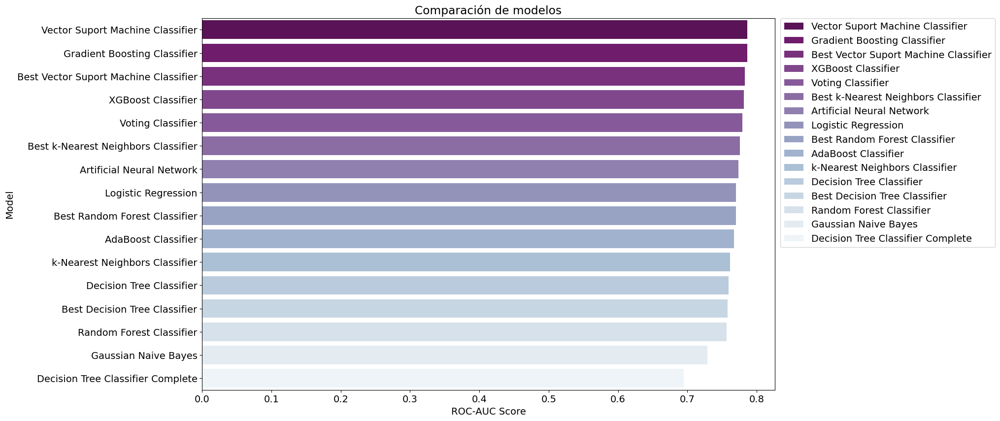

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=14
plt.rcParams['figure.figsize']=(10, 10)
plt.rcParams['figure.dpi'] = 100

df_comparacion = pd.DataFrame({'Modelo': ['Logistic Regression', 'Vector Suport Machine Classifier', 'k-Nearest Neighbors Classifier',
        'Decision Tree Classifier', 'Decision Tree Classifier Complete', 'Bernoulli Naive Bayes', 'Random Forest Classifier', 'Voting Classifier', 'AdaBoost Classifier', 'Gradient Boosting Classifier', 'XGBoost Classifier',
        'Best Vector Suport Machine Classifier', 'Best k-Nearest Neighbors Classifier', 'Best Decision Tree Classifier','Best Random Forest Classifier', 'Artificial Neural Network'],
        'ROC-AUC Score': [Logistic_Regression_Roc_auc_score, Support_Vector_Machines_Roc_auc_score, kNN_Roc_auc_score, Decision_Trees_Roc_auc_score, 
        Decision_Trees_complete_Roc_auc_score, Bernoulli_NB_Roc_auc_score, Random_Forest_Roc_auc_score, Voting_Roc_auc_score, AdaBoost_Roc_auc_score, Gradient_Boosting_Roc_auc_score, XGBoost_Roc_auc_score, 
        Support_Vector_Machines_best_Roc_auc_score, kNN_best_Roc_auc_score, Decision_Trees_best_Roc_auc_score, Random_Forest_best_Roc_auc_score, Neural_Network_Roc_auc_score]})


fig, ax = plt.subplots(figsize=(15, 10))

sns.barplot(data=df_comparacion.sort_values('ROC-AUC Score', ascending=False), x='ROC-AUC Score', y='Modelo', hue='Modelo', palette='BuPu_r', dodge=False)
ax.set_title('Comparación de modelos')
ax.set_ylabel('Model')
ax.set_xlabel('ROC-AUC Score')
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0)
plt.show()

### Log Loss Score

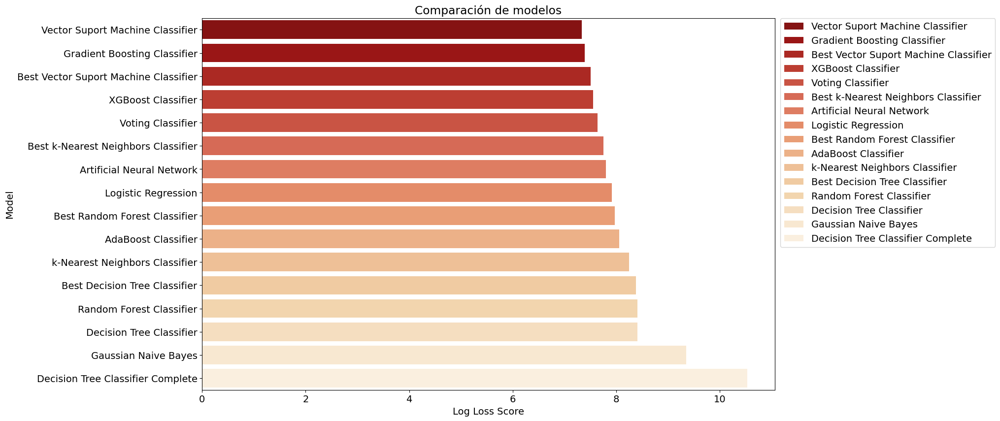

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=14
plt.rcParams['figure.figsize']=(10, 10)
plt.rcParams['figure.dpi'] = 100

df_comparacion = pd.DataFrame({'Modelo': ['Logistic Regression', 'Vector Suport Machine Classifier', 'k-Nearest Neighbors Classifier',
        'Decision Tree Classifier', 'Decision Tree Classifier Complete', 'Bernoulli Naive Bayes', 'Random Forest Classifier', 'Voting Classifier', 'AdaBoost Classifier', 'Gradient Boosting Classifier', 'XGBoost Classifier',
        'Best Vector Suport Machine Classifier', 'Best k-Nearest Neighbors Classifier', 'Best Decision Tree Classifier','Best Random Forest Classifier', 'Artificial Neural Network'],
        'Log Loss Score': [Logistic_Regression_Log_loss, Support_Vector_Machines_Log_loss, kNN_Log_loss, Decision_Trees_Log_loss, 
        Decision_Trees_complete_Log_loss, Bernoulli_NB_Log_loss, Random_Forest_Log_loss, Voting_Log_loss, AdaBoost_Log_loss, Gradient_Boosting_Log_loss, XGBoost_Log_loss, 
        Support_Vector_Machines_best_Log_loss, kNN_best_Log_loss, Decision_Trees_best_Log_loss, Random_Forest_best_Log_loss, Neural_Network_Log_loss]})


fig, ax = plt.subplots(figsize=(15, 10))

sns.barplot(data=df_comparacion.sort_values('Log Loss Score', ascending=True), x='Log Loss Score', y='Modelo', hue='Modelo', palette='OrRd_r', dodge=False)
ax.set_title('Comparación de modelos')
ax.set_ylabel('Model')
ax.set_xlabel('Log Loss Score')
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0)
plt.show()

##Type II Error

Algoritmo de predicción de infantes según características físicas (dimensiones, peso):

- **Falso positivo o “Error tipo I”:** El abulón no es infante, pero el algoritmo ha diagnosticado que sí lo es. Por lo tanto, el abulón es un adulto. Sera devuelto al ecosistema para proteger los efectos negativos en la especie por la extracción por pesca, no sugiere un coste económico y un impacto ambiental sobre el ecosistema, pero perjudica actividades de pesca y comercio.

- **Falso negativo o “Error tipo II”:** El abulón sí es infante, pero el algoritmo predice que no lo es. Por lo tanto, el abulón es un infante que es reconocido como un adulto y no es devuelto al ecosistema, se generaran efectos negativos en la especie por la extracción por pesca, sugiere un coste económico y un impacto ambiental sobre el ecosistema, a futuro perjudica actividades de pesca y comercio.



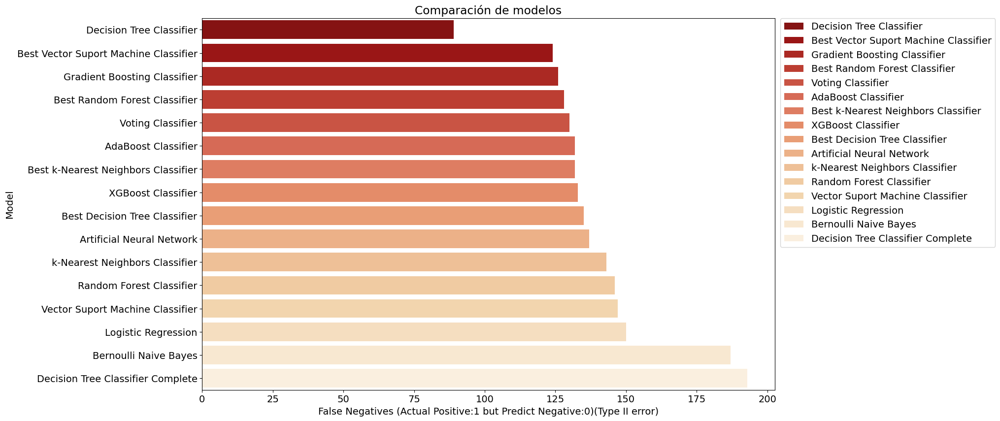

In [ ]:
mpl.rcParams['pdf.fonttype']=42
mpl.rcParams['font.size']=14
plt.rcParams['figure.figsize']=(10, 10)
plt.rcParams['figure.dpi'] = 100

df_comparacion = pd.DataFrame({'Modelo': ['Logistic Regression', 'Vector Suport Machine Classifier', 'k-Nearest Neighbors Classifier',
        'Decision Tree Classifier', 'Decision Tree Classifier Complete', 'Bernoulli Naive Bayes', 'Random Forest Classifier', 'Voting Classifier', 'AdaBoost Classifier', 'Gradient Boosting Classifier', 'XGBoost Classifier',
        'Best Vector Suport Machine Classifier', 'Best k-Nearest Neighbors Classifier', 'Best Decision Tree Classifier','Best Random Forest Classifier', 'Artificial Neural Network'],
        'False Negatives (Actual Positive:1 but Predict Negative:0)(Type II error)': [cm_Logistic_Regression[1,0], cm_Support_Vector_Machines[1,0], cm_kNN[1,0], cm_Decision_Trees[1,0], 
        cm_Decision_Trees_complete[1,0], cm_Bernoulli_NB[1,0], cm_Random_Forest[1,0], cm_Voting[1,0], cm_AdaBoost[1,0], cm_Gradient_Boosting[1,0], cm_XGBoost[1,0], 
        cm_Support_Vector_Machines_best[1,0], cm_kNN_best[1,0], cm_Decision_Trees_best[1,0], cm_Random_Forest_best[1,0], cm_Neural_Network[1,0]]})


fig, ax = plt.subplots(figsize=(15, 10))

sns.barplot(data=df_comparacion.sort_values('False Negatives (Actual Positive:1 but Predict Negative:0)(Type II error)', ascending=True), x='False Negatives (Actual Positive:1 but Predict Negative:0)(Type II error)', y='Modelo', hue='Modelo', palette='OrRd_r', dodge=False)
ax.set_title('Comparación de modelos')
ax.set_ylabel('Model')
ax.set_xlabel('False Negatives (Actual Positive:1 but Predict Negative:0)(Type II error)')
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0)
plt.show()

Se debe evitar el Falso negativo o “Error tipo II”, por lo tanto se debe escoger el modelo de predicción que sea mejor en este aspecto, por consiguiente el mejor algoritmo realizando la clasificación de infantes es el Decision Trees con $89$ falsos negativos, por esta razón será el modelo elegido para hacer las predicciones. 

Las clasificaciones demuestran el principio de la navaja de Occam con bastante distinción, porque un Decision Trees (DT) es uno de los modelos más simples y aun así supera a los modelos más complejos (Random Forest, Artificial Neural Network)

# Conclusions

<font color='red'>El valor Testing Score (Accuracy) resultante de todos los modelos se muestra en las graficas anteriores entre otras metricas de interés, los modelos se clasifican de mejor a peor (en todas las gráficas). El modelo de mejor desempeño es el Vector Suport Machine (VSM) con núcleo lineal ($147$ falsos negativos) que tiene el Log Loss más bajo de $7.3382$. Los segundos modelos con mejor rendimiento son el modelo de ensemble learning Gradient Boosting Classifier, el Vector Suport Machine (VSM) con núcleo de base radial y posteriormente el modelo de ensemble learning XGBoost Classifier. Se debe evitar el Falso negativo o “Error tipo II”, por lo tanto se debe escoger el modelo de Decision Trees ($89$ falsos negativos) (Accuracy Score: $0.7564$, F1 Score: $0.7373$, Log Loss: $8.4141$, Precision Score: $0.8279$, Recall Score: $0.6646$, ROC-AUC Score: $0.7591$).
El modelo de peor desempeño es el modelo Decision Trees Complete con un Accuracy Score: $0.6949$, y un error Log Loss: $10.5383$ seguido del modelo de Naive Bayes. Los valores Testing Score (Accuracy) de todos los modelos son muy parecidos entre sí y no se puede concluir necesariamente que esta clasificación sea absoluta para el conjunto de datos de abulón.</font>

<font color='red'>Las clasificaciones demuestran el principio de la navaja de Occam con bastante distinción, porque un Vector Suport Machine (VSM) con núcleo lineal es uno de los modelos más simples y aun así supera a los modelos más complejos (Random Forest, Artificial Neural Network).</font>


# References

[1] Gluyas-Millán, M. G., & Talavera-Maya, J. (2003). Size and age composition of the populations of abalone Haliotis fulgens and H. corrugata of Bahía Tortugas, Baja California Sur, Mexico. Ciencias Marinas, 29(1), 89-101.

[2] Pedregosa, F., Varoquaux, Ga"el, Gramfort, A., Michel, V., Thirion, B., Grisel, O., … others. (2011). Scikit-learn: Machine learning in Python. Journal of Machine Learning Research, 12(Oct), 2825–2830.

[3] Pauli Virtanen, Ralf Gommers, Travis E. Oliphant, Matt Haberland, Tyler Reddy, David Cournapeau, Evgeni Burovski, Pearu Peterson, Warren Weckesser, Jonathan Bright, Stéfan J. van der Walt, Matthew Brett, Joshua Wilson, K. Jarrod Millman, Nikolay Mayorov, Andrew R. J. Nelson, Eric Jones, Robert Kern, Eric Larson, CJ Carey, İlhan Polat, Yu Feng, Eric W. Moore, Jake VanderPlas, Denis Laxalde, Josef Perktold, Robert Cimrman, Ian Henriksen, E.A. Quintero, Charles R Harris, Anne M. Archibald, Antônio H. Ribeiro, Fabian Pedregosa, Paul van Mulbregt, and SciPy 1.0 Contributors. (2020) SciPy 1.0: Fundamental Algorithms for Scientific Computing in Python. Nature Methods, 17(3), 261-272.

[4] James, G., Witten, D., Hastie, T., & Tibshirani, R. (2013). An introduction to statistical learning (Vol. 112, p. 18). New York: springer.

[5] McKinney, W. (2012). Python for data analysis: Data wrangling with Pandas, NumPy, and IPython. " O'Reilly Media, Inc.".

[6] Géron, A. (2022). Hands-on machine learning with Scikit-Learn, Keras, and TensorFlow. " O'Reilly Media, Inc.".

https://www.kaggle.com/code/sanchitvj/abalone-age-prediction

https://charlesreid1.github.io/circe/Abalone%20-%20Variable%20Interactions.html

https://www.kaggle.com/code/rodolfomendes/abalone-exploratory-data-analysis/notebook


